In [3]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 PIRELLI GRAN PREMIO D'ITALIA 2025
The Italian Grand Prix (Italian: Gran Premio d'Italia) is the fifth oldest national motor racing Grand Prix (after the French Grand Prix, the United States Grand Prix, the Spanish Grand Prix and the Russian Grand Prix), having been held since 1921. Since 2013, it has been the Grand Prix held the most times, with 93 editions as of 2023. It is one of the two Grands Prix (along with the British) which has run as an event of the Formula One World Championship Grands Prix every season, continuously since the championship was introduced in 1950. Every Formula One Italian Grand Prix in the World Championship era has been held at Monza except in 1980, when it was held at Imola.

The Italian Grand Prix counted toward the World Manufacturers' Championship from 1925 to 1928 and toward the European Championship from 1931 to 1932 and from 1935 to 1938. It was additionally designated the European Grand Prix seven times between 1923 and 1967, when this title was an honorary designation given each year to one Grand Prix race in Europe. Four editions before the World Championship were held in places other than Monza: Montichiari (1921), Livorno (1937), Milan (1947) and Turin (1948).

The event is due to take place at the Monza Circuit until at least 2025.
Source: Wikipedia

Analyzed by Franccy del Piero Sambrano Ganoza

## Obtain session information

In [4]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='ITA').query("circuit_short_name == 'Monza'")

,meeting_key,session_key,location,date_start,date_end,session_type,session_name,country_key,country_code,country_name,circuit_key,circuit_short_name,gmt_offset,year
5,1268,9905,Monza,2025-09-05T11:30:00+00:00,2025-09-05T12:30:00+00:00,Practice,Practice 1,13,ITA,Italy,39,Monza,02:00:00,2025
6,1268,9906,Monza,2025-09-05T15:00:00+00:00,2025-09-05T16:00:00+00:00,Practice,Practice 2,13,ITA,Italy,39,Monza,02:00:00,2025
7,1268,9907,Monza,2025-09-06T10:30:00+00:00,2025-09-06T11:30:00+00:00,Practice,Practice 3,13,ITA,Italy,39,Monza,02:00:00,2025
8,1268,9908,Monza,2025-09-06T14:00:00+00:00,2025-09-06T15:00:00+00:00,Qualifying,Qualifying,13,ITA,Italy,39,Monza,02:00:00,2025
9,1268,9912,Monza,2025-09-07T13:00:00+00:00,2025-09-07T15:00:00+00:00,Race,Race,13,ITA,Italy,39,Monza,02:00:00,2025


## Free Practice 1
### Obtain setup

In [5]:
practice = libraryDataF1.obtain_information('laps',session_key=9905)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9905)
drivers = libraryDataF1.obtain_information('drivers',session_key=9905)

In [10]:
drivers

,meeting_key,session_key,driver_number,broadcast_name,full_name,name_acronym,team_name,team_colour,first_name,last_name,headshot_url,country_code
0,1268,9905,4,L NORRIS,Lando NORRIS,NOR,McLaren,F47600,Lando,Norris,https://media.formula1.com/d_driver_fallback_i...,None
1,1268,9905,6,I HADJAR,Isack HADJAR,HAD,Racing Bulls,6C98FF,Isack,Hadjar,https://media.formula1.com/d_driver_fallback_i...,None
2,1268,9905,10,P GASLY,Pierre GASLY,GAS,Alpine,00A1E8,Pierre,Gasly,https://media.formula1.com/d_driver_fallback_i...,None
3,1268,9905,12,K ANTONELLI,Kimi ANTONELLI,ANT,Mercedes,00D7B6,Kimi,Antonelli,https://media.formula1.com/d_driver_fallback_i...,None
4,1268,9905,14,F ALONSO,Fernando ALONSO,ALO,Aston Martin,229971,Fernando,Alonso,https://media.formula1.com/d_driver_fallback_i...,None
5,1268,9905,16,C LECLERC,Charles LECLERC,LEC,Ferrari,ED1131,Charles,Leclerc,https://media.formula1.com/d_driver_fallback_i...,None
6,1268,9905,18,L STROLL,Lance STROLL,STR,Aston Martin,229971,Lance,Stroll,https://media.formula1.com/d_driver_fallback_i...,None
7,1268,9905,22,Y TSUNODA,Yuki TSUNODA,TSU,Red Bull Racing,4781D7,Yuki,Tsunoda,https://media.formula1.com/d_driver_fallback_i...,None
8,1268,9905,30,L LAWSON,Liam LAWSON,LAW,Racing Bulls,6C98FF,Liam,Lawson,https://media.formula1.com/d_driver_fallback_i...,None
9,1268,9905,44,L HAMILTON,Lewis HAMILTON,HAM,Ferrari,ED1131,Lewis,Hamilton,https://media.formula1.com/d_driver_fallback_i...,None


In [6]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

TypeError: can only concatenate str (not "NoneType") to str

### Speed trap

In [ ]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

In [ ]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

In [ ]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [ ]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.

In [ ]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


In [ ]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

In [ ]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

In [ ]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

In [ ]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [ ]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False and lap_duration >88  and lap_duration <=82").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

## Free Practice 2
### Obtain setup

In [11]:
practice = libraryDataF1.obtain_information('laps',session_key=9906)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9906)
drivers = libraryDataF1.obtain_information('drivers',session_key=9906)

In [12]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

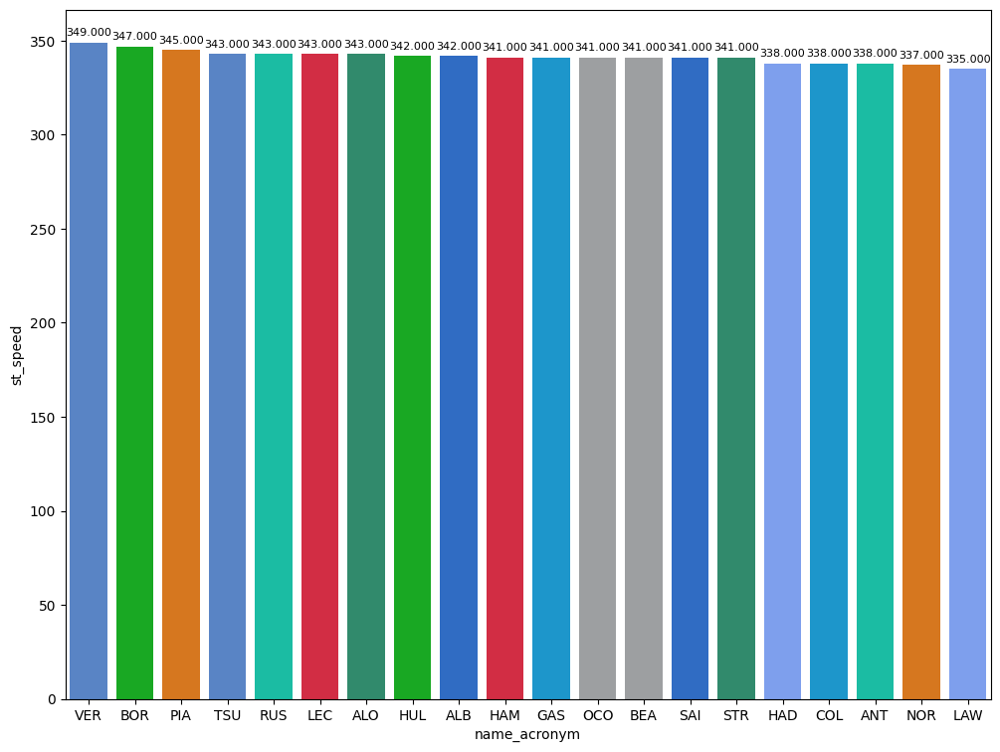

In [13]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

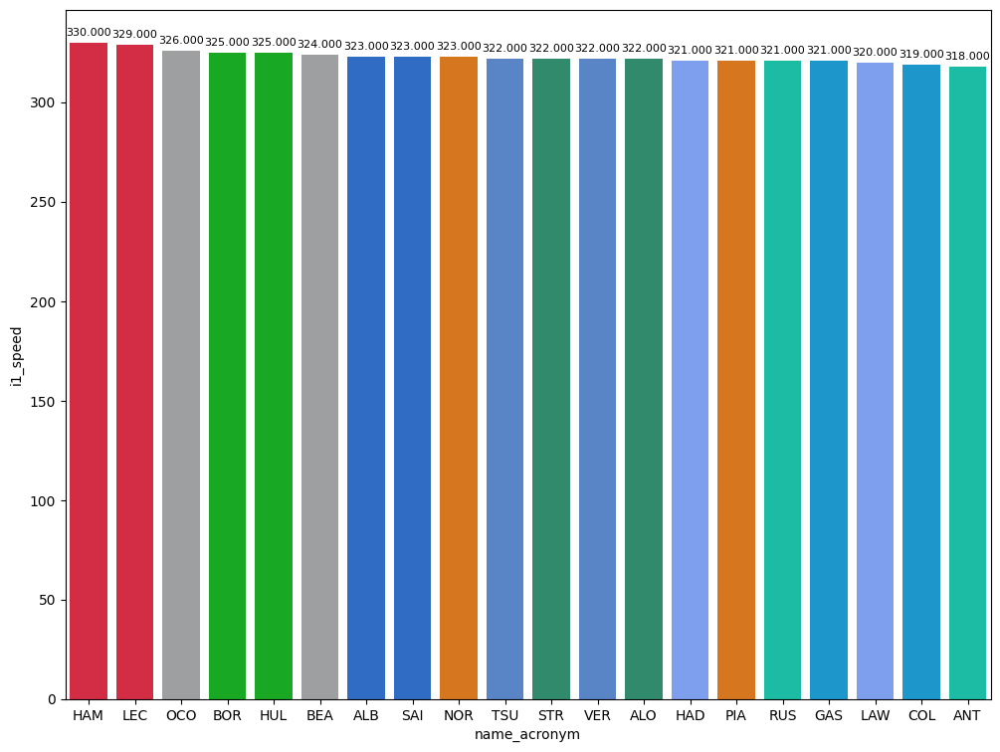

In [14]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

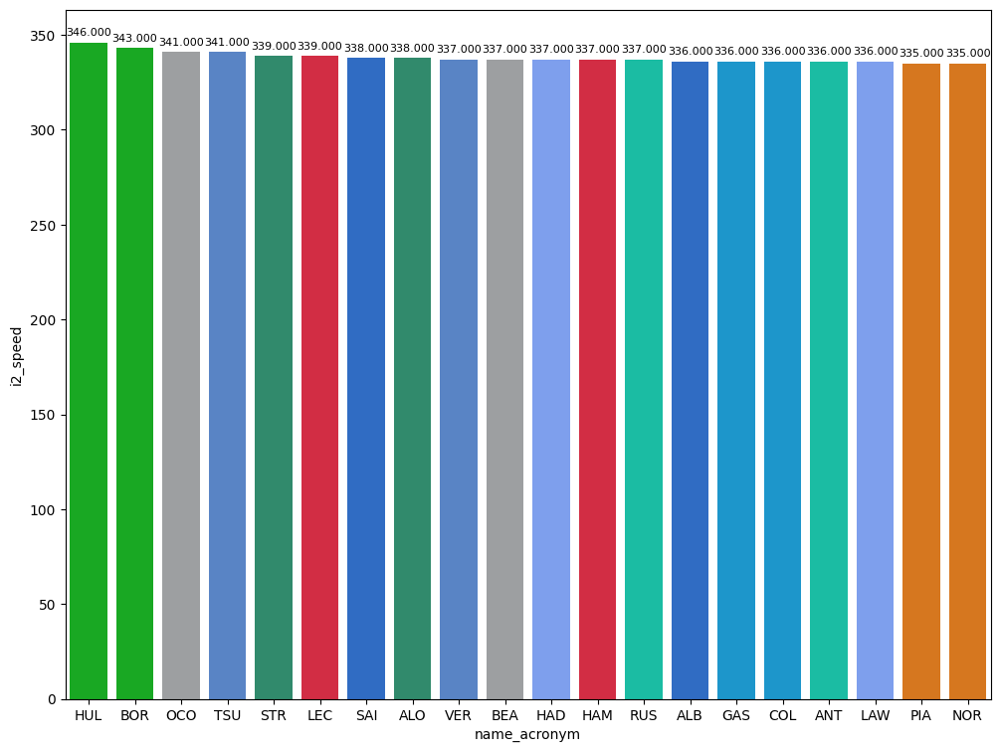

In [15]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [16]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
147,Charles LECLERC,HARD,26.944,27.319,26.674,80.937
161,Carlos SAINZ,MEDIUM,26.804,26.991,26.788,80.583
189,Lando NORRIS,SOFT,26.704,26.734,26.440,79.878


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.Due to changing conditions, only a part of the free practice were important and this part will be taken into consideration.

In [17]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


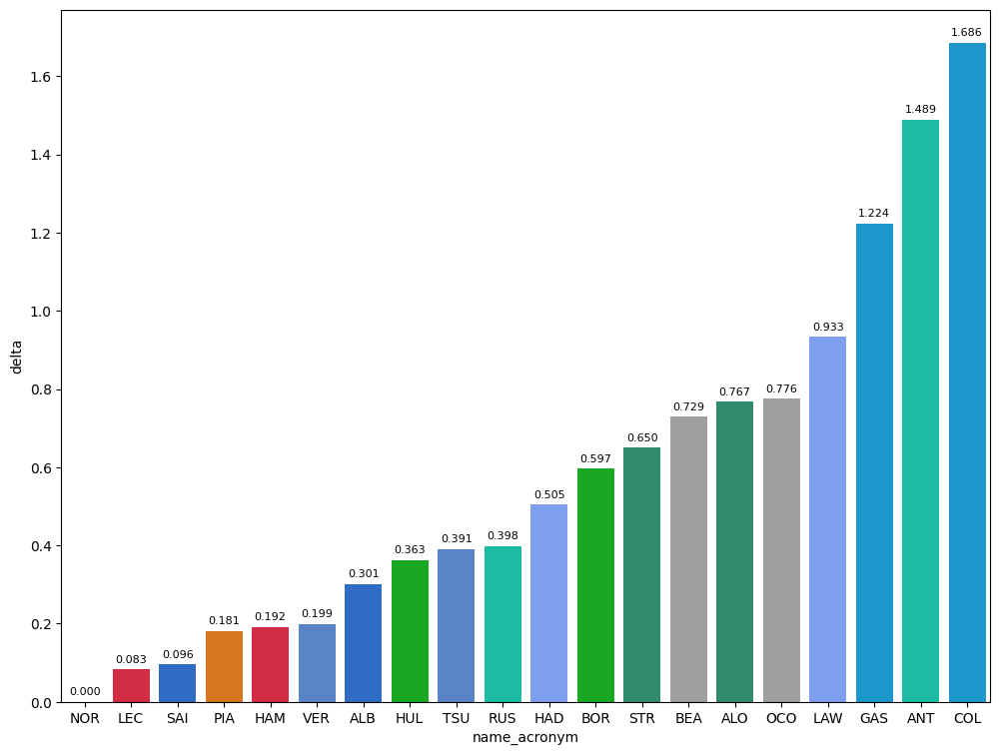

In [18]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

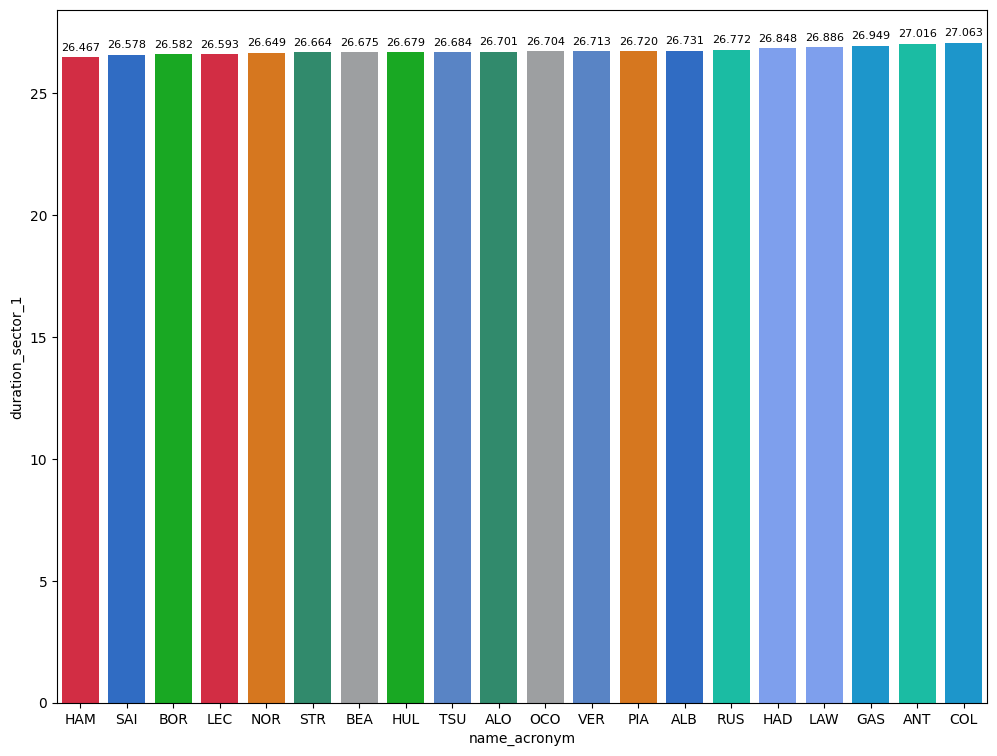

In [19]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

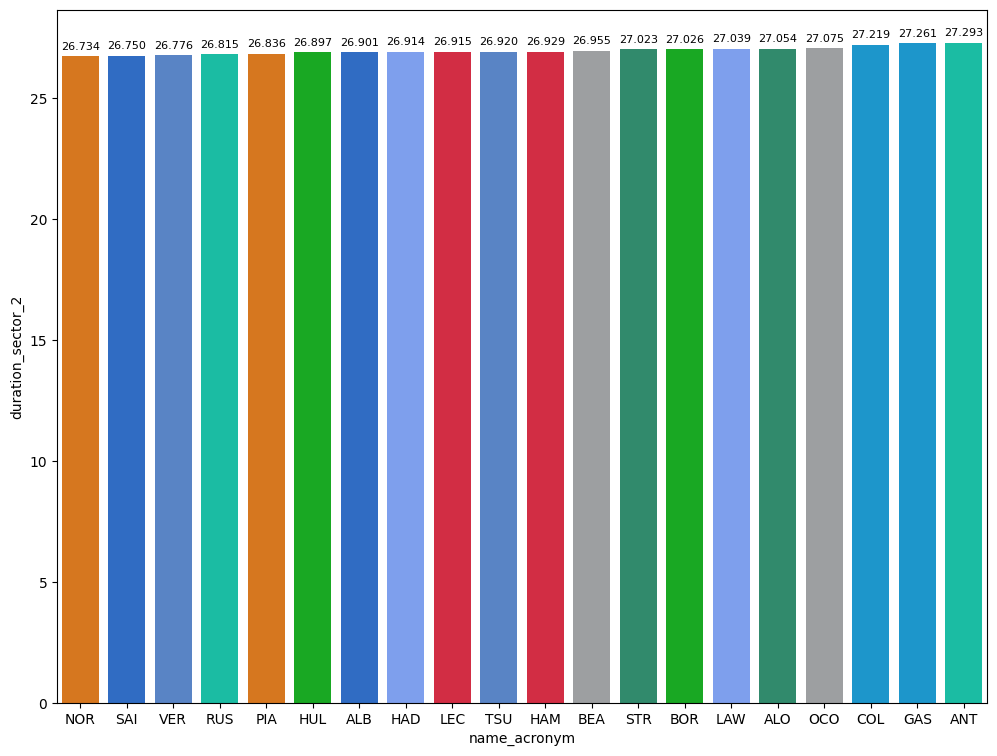

In [20]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

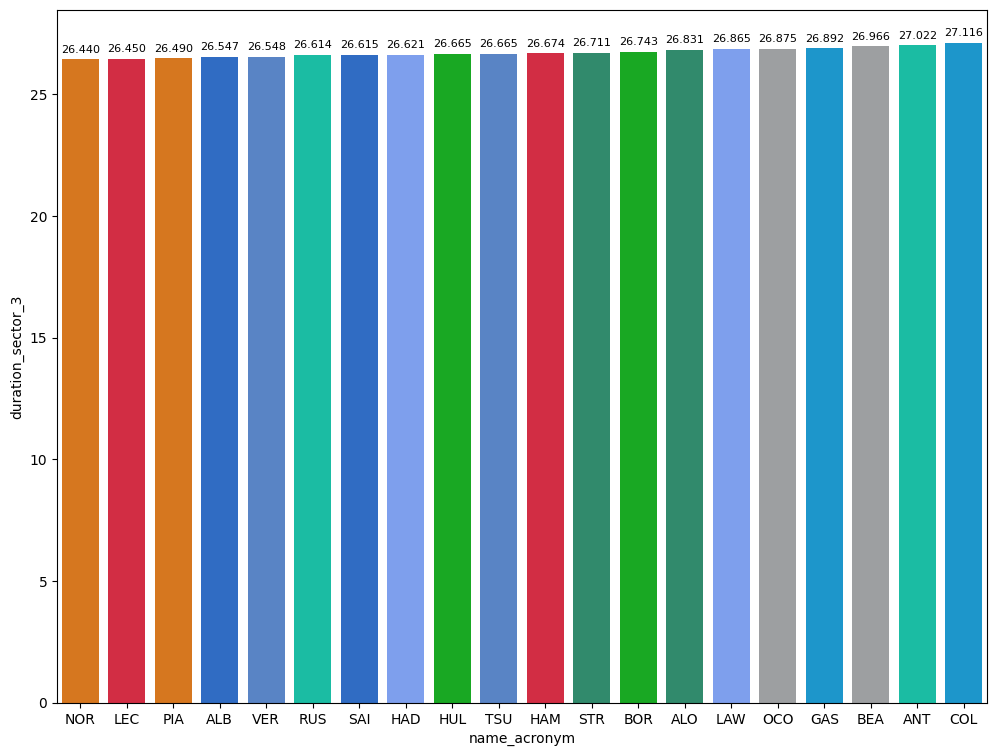

In [21]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [22]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration>83 and lap_duration <=86").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,84.327435
HARD,84.386024
SOFT,84.563429


### Long runs

In [23]:
MINIMUN_SECONDS = 83
MAXIMUM_SECONDS = 86

#### Red Bull Racing

In [24]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
15,1268,9906,1,1,1,4,MEDIUM,0
17,1268,9906,1,22,1,4,MEDIUM,0
25,1268,9906,2,1,5,7,MEDIUM,4
26,1268,9906,2,22,5,7,MEDIUM,4
43,1268,9906,3,1,8,9,MEDIUM,7
48,1268,9906,3,22,8,11,MEDIUM,7
66,1268,9906,4,1,10,14,SOFT,0
73,1268,9906,4,22,12,17,SOFT,0
94,1268,9906,5,22,18,28,MEDIUM,11
95,1268,9906,5,1,15,27,MEDIUM,9


In [25]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
324,Max VERSTAPPEN,MEDIUM,2025-09-05T15:46:56.485000+00:00,16,27.982,28.417,27.839,84.238
341,Max VERSTAPPEN,MEDIUM,2025-09-05T15:48:20.751000+00:00,17,27.574,28.348,27.815,83.737
358,Max VERSTAPPEN,MEDIUM,2025-09-05T15:49:44.383000+00:00,18,27.142,28.695,27.802,83.639
376,Max VERSTAPPEN,MEDIUM,2025-09-05T15:51:08.183000+00:00,19,27.508,28.601,28.270,84.379
395,Max VERSTAPPEN,MEDIUM,2025-09-05T15:52:32.528000+00:00,20,27.377,29.394,27.731,84.502
413,Max VERSTAPPEN,MEDIUM,2025-09-05T15:53:56.884000+00:00,21,27.684,28.195,27.584,83.463
432,Max VERSTAPPEN,MEDIUM,2025-09-05T15:55:20.429000+00:00,22,27.731,28.178,27.626,83.535
451,Max VERSTAPPEN,MEDIUM,2025-09-05T15:56:43.962000+00:00,23,27.590,28.362,28.772,84.724
469,Max VERSTAPPEN,MEDIUM,2025-09-05T15:58:08.667000+00:00,24,27.650,28.315,27.597,83.562
487,Max VERSTAPPEN,MEDIUM,2025-09-05T15:59:32.375000+00:00,25,27.752,28.216,27.474,83.442


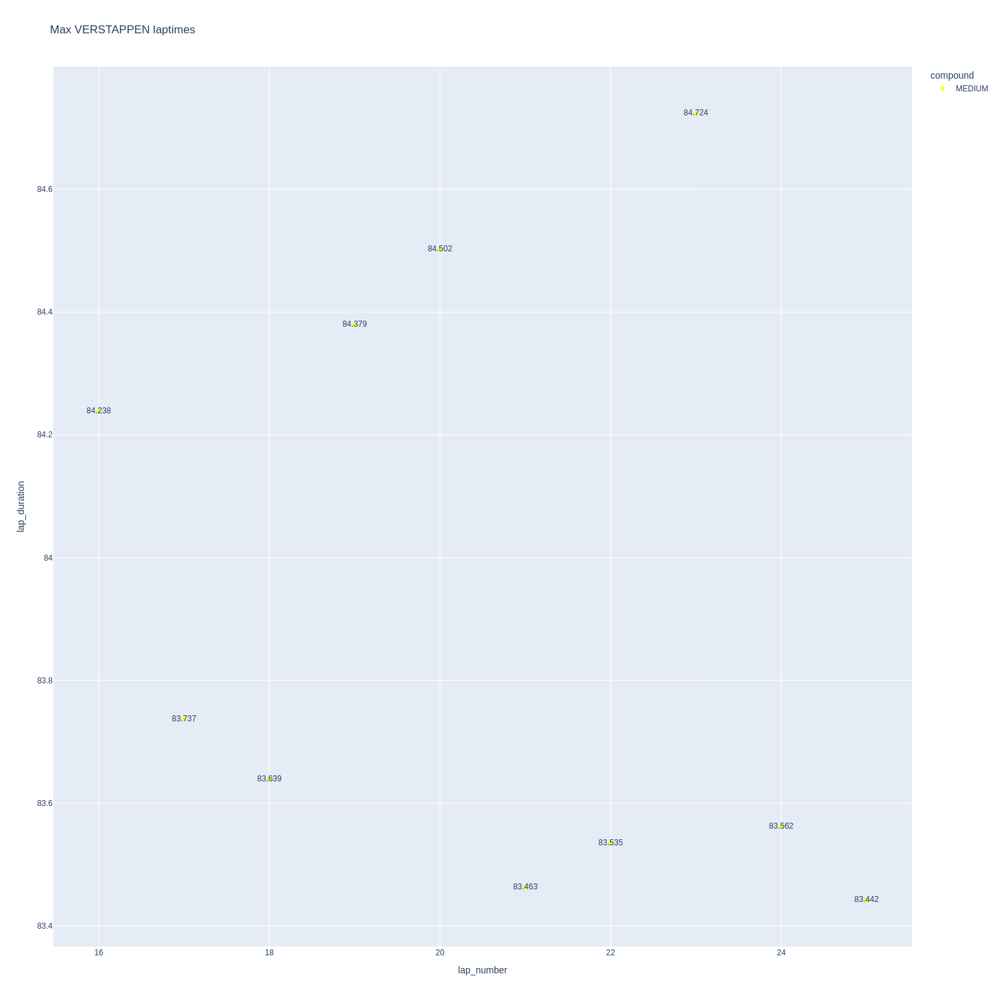

In [26]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

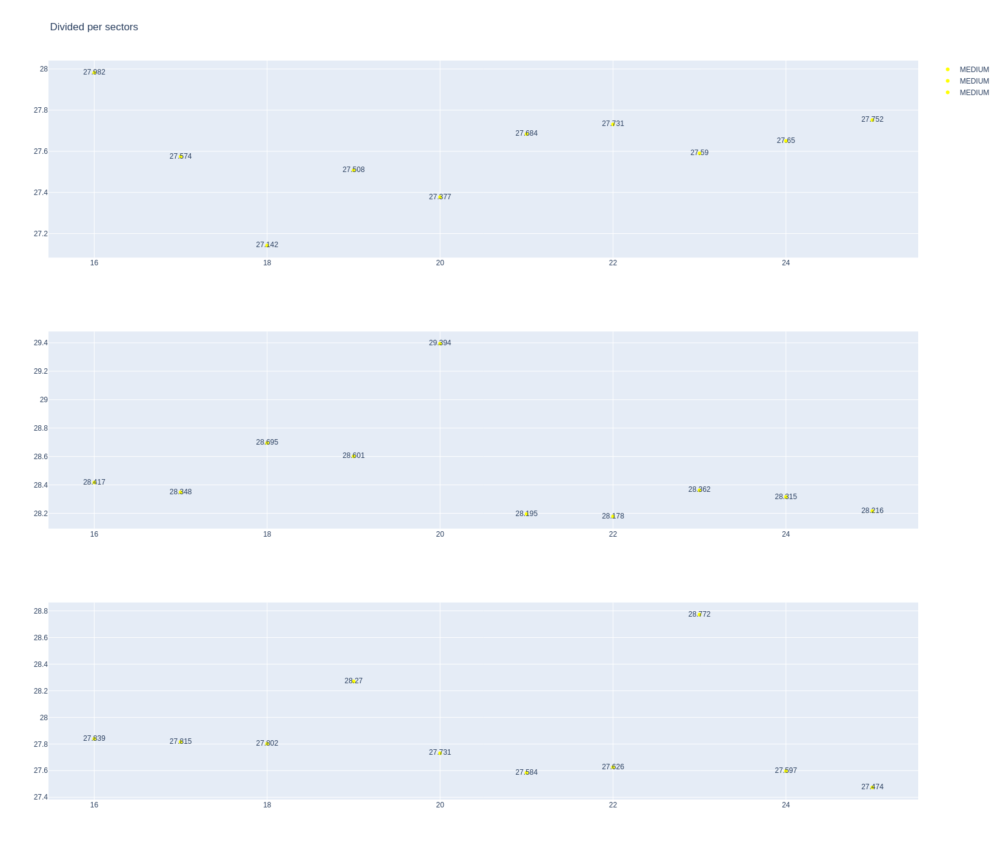

In [27]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [28]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
39,Yuki TSUNODA,MEDIUM,2025-09-05T15:03:44.684000+00:00,2,27.064,29.201,27.399,83.664
353,Yuki TSUNODA,MEDIUM,2025-09-05T15:49:23.713000+00:00,19,28.901,28.900,28.123,85.924
372,Yuki TSUNODA,MEDIUM,2025-09-05T15:50:49.645000+00:00,20,27.877,28.871,28.053,84.801
391,Yuki TSUNODA,MEDIUM,2025-09-05T15:52:14.331000+00:00,21,28.062,28.815,28.153,85.030
410,Yuki TSUNODA,MEDIUM,2025-09-05T15:53:39.422000+00:00,22,27.979,28.847,28.031,84.857
429,Yuki TSUNODA,MEDIUM,2025-09-05T15:55:04.266000+00:00,23,27.862,28.771,27.979,84.612
448,Yuki TSUNODA,MEDIUM,2025-09-05T15:56:28.924000+00:00,24,27.785,28.741,27.904,84.430
467,Yuki TSUNODA,MEDIUM,2025-09-05T15:57:53.277000+00:00,25,27.822,28.959,28.026,84.807
485,Yuki TSUNODA,MEDIUM,2025-09-05T15:59:18.075000+00:00,26,27.850,28.914,28.126,84.890


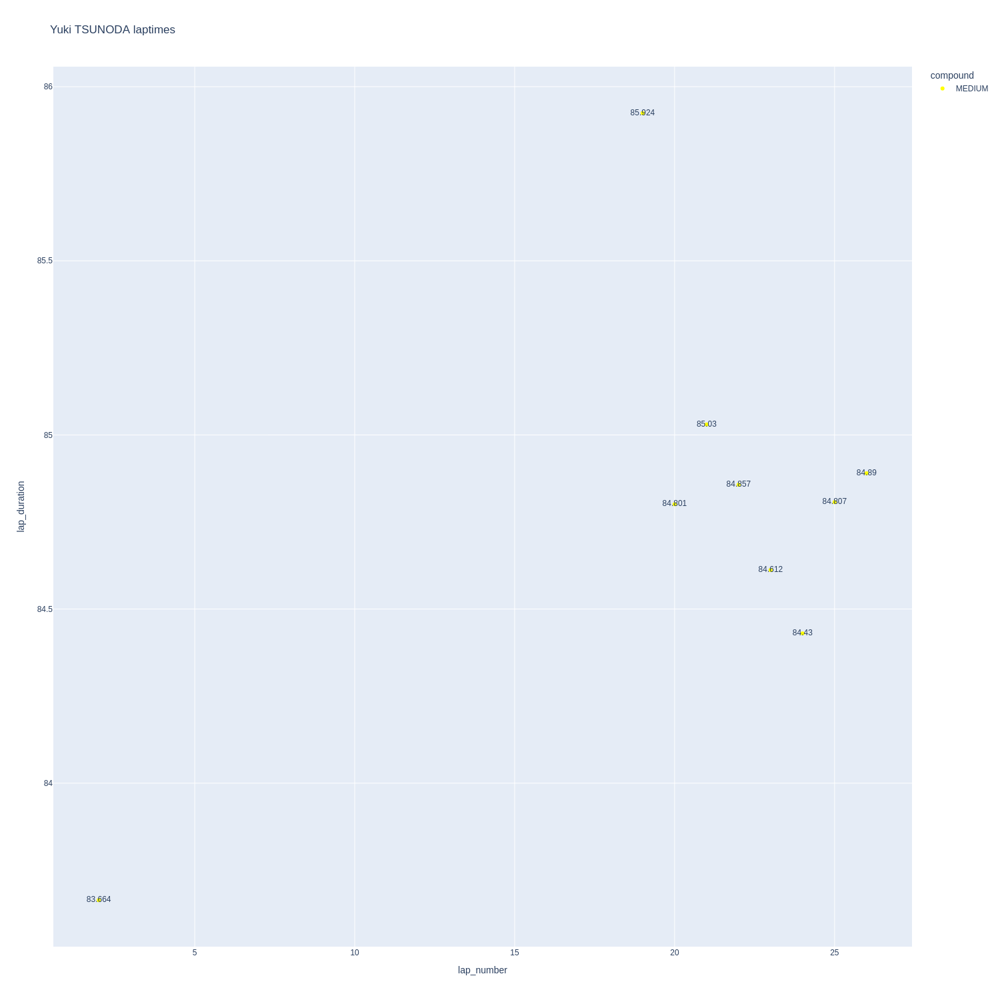

In [29]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

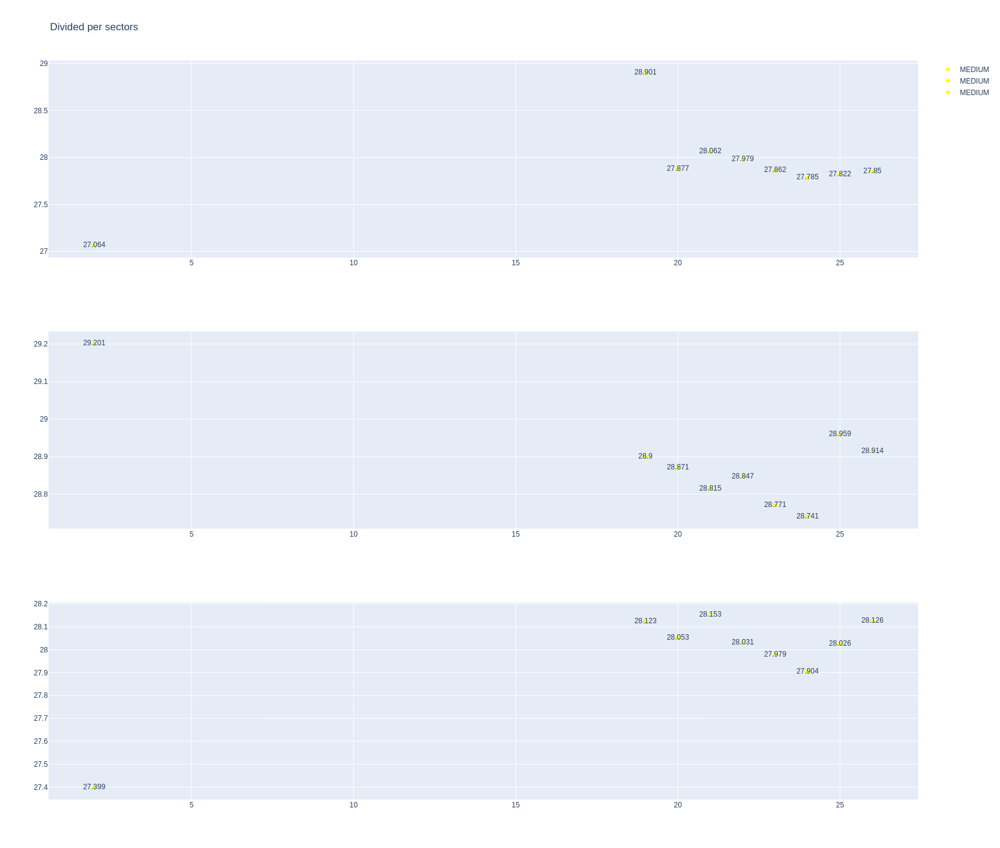

In [30]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [31]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1268,9906,1,16,1,5,HARD,0
19,1268,9906,1,44,1,4,HARD,0
37,1268,9906,2,16,6,10,HARD,5
40,1268,9906,2,44,5,8,HARD,4
51,1268,9906,3,16,11,13,SOFT,0
55,1268,9906,3,44,9,11,SOFT,0
70,1268,9906,4,44,12,14,SOFT,3
74,1268,9906,4,16,14,18,SOFT,3
96,1268,9906,5,16,19,29,SOFT,8
97,1268,9906,5,44,15,26,HARD,8


In [32]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
354,Charles LECLERC,SOFT,2025-09-05T15:49:33.928000+00:00,20,27.451,28.506,27.728,83.685
392,Charles LECLERC,SOFT,2025-09-05T15:52:25.482000+00:00,22,28.815,28.897,28.062,85.774
411,Charles LECLERC,SOFT,2025-09-05T15:53:51.113000+00:00,23,27.647,28.552,27.826,84.025
430,Charles LECLERC,SOFT,2025-09-05T15:55:15.213000+00:00,24,27.561,28.465,27.840,83.866
449,Charles LECLERC,SOFT,2025-09-05T15:56:39.114000+00:00,25,NaN,28.500,29.741,85.802
491,Charles LECLERC,SOFT,2025-09-05T15:59:40.631000+00:00,27,27.420,28.311,27.783,83.514


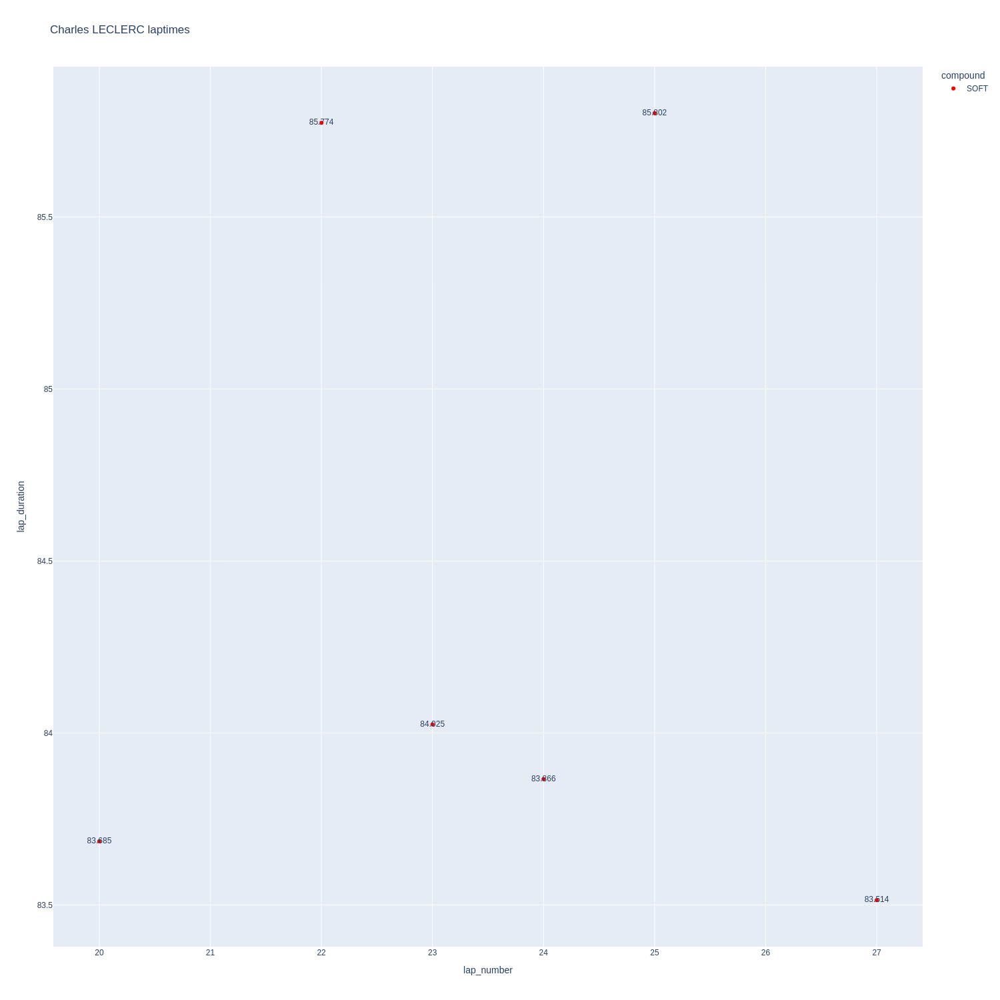

In [33]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

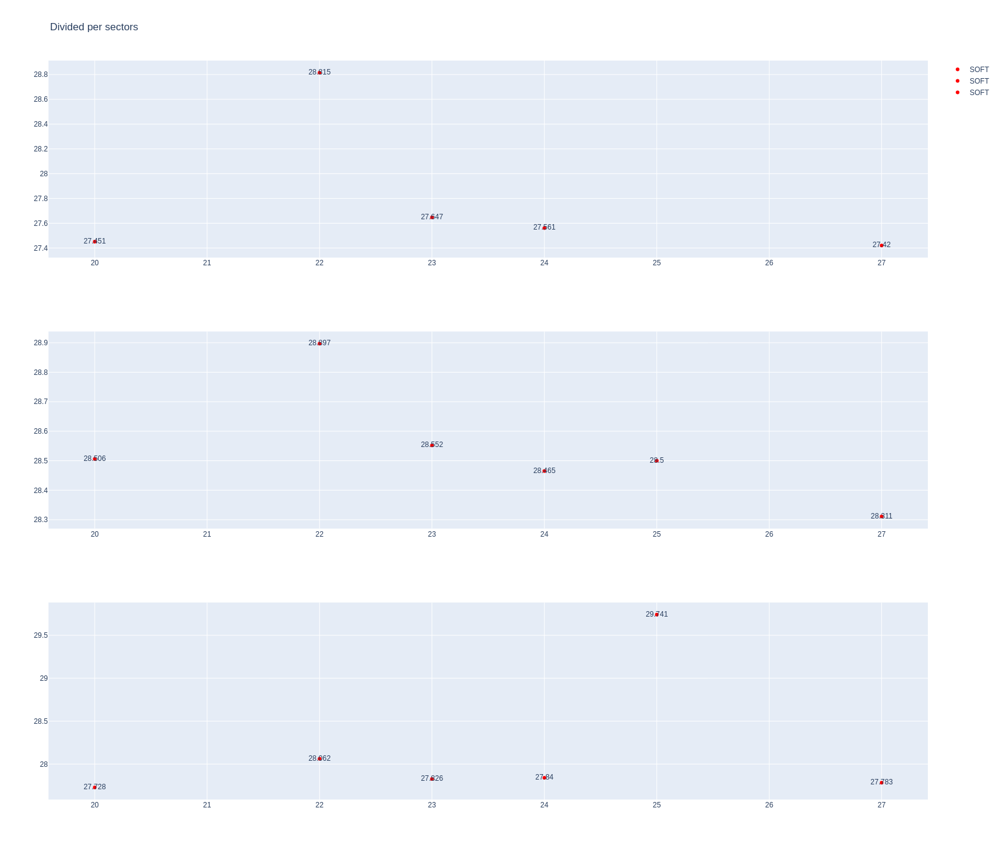

In [34]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [35]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
283,Lewis HAMILTON,SOFT,2025-09-05T15:39:13.380000+00:00,14,26.578,27.094,31.606,85.278
339,Lewis HAMILTON,HARD,2025-09-05T15:48:17.854000+00:00,16,27.585,28.739,27.877,84.201
356,Lewis HAMILTON,HARD,2025-09-05T15:49:42.083000+00:00,17,27.627,29.739,28.161,85.527
375,Lewis HAMILTON,HARD,2025-09-05T15:51:07.588000+00:00,18,27.489,28.749,28.199,84.437
414,Lewis HAMILTON,HARD,2025-09-05T15:53:58.124000+00:00,20,27.523,28.789,27.981,84.293
433,Lewis HAMILTON,HARD,2025-09-05T15:55:22.539000+00:00,21,27.568,28.562,27.801,83.931
452,Lewis HAMILTON,HARD,2025-09-05T15:56:46.285000+00:00,22,27.516,28.620,28.304,84.440
470,Lewis HAMILTON,HARD,2025-09-05T15:58:10.811000+00:00,23,27.335,28.546,27.804,83.685
488,Lewis HAMILTON,HARD,2025-09-05T15:59:34.473000+00:00,24,27.439,28.820,27.926,84.185


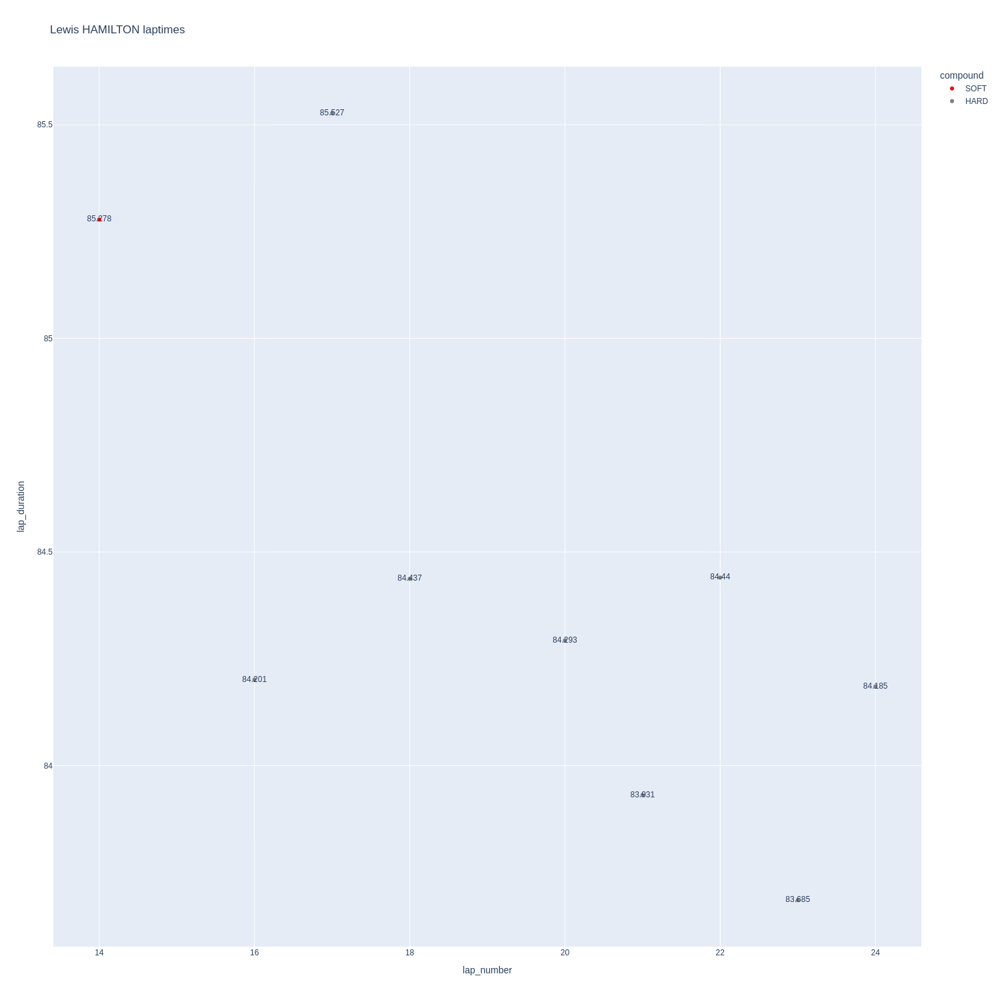

In [36]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

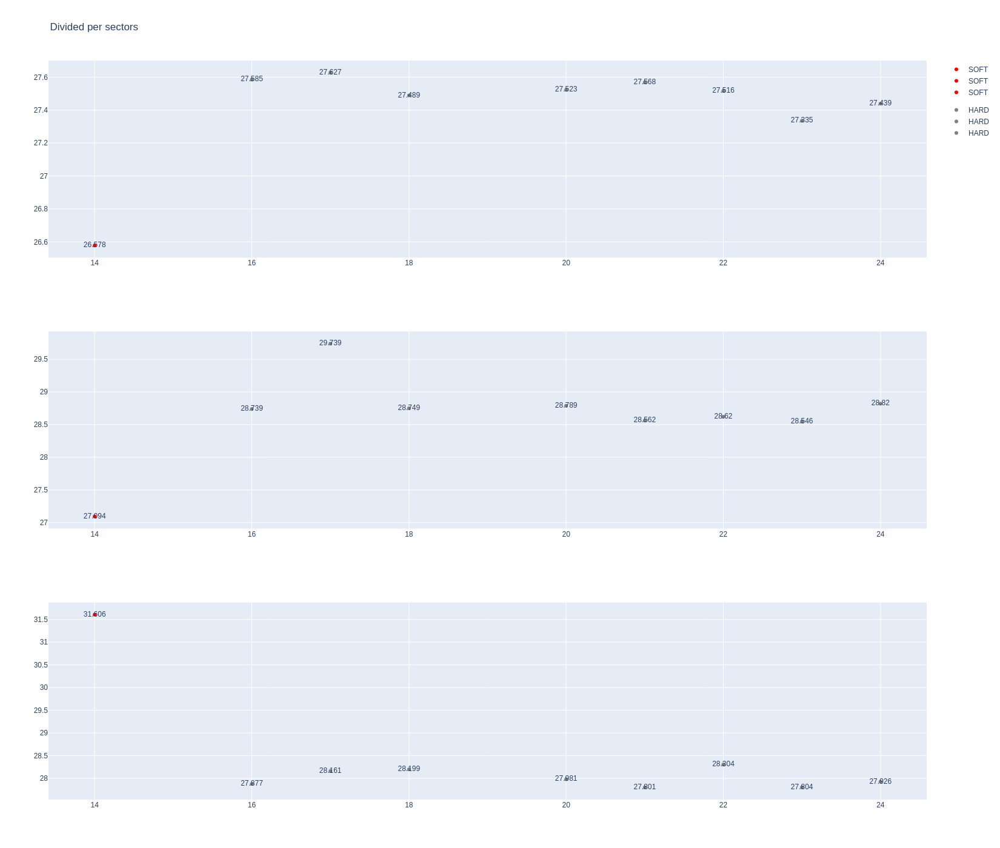

In [37]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [38]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1268,9906,1,12,1,4,HARD,0
18,1268,9906,1,63,1,5,HARD,0
23,1268,9906,2,63,6,7,HARD,5
41,1268,9906,3,63,8,10,HARD,0
65,1268,9906,4,63,11,16,SOFT,0
100,1268,9906,5,63,17,29,HARD,10


In [39]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [41]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [42]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
323,George RUSSELL,HARD,2025-09-05T15:46:54.449000+00:00,18,27.830,28.439,29.235,85.504
340,George RUSSELL,HARD,2025-09-05T15:48:19.940000+00:00,19,27.747,28.484,27.760,83.991
377,George RUSSELL,HARD,2025-09-05T15:51:11.664000+00:00,21,27.510,28.461,28.063,84.034
396,George RUSSELL,HARD,2025-09-05T15:52:35.816000+00:00,22,27.615,28.528,27.855,83.998
415,George RUSSELL,HARD,2025-09-05T15:53:59.743000+00:00,23,27.582,28.397,27.801,83.780
434,George RUSSELL,HARD,2025-09-05T15:55:23.484000+00:00,24,27.382,28.324,27.686,83.392
453,George RUSSELL,HARD,2025-09-05T15:56:46.913000+00:00,25,27.515,28.711,28.646,84.872
472,George RUSSELL,HARD,2025-09-05T15:58:11.741000+00:00,26,27.331,28.527,28.182,84.040


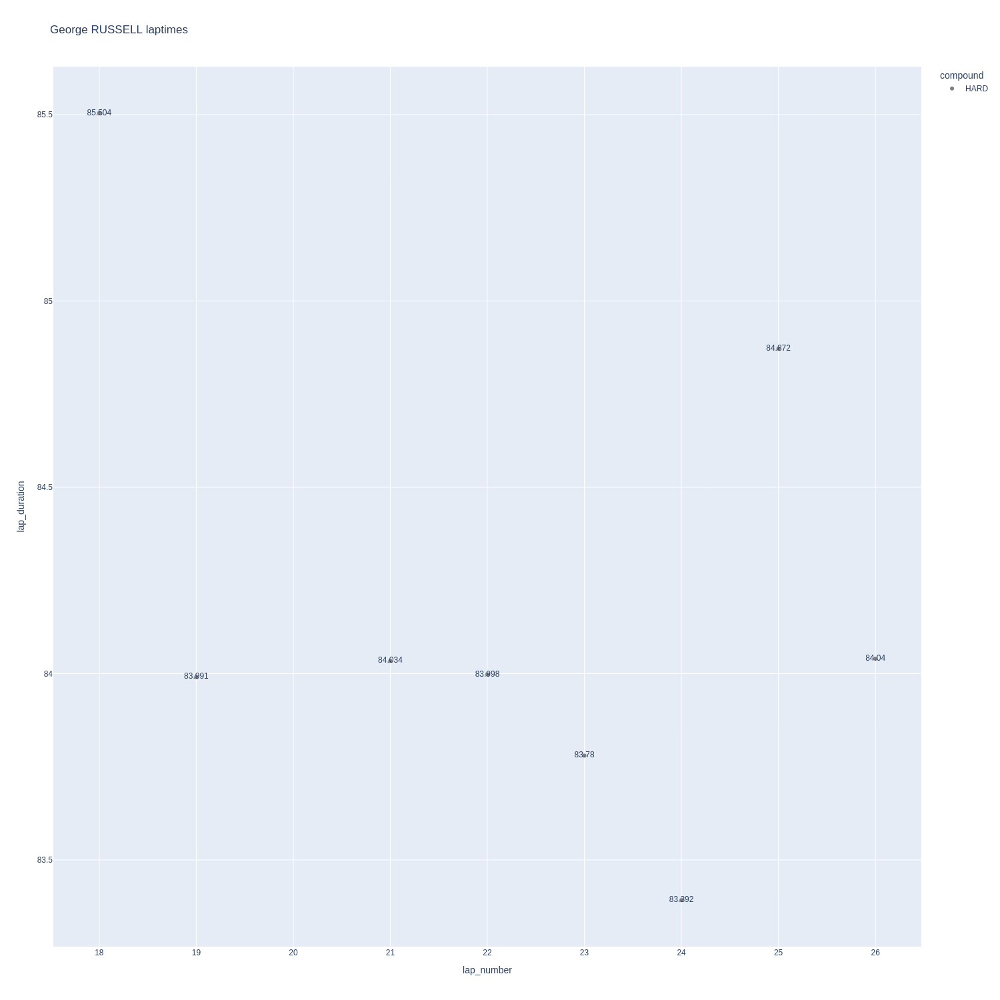

In [43]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

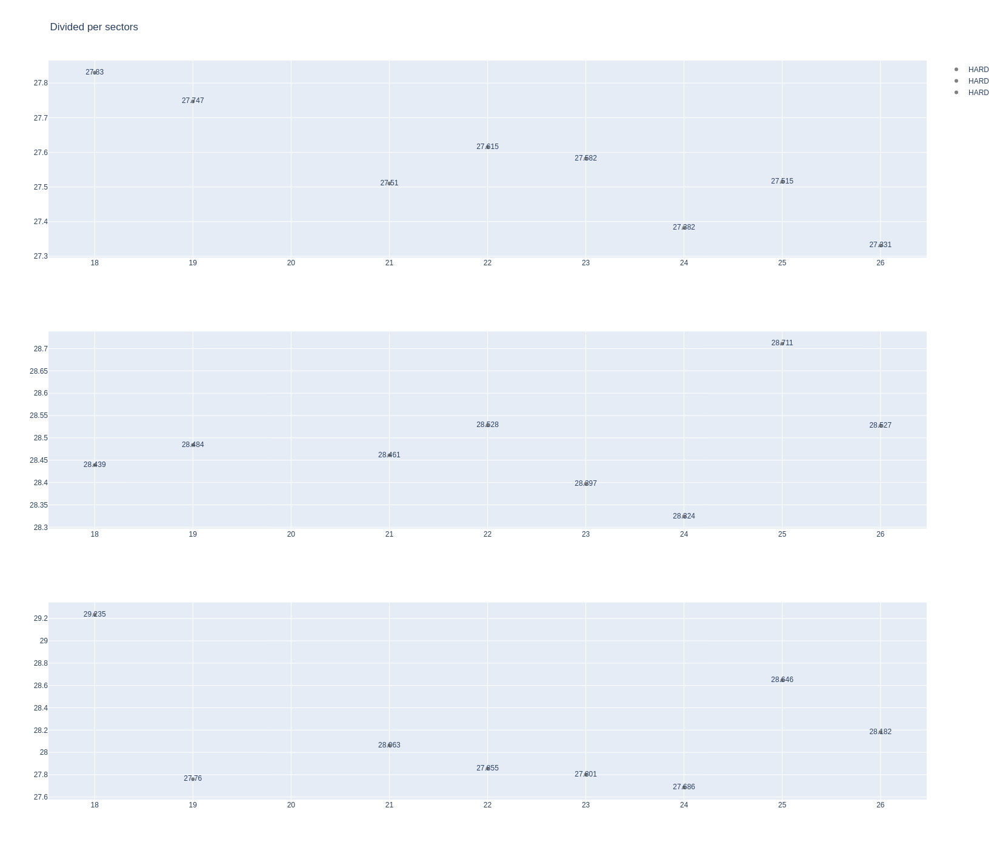

In [44]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [45]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1268,9906,1,81,1,5,MEDIUM,0
24,1268,9906,1,4,1,5,MEDIUM,0
29,1268,9906,2,4,6,7,MEDIUM,5
42,1268,9906,2,81,6,11,MEDIUM,5
45,1268,9906,3,4,8,11,SOFT,0
54,1268,9906,3,81,12,14,SOFT,0
59,1268,9906,4,4,12,14,SOFT,4
69,1268,9906,4,81,15,17,SOFT,3
87,1268,9906,5,81,18,29,MEDIUM,11
89,1268,9906,5,4,15,28,MEDIUM,7


In [46]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
308,Lando NORRIS,MEDIUM,2025-09-05T15:45:06.429000+00:00,16,27.678,28.614,27.982,84.274
320,Lando NORRIS,MEDIUM,2025-09-05T15:46:30.714000+00:00,17,27.595,28.404,27.856,83.855
336,Lando NORRIS,MEDIUM,2025-09-05T15:47:54.528000+00:00,18,27.760,28.610,27.755,84.125
352,Lando NORRIS,MEDIUM,2025-09-05T15:49:18.804000+00:00,19,27.438,28.380,27.778,83.596
371,Lando NORRIS,MEDIUM,2025-09-05T15:50:42.328000+00:00,20,27.309,28.207,27.745,83.261
390,Lando NORRIS,MEDIUM,2025-09-05T15:52:05.623000+00:00,21,27.400,28.415,27.650,83.465
409,Lando NORRIS,MEDIUM,2025-09-05T15:53:29.030000+00:00,22,27.512,28.410,27.794,83.716
428,Lando NORRIS,MEDIUM,2025-09-05T15:54:52.774000+00:00,23,27.516,28.327,27.773,83.616
447,Lando NORRIS,MEDIUM,2025-09-05T15:56:16.384000+00:00,24,27.466,28.335,27.751,83.552
466,Lando NORRIS,MEDIUM,2025-09-05T15:57:40.029000+00:00,25,27.435,28.482,27.826,83.743


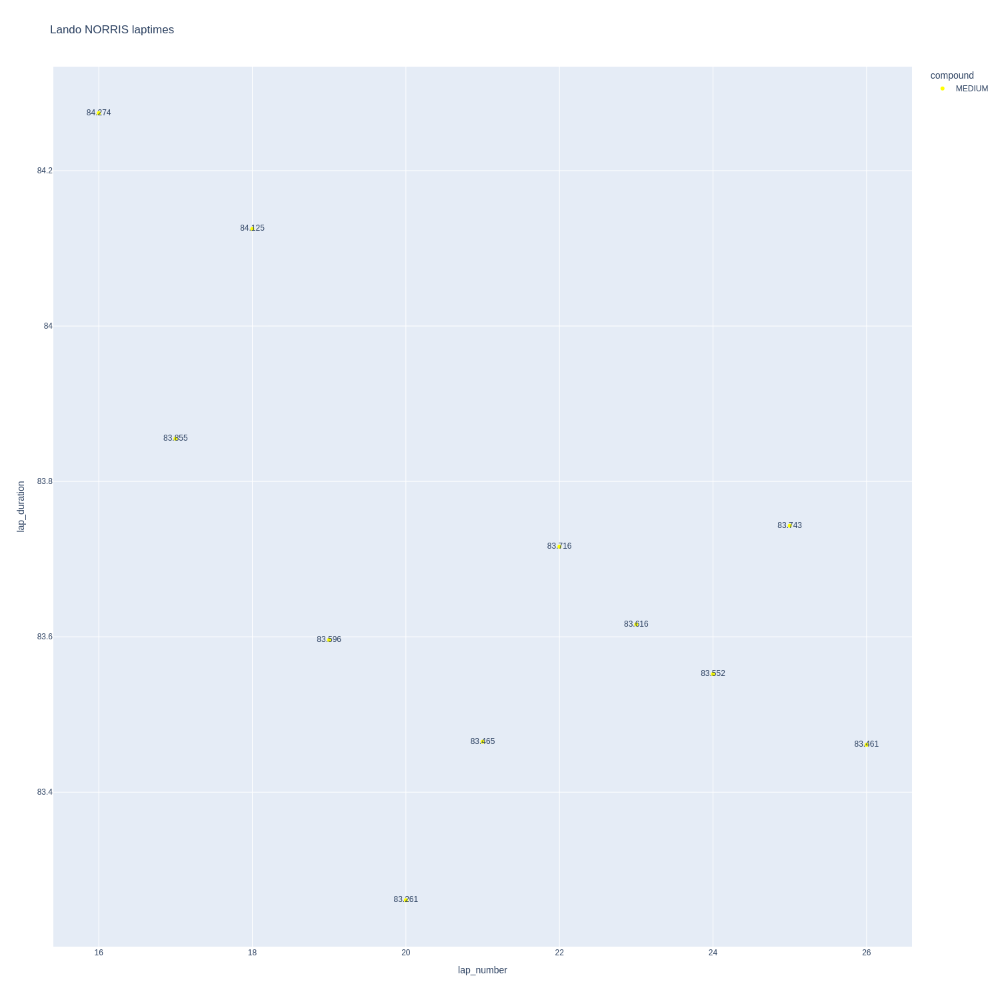

In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

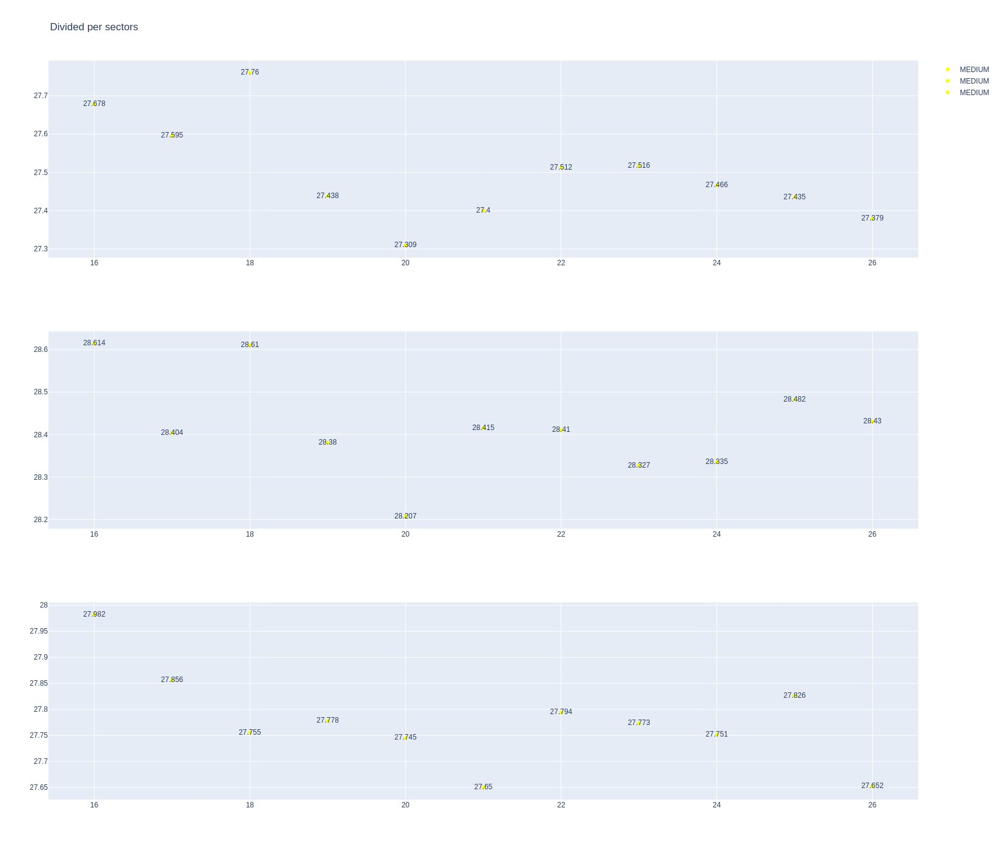

In [48]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [49]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
333,Oscar PIASTRI,MEDIUM,2025-09-05T15:47:33.482000+00:00,19,27.837,28.576,27.893,84.306
349,Oscar PIASTRI,MEDIUM,2025-09-05T15:48:57.722000+00:00,20,27.701,28.492,27.928,84.121
368,Oscar PIASTRI,MEDIUM,2025-09-05T15:50:21.884000+00:00,21,27.680,28.755,27.901,84.336
386,Oscar PIASTRI,MEDIUM,2025-09-05T15:51:46.299000+00:00,22,27.697,28.414,27.834,83.945
405,Oscar PIASTRI,MEDIUM,2025-09-05T15:53:10.186000+00:00,23,27.528,28.616,28.110,84.254
424,Oscar PIASTRI,MEDIUM,2025-09-05T15:54:34.381000+00:00,24,27.612,28.454,27.890,83.956
442,Oscar PIASTRI,MEDIUM,2025-09-05T15:55:58.433000+00:00,25,27.520,28.396,27.823,83.739
461,Oscar PIASTRI,MEDIUM,2025-09-05T15:57:22.103000+00:00,26,27.386,28.304,27.793,83.483
477,Oscar PIASTRI,MEDIUM,2025-09-05T15:58:45.640000+00:00,27,27.462,28.564,27.848,83.874


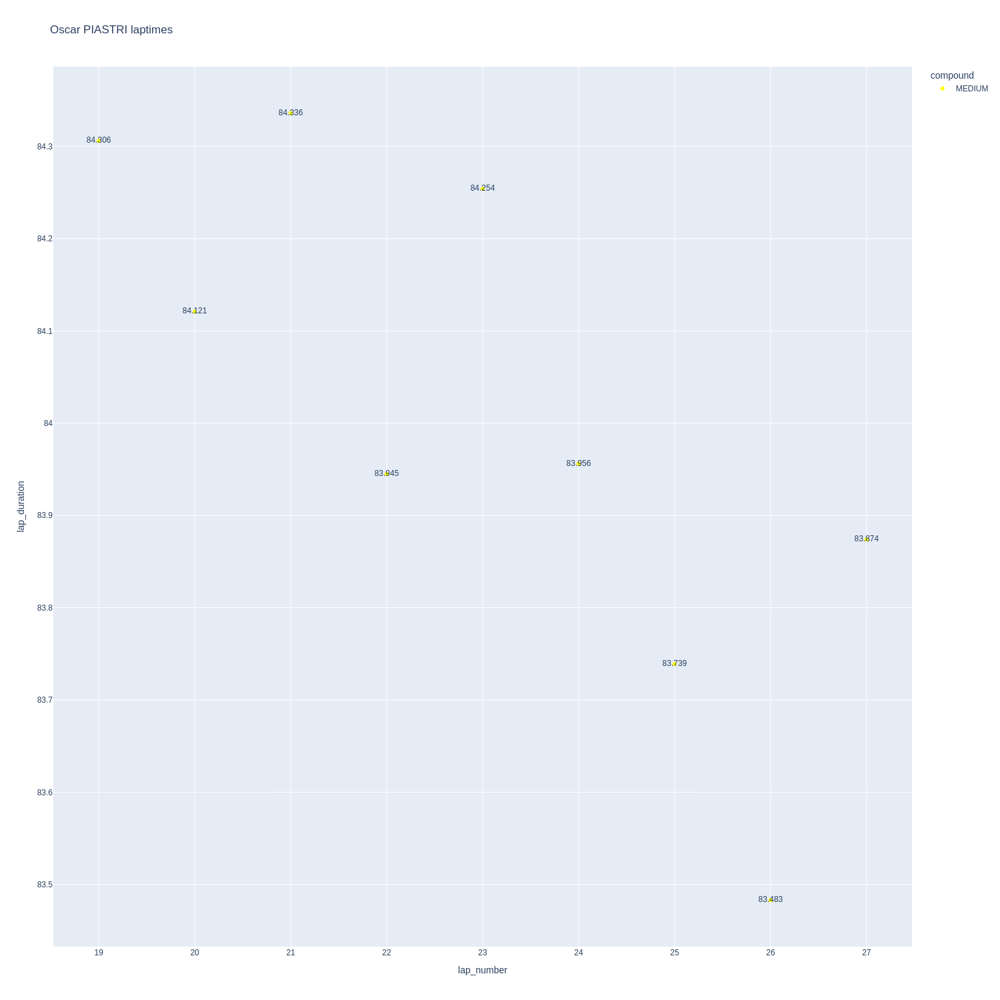

In [50]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

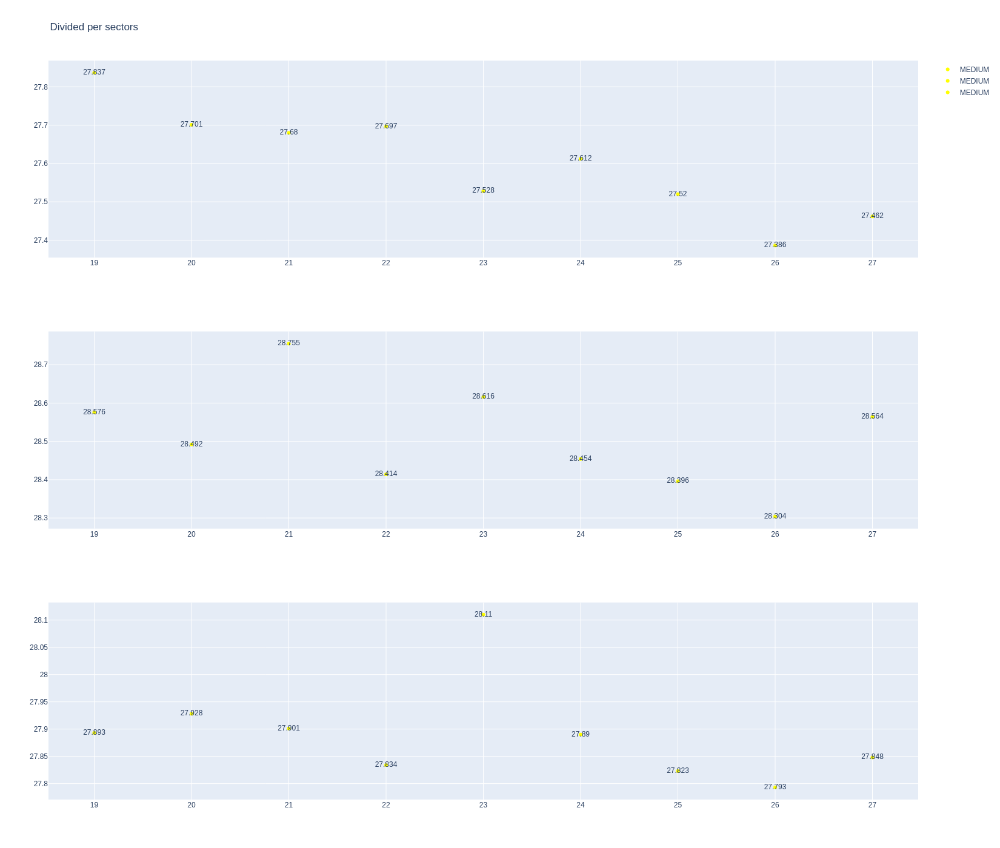

In [51]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [52]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1268,9906,1,14,1,5,MEDIUM,0
16,1268,9906,1,18,1,5,MEDIUM,0
46,1268,9906,2,18,6,12,MEDIUM,5
47,1268,9906,2,14,6,10,MEDIUM,5
75,1268,9906,3,14,11,17,SOFT,0
76,1268,9906,3,18,13,19,SOFT,0
84,1268,9906,4,14,18,26,MEDIUM,10
88,1268,9906,4,18,20,28,MEDIUM,12


In [53]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
120,Fernando ALONSO,MEDIUM,2025-09-05T15:17:41.224000+00:00,7,27.159,27.054,30.653,84.866
385,Fernando ALONSO,MEDIUM,2025-09-05T15:51:44.331000+00:00,19,27.958,28.745,28.310,85.013
404,Fernando ALONSO,MEDIUM,2025-09-05T15:53:09.354000+00:00,20,27.735,28.840,28.209,84.784
423,Fernando ALONSO,MEDIUM,2025-09-05T15:54:34.101000+00:00,21,28.260,28.934,28.171,85.365
443,Fernando ALONSO,MEDIUM,2025-09-05T15:55:59.470000+00:00,22,27.505,28.462,28.030,83.997
462,Fernando ALONSO,MEDIUM,2025-09-05T15:57:23.418000+00:00,23,27.488,28.629,28.341,84.458


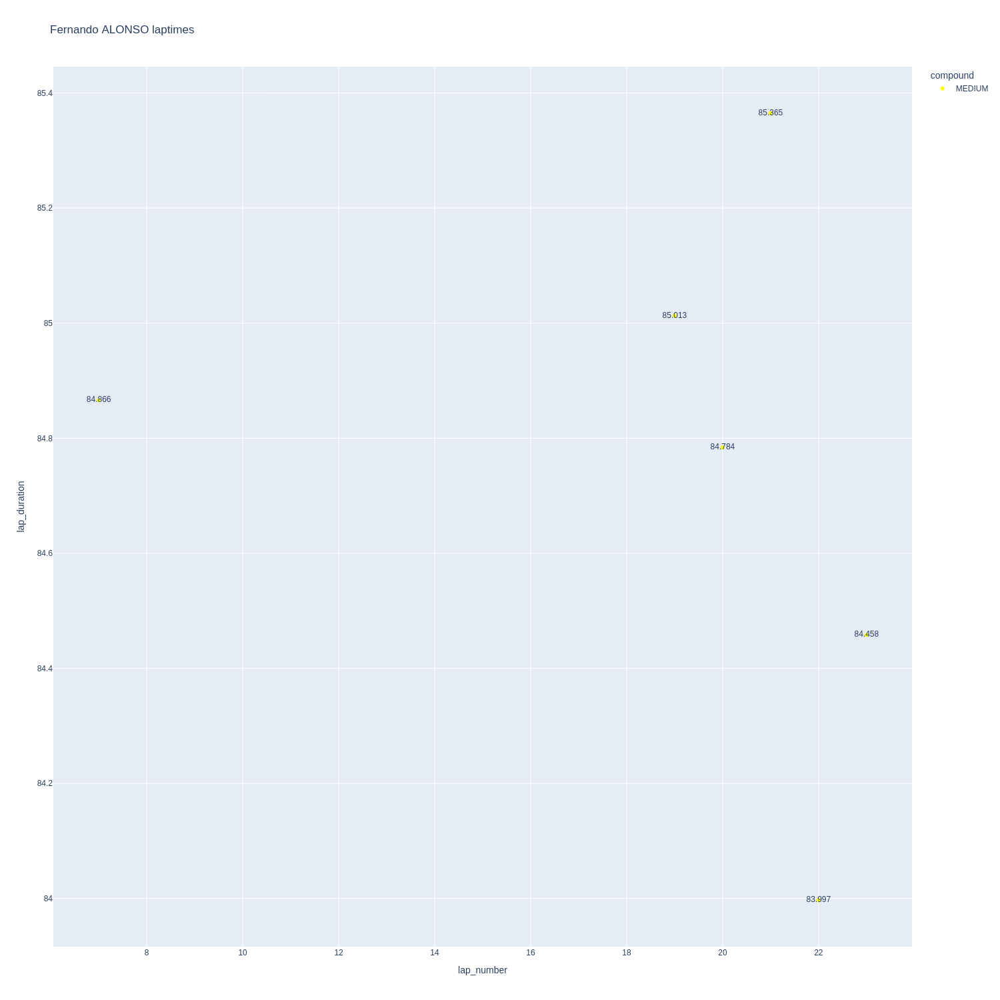

In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

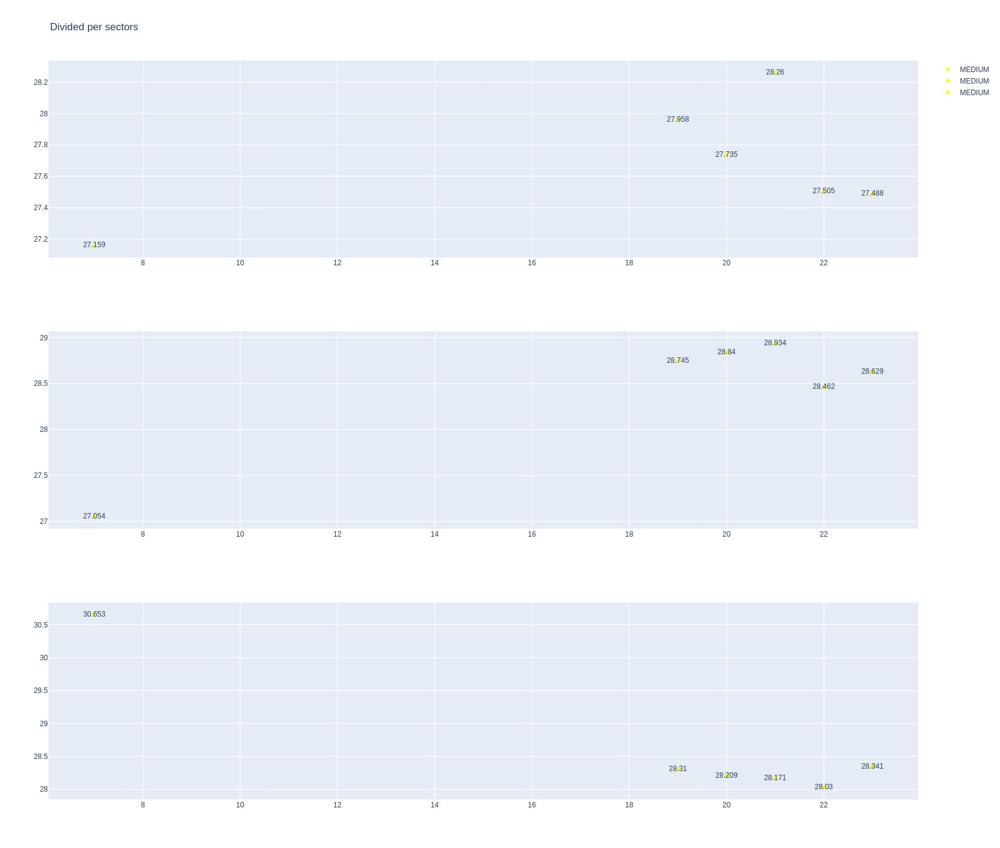

In [55]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [56]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
387,Lance STROLL,MEDIUM,2025-09-05T15:51:54.312000+00:00,21,27.782,28.728,28.306,84.816
406,Lance STROLL,MEDIUM,2025-09-05T15:53:19.026000+00:00,22,27.729,28.875,28.139,84.743
425,Lance STROLL,MEDIUM,2025-09-05T15:54:43.684000+00:00,23,27.699,28.675,28.110,84.484
444,Lance STROLL,MEDIUM,2025-09-05T15:56:08.230000+00:00,24,27.607,28.499,28.062,84.168
463,Lance STROLL,MEDIUM,2025-09-05T15:57:32.429000+00:00,25,27.644,28.748,29.144,85.536
481,Lance STROLL,MEDIUM,2025-09-05T15:58:57.948000+00:00,26,27.709,28.589,28.565,84.863


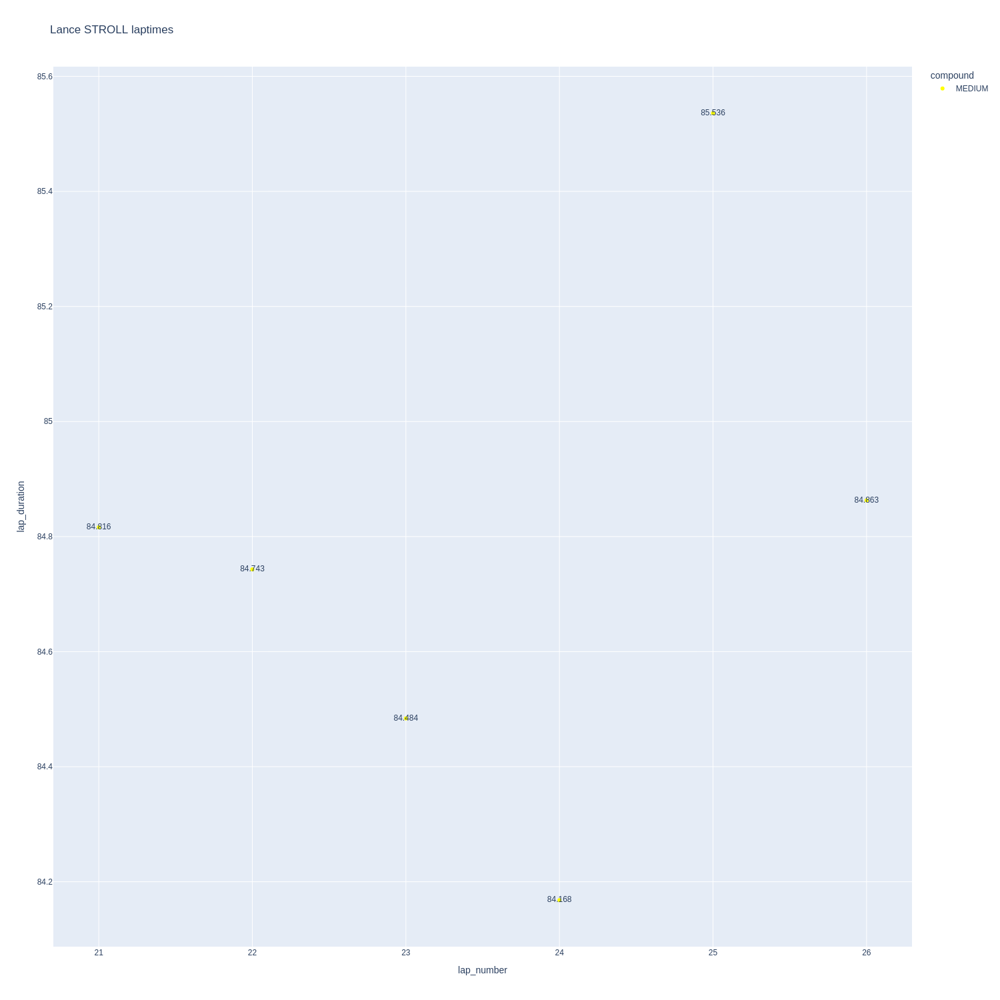

In [57]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

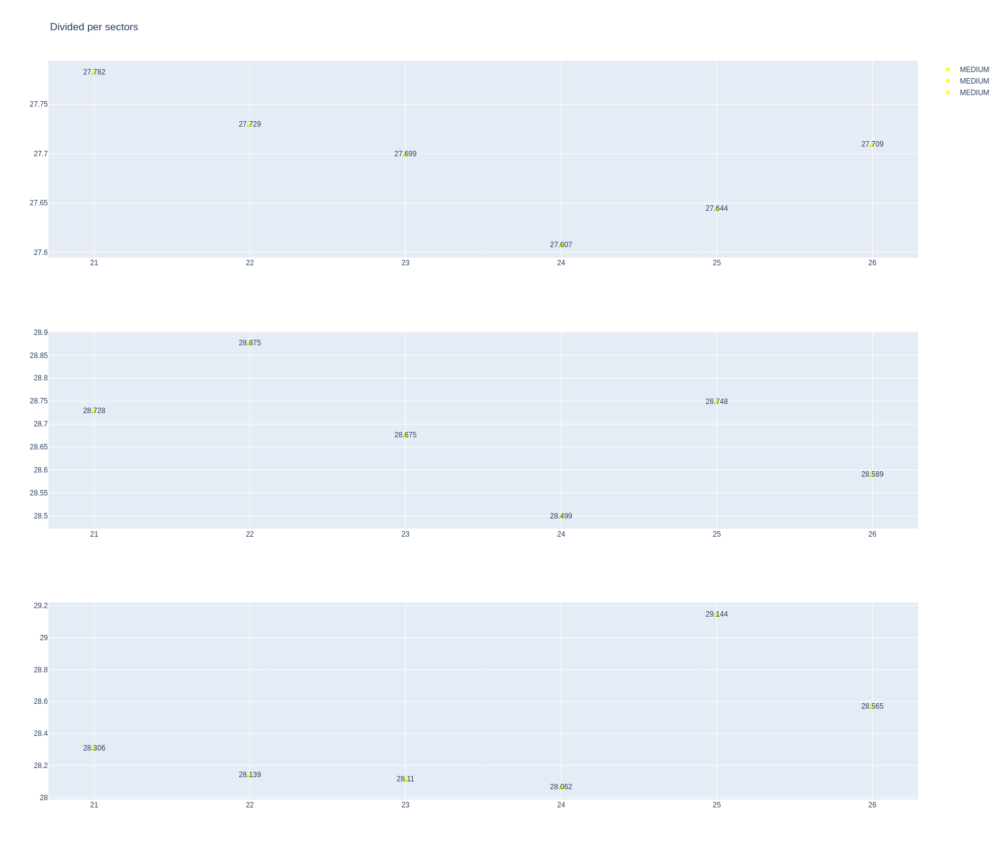

In [58]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [59]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1268,9906,1,30,1,3,MEDIUM,0
6,1268,9906,2,30,4,4,MEDIUM,3
7,1268,9906,1,6,1,3,MEDIUM,0
27,1268,9906,2,6,4,4,MEDIUM,3
38,1268,9906,3,30,5,7,MEDIUM,4
44,1268,9906,3,6,5,7,MEDIUM,4
53,1268,9906,4,30,8,10,SOFT,0
56,1268,9906,4,6,8,10,SOFT,0
68,1268,9906,5,30,11,13,SOFT,3
72,1268,9906,5,6,11,13,SOFT,0


In [60]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
331,Liam LAWSON,MEDIUM,2025-09-05T15:47:27.744000+00:00,15,28.002,28.829,28.209,85.040
348,Liam LAWSON,MEDIUM,2025-09-05T15:48:52.860000+00:00,16,28.040,28.815,28.181,85.036
367,Liam LAWSON,MEDIUM,2025-09-05T15:50:17.912000+00:00,17,27.885,28.777,28.070,84.732
384,Liam LAWSON,MEDIUM,2025-09-05T15:51:42.554000+00:00,18,27.884,28.711,28.040,84.635
403,Liam LAWSON,MEDIUM,2025-09-05T15:53:07.215000+00:00,19,27.878,28.733,28.106,84.717
422,Liam LAWSON,MEDIUM,2025-09-05T15:54:31.993000+00:00,20,27.849,28.637,27.901,84.387
441,Liam LAWSON,MEDIUM,2025-09-05T15:55:56.263000+00:00,21,27.687,28.513,27.833,84.033
460,Liam LAWSON,MEDIUM,2025-09-05T15:57:20.410000+00:00,22,27.600,28.393,27.802,83.795
476,Liam LAWSON,MEDIUM,2025-09-05T15:58:44.196000+00:00,23,27.622,28.627,28.071,84.320


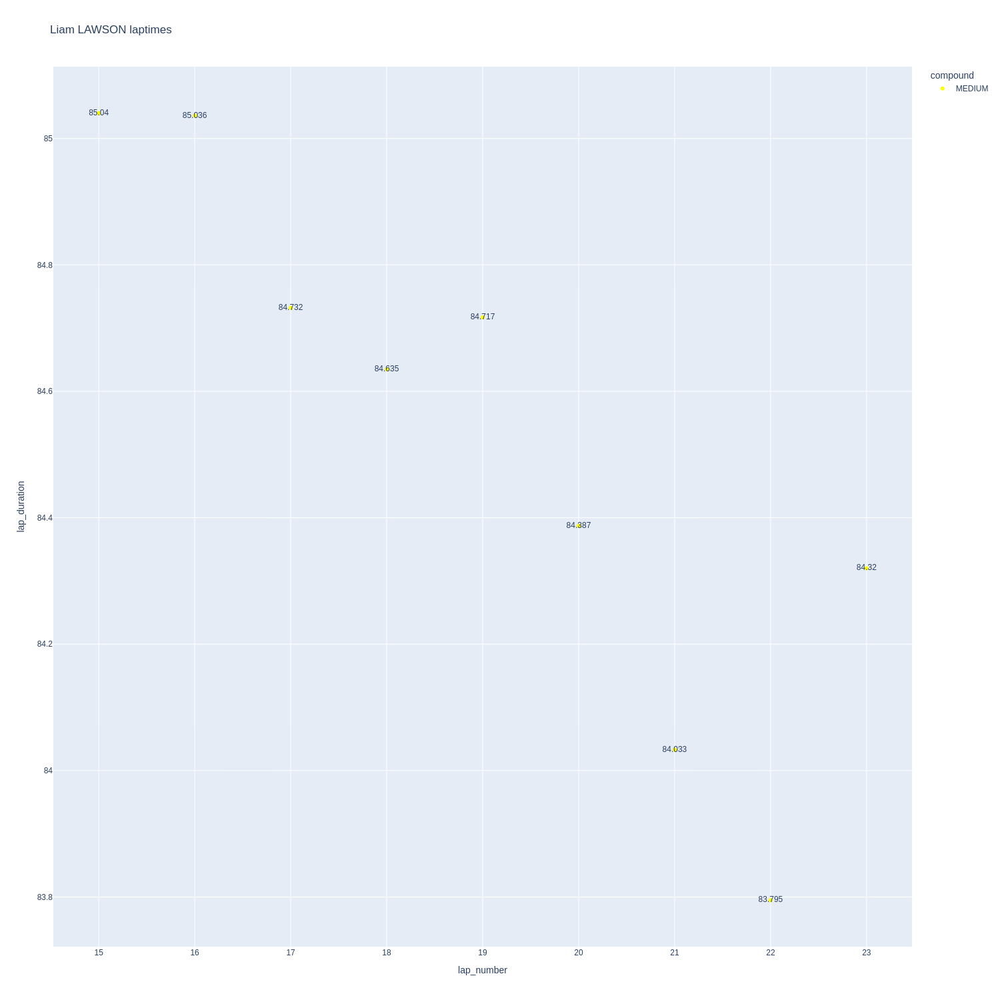

In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

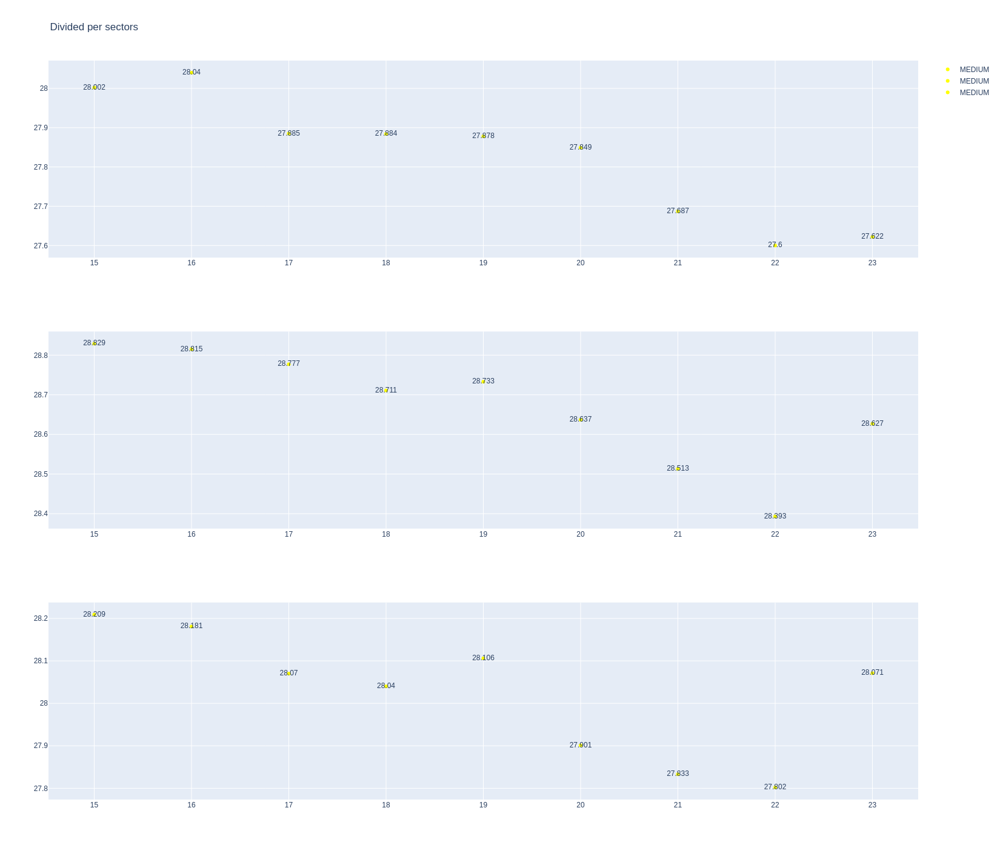

In [62]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [63]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
35,Isack HADJAR,MEDIUM,2025-09-05T15:03:34.120000+00:00,2,27.764,27.740,28.027,83.531
350,Isack HADJAR,MEDIUM,2025-09-05T15:49:09.556000+00:00,15,28.068,28.628,28.078,84.774
369,Isack HADJAR,MEDIUM,2025-09-05T15:50:34.483000+00:00,16,27.896,28.685,28.191,84.772
388,Isack HADJAR,MEDIUM,2025-09-05T15:51:59.206000+00:00,17,27.588,28.463,27.978,84.029
407,Isack HADJAR,MEDIUM,2025-09-05T15:53:23.183000+00:00,18,27.501,28.440,27.915,83.856
426,Isack HADJAR,MEDIUM,2025-09-05T15:54:46.941000+00:00,19,27.636,28.608,28.011,84.255
445,Isack HADJAR,MEDIUM,2025-09-05T15:56:11.247000+00:00,20,28.873,28.730,28.055,85.658
464,Isack HADJAR,MEDIUM,2025-09-05T15:57:36.934000+00:00,21,27.666,28.650,28.020,84.336
483,Isack HADJAR,MEDIUM,2025-09-05T15:59:01.329000+00:00,22,27.595,28.699,27.858,84.152


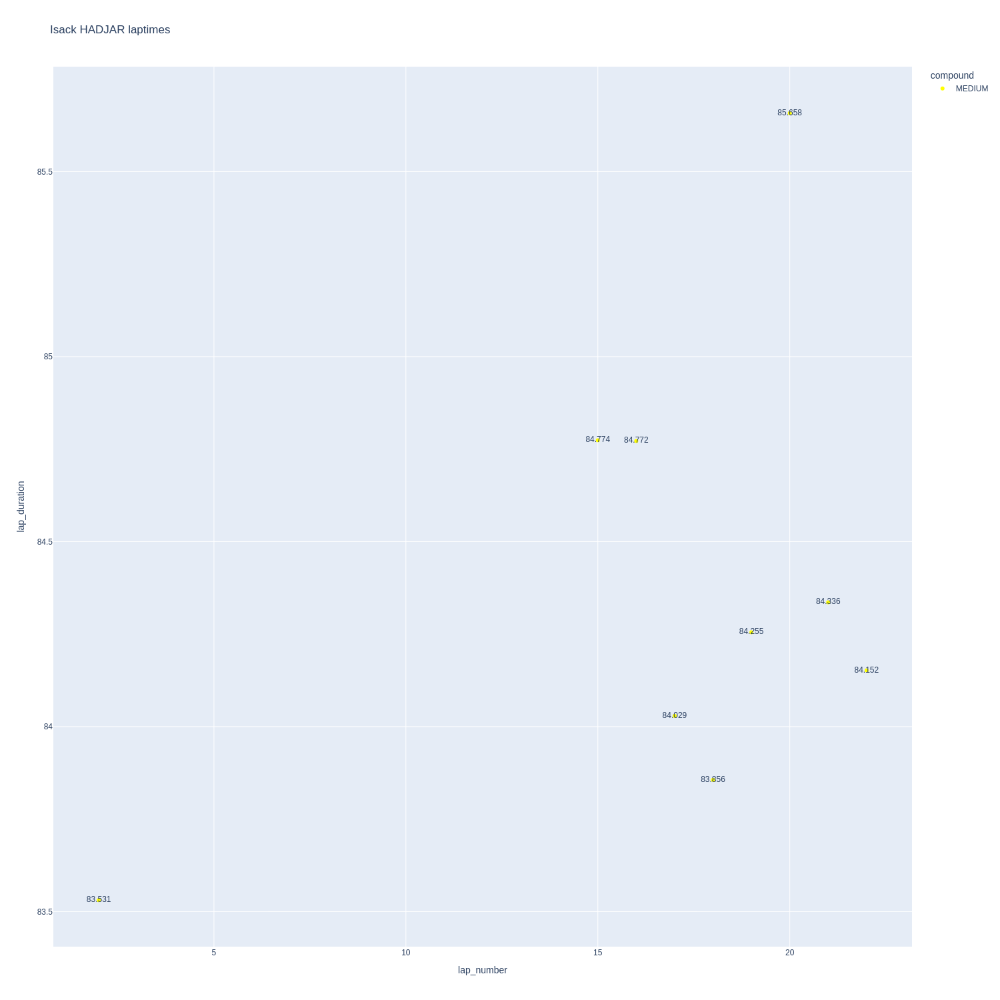

In [64]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

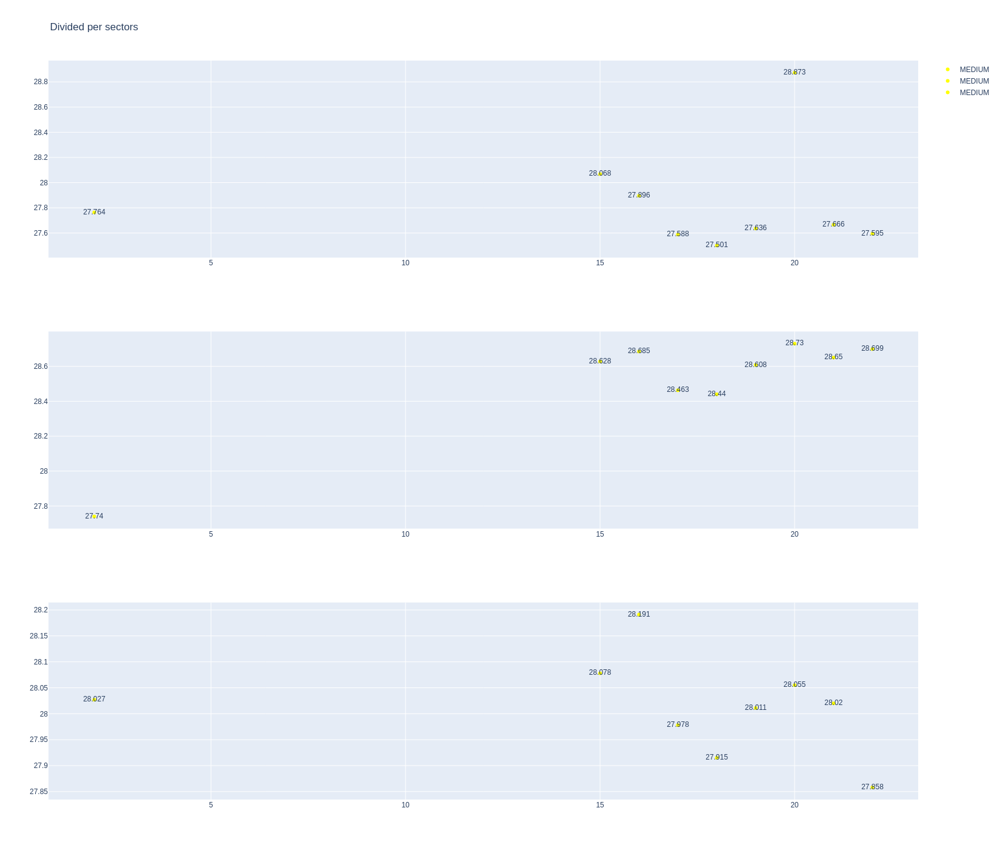

In [65]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [66]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1268,9906,1,31,1,6,HARD,0
10,1268,9906,1,87,1,6,HARD,0
35,1268,9906,2,87,7,9,HARD,6
36,1268,9906,2,31,7,10,HARD,6
50,1268,9906,3,31,11,13,SOFT,0
60,1268,9906,3,87,10,15,SOFT,0
62,1268,9906,4,31,14,16,SOFT,3
79,1268,9906,5,31,17,26,HARD,10
92,1268,9906,6,31,27,29,SOFT,0
98,1268,9906,4,87,16,29,HARD,0


In [67]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
316,Esteban OCON,HARD,2025-09-05T15:45:43.311000+00:00,18,27.773,28.308,28.003,84.084
328,Esteban OCON,HARD,2025-09-05T15:47:07.451000+00:00,19,27.917,28.491,28.021,84.429
344,Esteban OCON,HARD,2025-09-05T15:48:31.912000+00:00,20,27.839,28.422,28.041,84.302
361,Esteban OCON,HARD,2025-09-05T15:49:56.173000+00:00,21,27.719,28.493,27.996,84.208
380,Esteban OCON,HARD,2025-09-05T15:51:20.474000+00:00,22,27.889,28.782,28.168,84.839
399,Esteban OCON,HARD,2025-09-05T15:52:45.282000+00:00,23,27.858,28.626,27.966,84.450
418,Esteban OCON,HARD,2025-09-05T15:54:09.600000+00:00,24,27.625,28.547,27.903,84.075
437,Esteban OCON,HARD,2025-09-05T15:55:33.729000+00:00,25,27.739,28.530,27.944,84.213


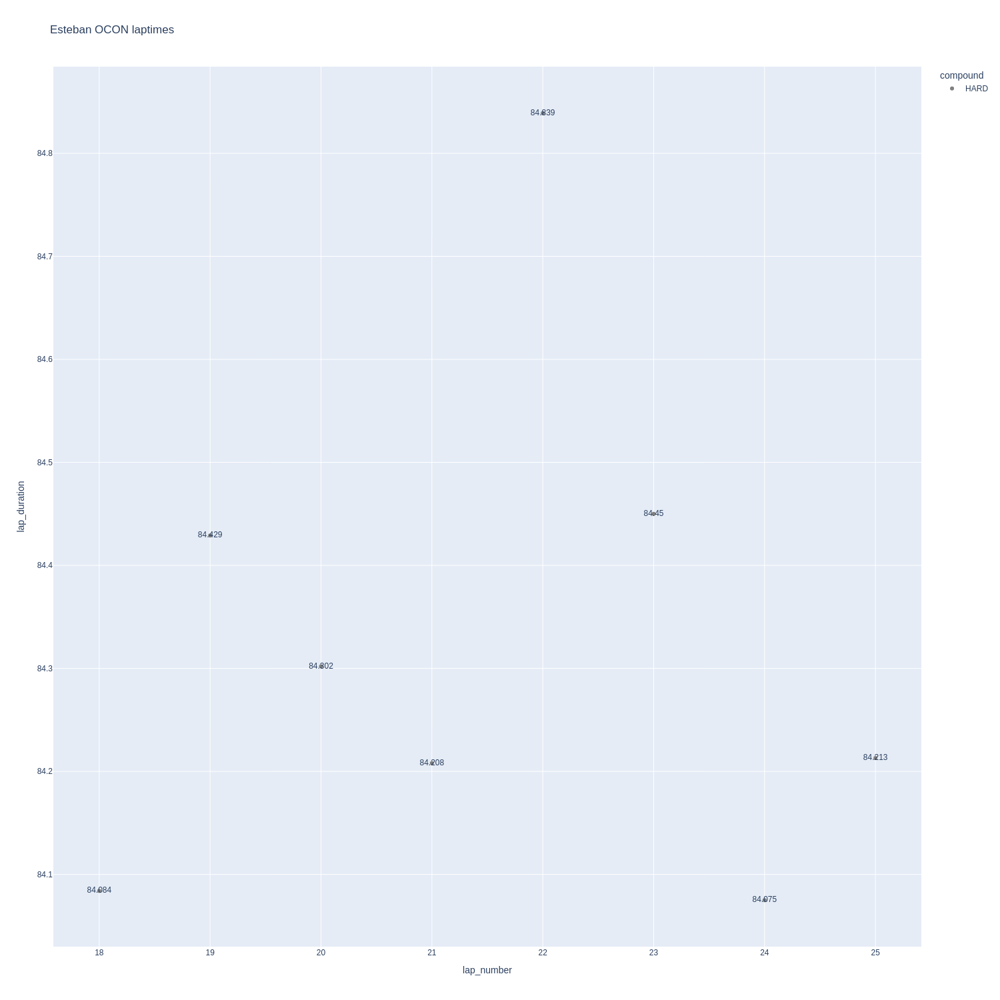

In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

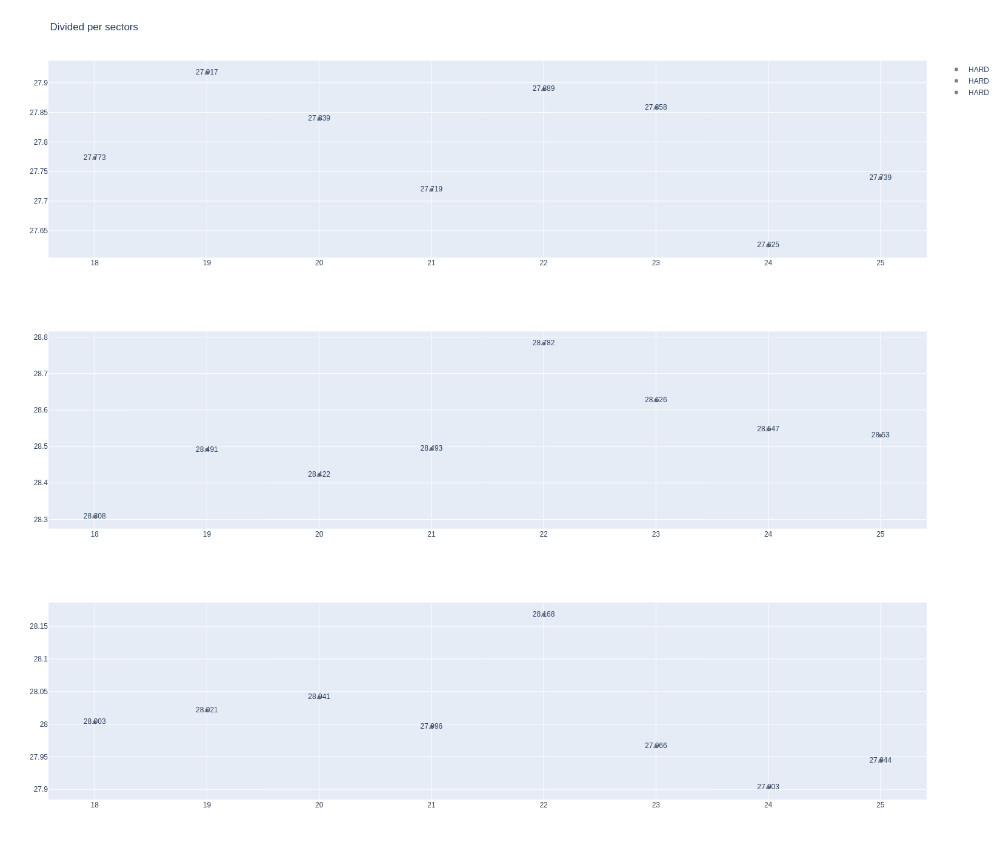

In [69]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [70]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
311,Oliver BEARMAN,HARD,2025-09-05T15:45:22.431000+00:00,17,27.931,28.588,28.233,84.752
322,Oliver BEARMAN,HARD,2025-09-05T15:46:47.145000+00:00,18,27.985,28.676,28.168,84.829
338,Oliver BEARMAN,HARD,2025-09-05T15:48:12.022000+00:00,19,27.877,28.671,28.389,84.937
355,Oliver BEARMAN,HARD,2025-09-05T15:49:36.920000+00:00,20,27.662,28.767,28.115,84.544
393,Oliver BEARMAN,HARD,2025-09-05T15:52:28.245000+00:00,22,27.606,28.595,28.049,84.250
412,Oliver BEARMAN,HARD,2025-09-05T15:53:52.412000+00:00,23,27.524,28.770,28.076,84.370
431,Oliver BEARMAN,HARD,2025-09-05T15:55:16.840000+00:00,24,27.542,28.821,28.237,84.600
471,Oliver BEARMAN,HARD,2025-09-05T15:58:11.521000+00:00,26,27.892,28.975,28.526,85.393
490,Oliver BEARMAN,HARD,2025-09-05T15:59:36.846000+00:00,27,27.665,29.312,28.083,85.060


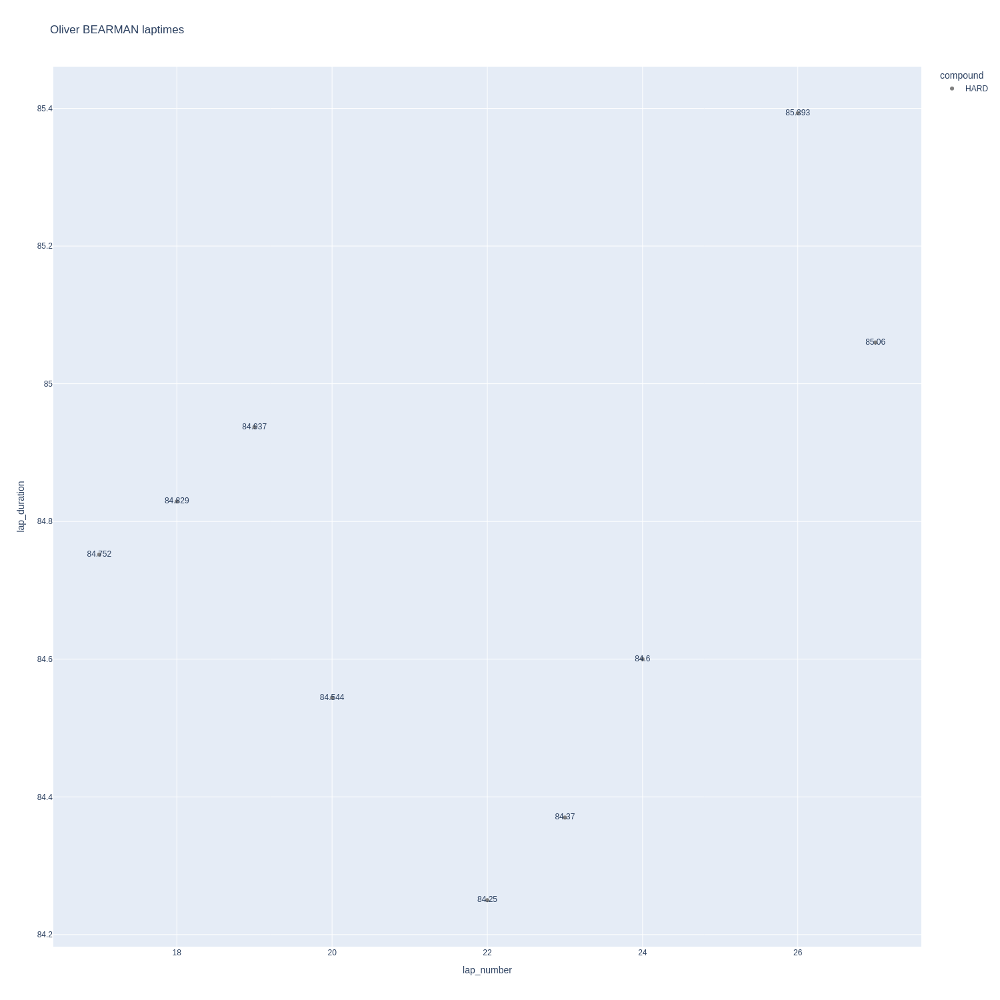

In [71]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

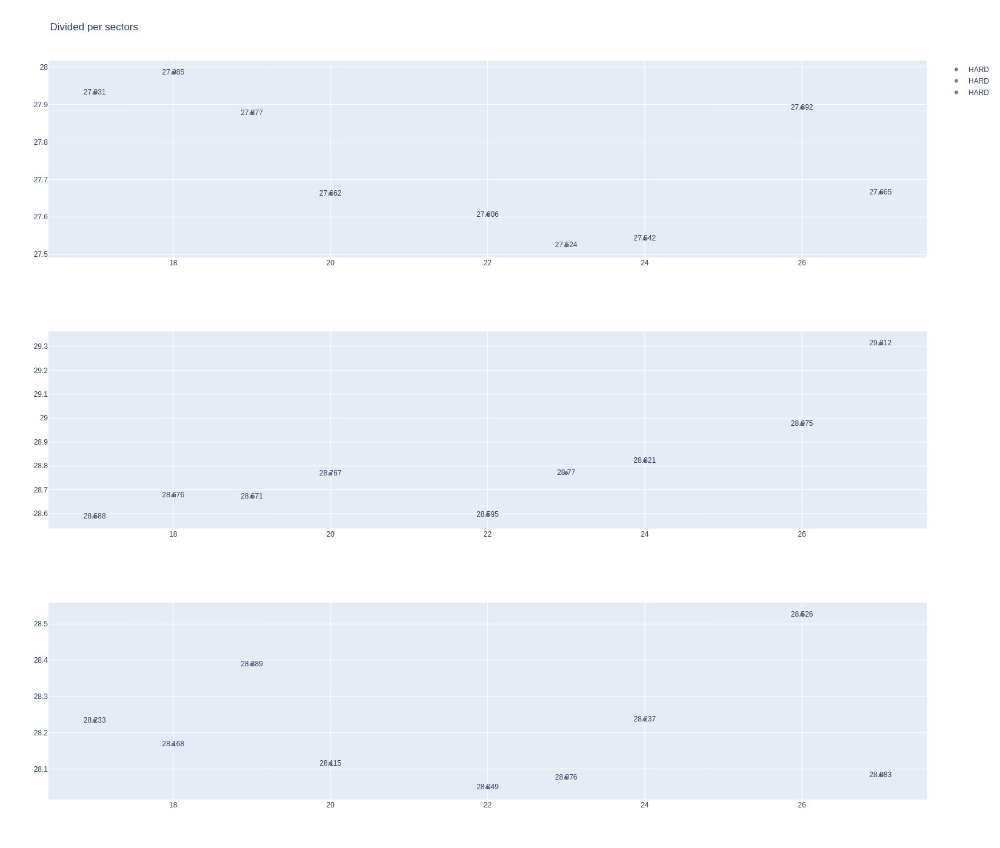

In [72]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [73]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
21,1268,9906,1,43,1,5,MEDIUM,0
22,1268,9906,1,10,1,5,MEDIUM,0
28,1268,9906,2,43,6,8,MEDIUM,5
30,1268,9906,2,10,6,8,MEDIUM,5
39,1268,9906,3,43,9,11,SOFT,0
57,1268,9906,4,43,12,14,SOFT,3
58,1268,9906,3,10,9,14,SOFT,0
83,1268,9906,5,43,15,30,MEDIUM,8
99,1268,9906,4,10,15,30,MEDIUM,8


In [74]:
data =libraryDataF1.getinfolongruns(jointables2,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Franco COLAPINTO,MEDIUM,2025-09-05T15:02:14.079000+00:00,2,27.649,28.066,28.607,84.322
63,Franco COLAPINTO,MEDIUM,2025-09-05T15:05:56.834000+00:00,4,27.347,27.844,28.218,83.409
295,Franco COLAPINTO,MEDIUM,2025-09-05T15:41:41.574000+00:00,16,28.002,29.067,28.380,85.449
299,Franco COLAPINTO,MEDIUM,2025-09-05T15:43:07.012000+00:00,17,27.992,28.851,28.286,85.129
305,Franco COLAPINTO,MEDIUM,2025-09-05T15:44:32.082000+00:00,18,27.974,28.633,28.163,84.770
317,Franco COLAPINTO,MEDIUM,2025-09-05T15:45:56.938000+00:00,19,27.901,28.620,28.101,84.622
330,Franco COLAPINTO,MEDIUM,2025-09-05T15:47:21.547000+00:00,20,27.884,28.698,28.149,84.731
347,Franco COLAPINTO,MEDIUM,2025-09-05T15:48:46.149000+00:00,21,27.982,28.848,28.469,85.299
364,Franco COLAPINTO,MEDIUM,2025-09-05T15:50:11.546000+00:00,22,27.655,28.898,28.345,84.898
383,Franco COLAPINTO,MEDIUM,2025-09-05T15:51:36.402000+00:00,23,27.764,28.840,28.236,84.840


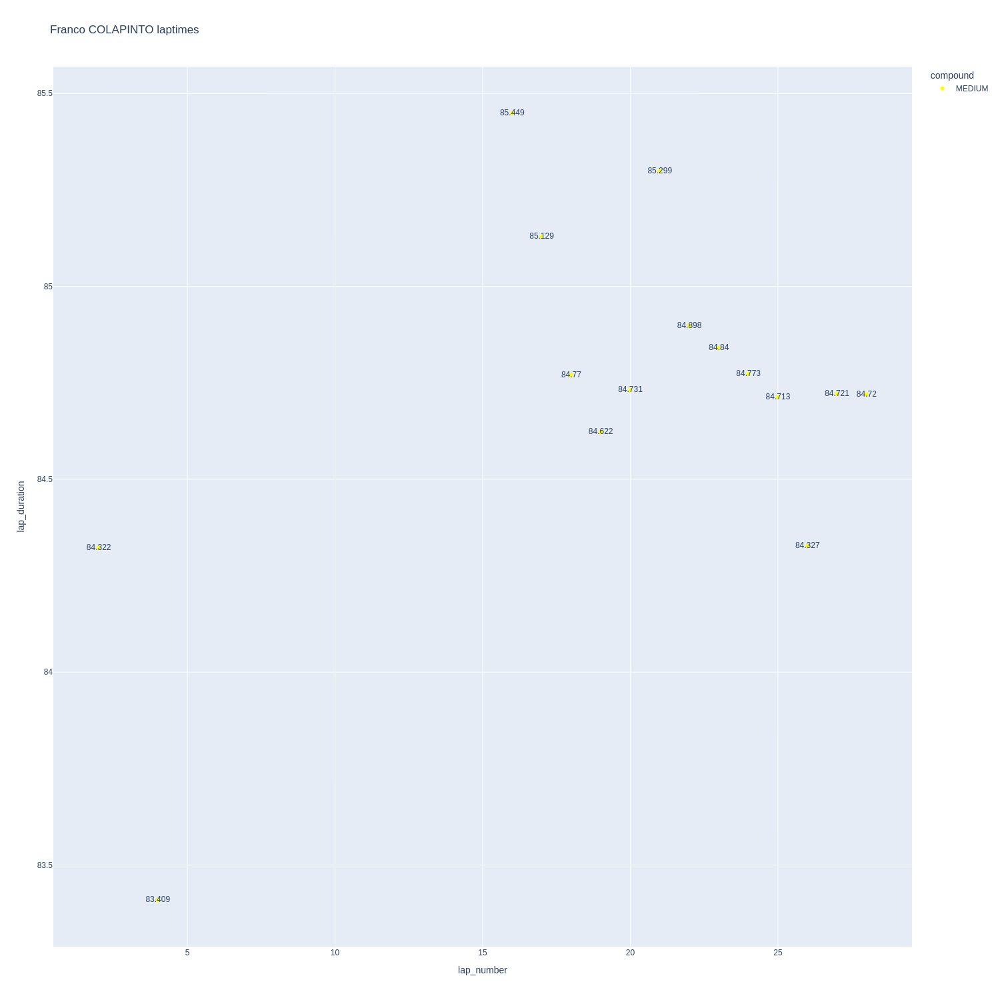

In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

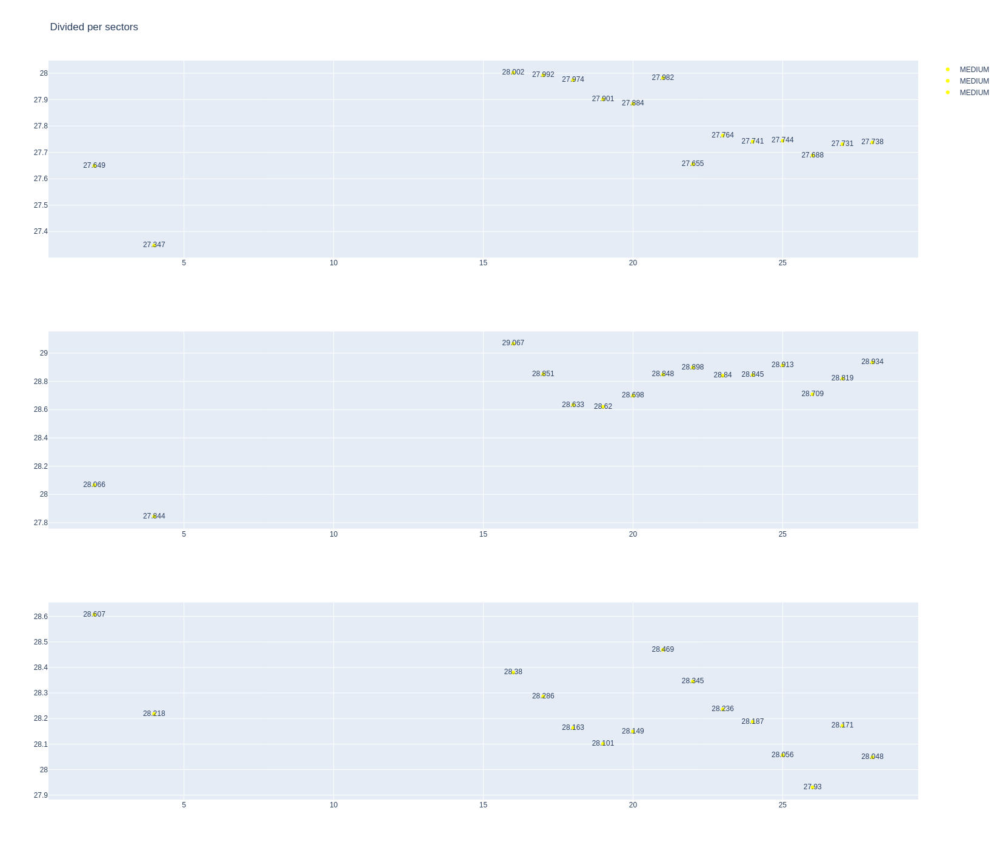

In [76]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [77]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
297,Pierre GASLY,MEDIUM,2025-09-05T15:42:48.600000+00:00,16,27.900,28.845,28.114,84.859
304,Pierre GASLY,MEDIUM,2025-09-05T15:44:13.521000+00:00,17,28.003,28.782,28.052,84.837
314,Pierre GASLY,MEDIUM,2025-09-05T15:45:38.322000+00:00,18,27.802,28.823,28.010,84.635
327,Pierre GASLY,MEDIUM,2025-09-05T15:47:02.855000+00:00,19,27.803,28.737,28.082,84.622
343,Pierre GASLY,MEDIUM,2025-09-05T15:48:27.522000+00:00,20,27.605,28.800,28.022,84.427
360,Pierre GASLY,MEDIUM,2025-09-05T15:49:51.928000+00:00,21,27.587,28.738,27.925,84.250
379,Pierre GASLY,MEDIUM,2025-09-05T15:51:16.222000+00:00,22,27.740,28.738,28.014,84.492
398,Pierre GASLY,MEDIUM,2025-09-05T15:52:40.710000+00:00,23,27.783,28.820,27.945,84.548
417,Pierre GASLY,MEDIUM,2025-09-05T15:54:05.321000+00:00,24,27.650,28.655,27.808,84.113
436,Pierre GASLY,MEDIUM,2025-09-05T15:55:29.324000+00:00,25,27.711,28.733,27.844,84.288


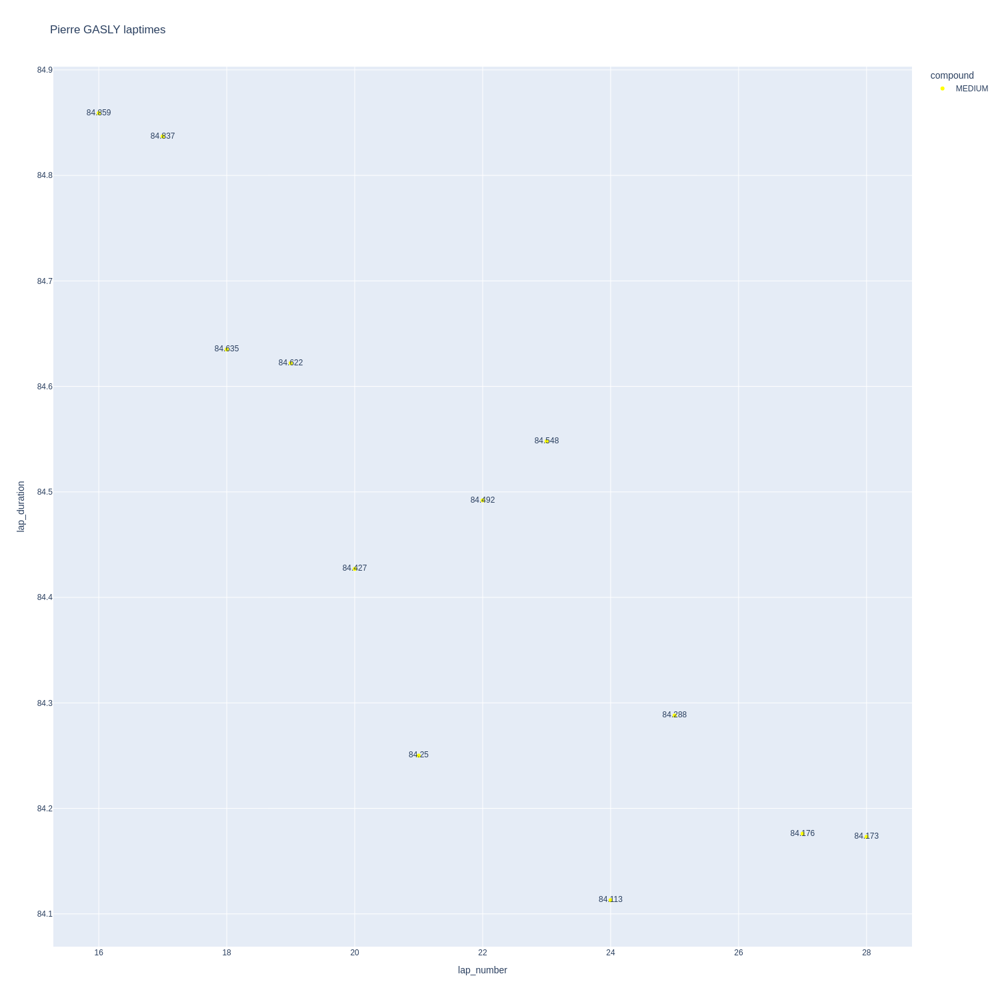

In [78]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

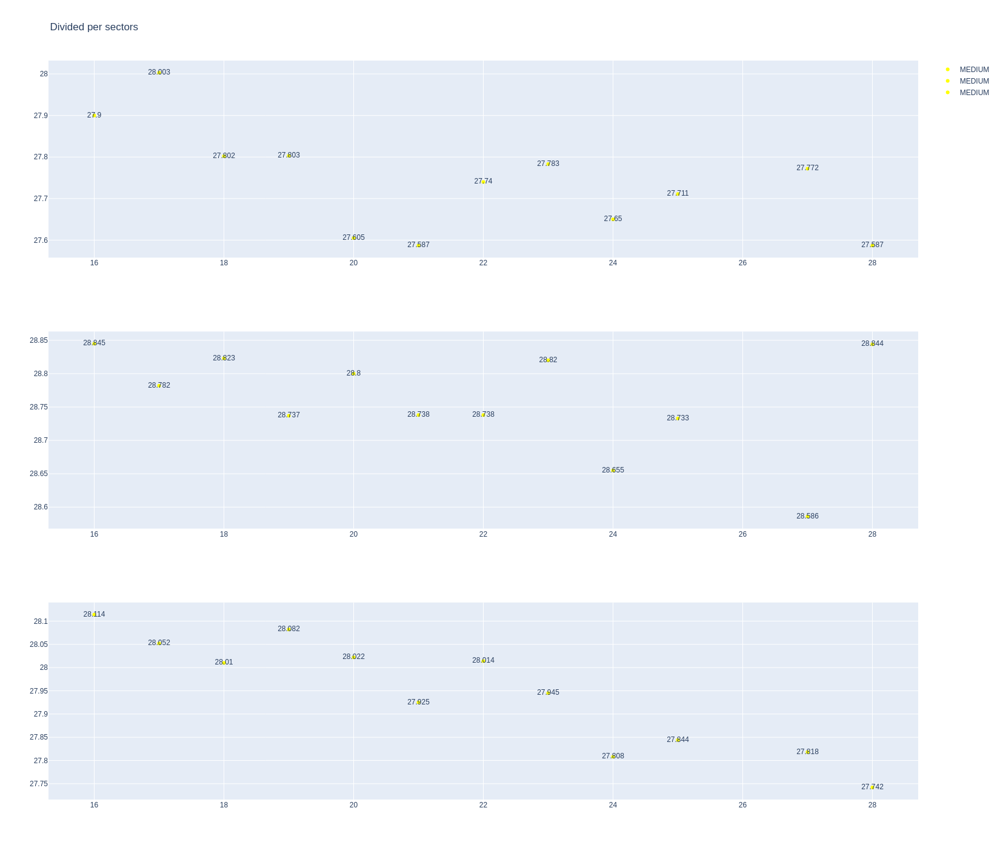

In [79]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [80]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1268,9906,1,23,1,3,MEDIUM,0
2,1268,9906,1,55,1,3,MEDIUM,0
11,1268,9906,2,55,4,5,MEDIUM,3
20,1268,9906,2,23,4,5,MEDIUM,3
31,1268,9906,3,55,6,11,MEDIUM,5
33,1268,9906,3,23,6,11,MEDIUM,5
61,1268,9906,4,55,12,17,SOFT,0
67,1268,9906,4,23,12,16,SOFT,0
77,1268,9906,5,55,18,27,MEDIUM,11
78,1268,9906,5,23,17,25,MEDIUM,11


In [81]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
329,Alexander ALBON,MEDIUM,2025-09-05T15:47:13.056000+00:00,18,27.661,28.727,28.138,84.526
363,Alexander ALBON,MEDIUM,2025-09-05T15:50:04.661000+00:00,20,27.611,28.671,28.152,84.434
382,Alexander ALBON,MEDIUM,2025-09-05T15:51:29.047000+00:00,21,27.580,28.602,28.185,84.367
401,Alexander ALBON,MEDIUM,2025-09-05T15:52:53.434000+00:00,22,27.447,28.693,27.920,84.060
420,Alexander ALBON,MEDIUM,2025-09-05T15:54:17.491000+00:00,23,27.413,28.791,27.827,84.031
439,Alexander ALBON,MEDIUM,2025-09-05T15:55:41.468000+00:00,24,27.337,28.341,28.096,83.774


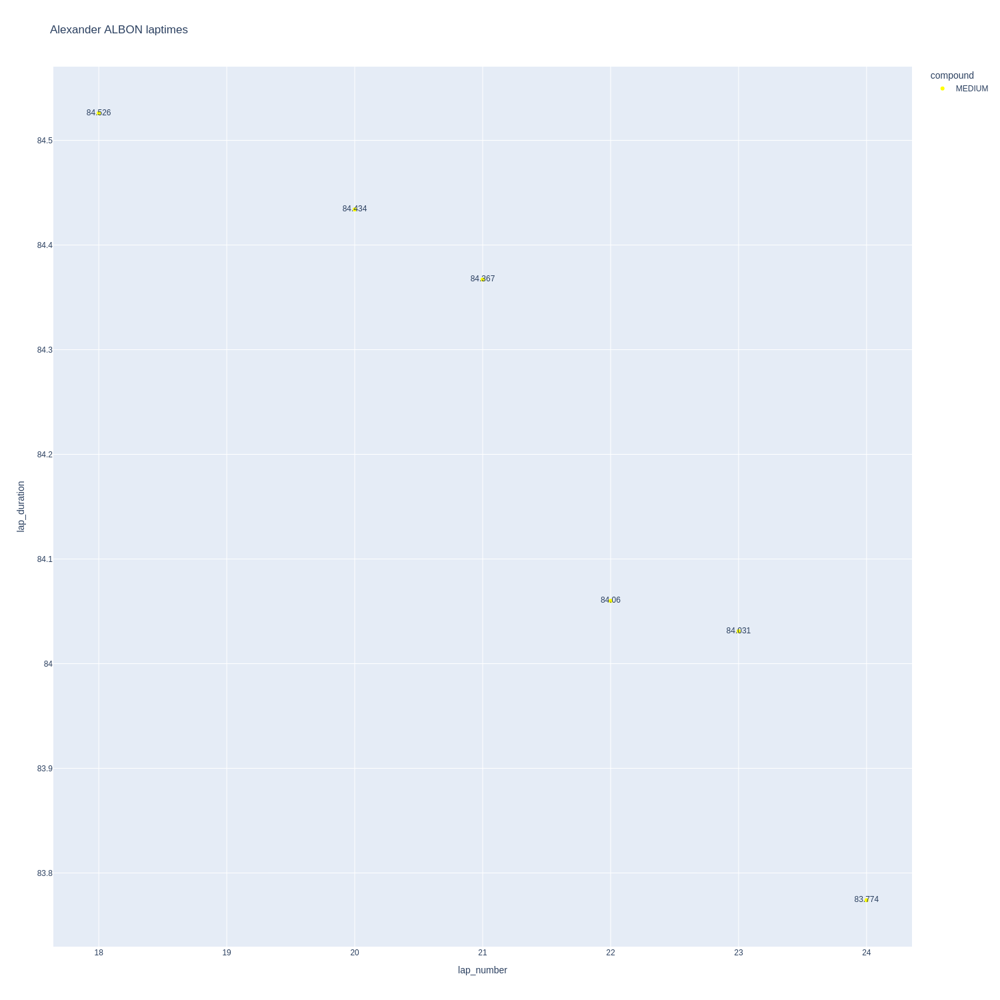

In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

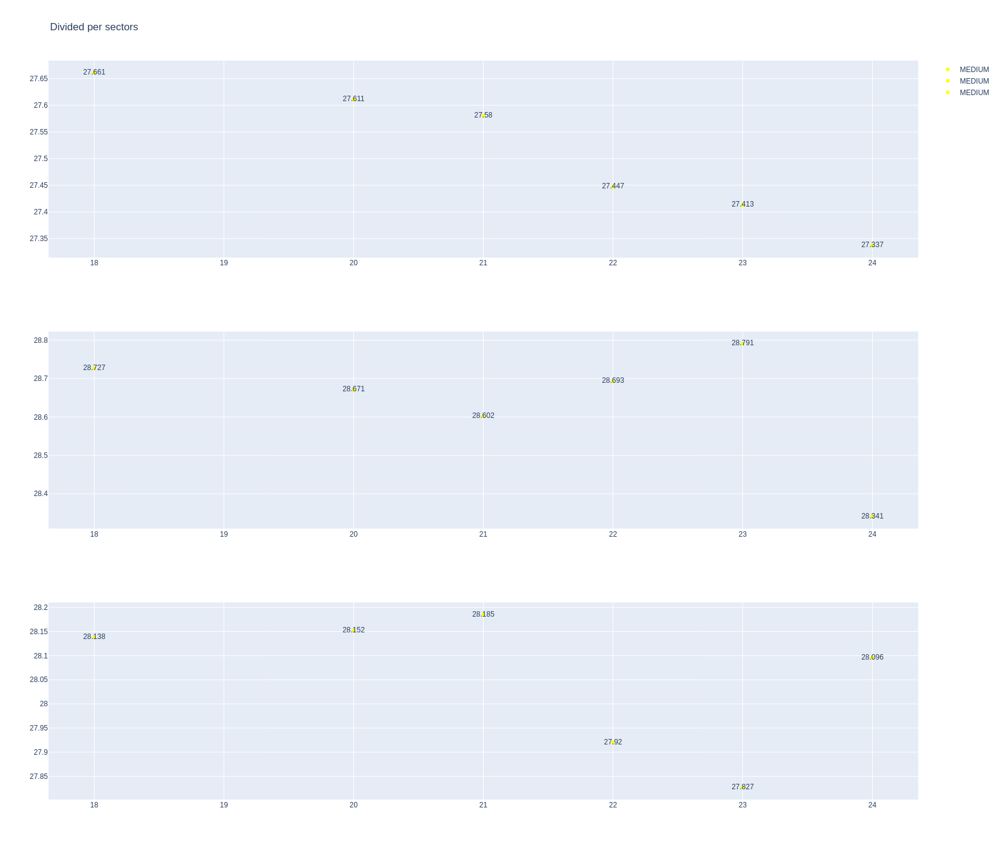

In [83]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [84]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
313,Carlos SAINZ,MEDIUM,2025-09-05T15:45:32.771000+00:00,19,27.621,28.449,28.307,84.377
342,Carlos SAINZ,MEDIUM,2025-09-05T15:48:25.822000+00:00,21,27.734,28.526,28.229,84.489
359,Carlos SAINZ,MEDIUM,2025-09-05T15:49:50.322000+00:00,22,27.602,28.555,28.131,84.288
378,Carlos SAINZ,MEDIUM,2025-09-05T15:51:14.556000+00:00,23,27.485,28.459,28.029,83.973
397,Carlos SAINZ,MEDIUM,2025-09-05T15:52:38.529000+00:00,24,27.534,28.397,27.922,83.853
416,Carlos SAINZ,MEDIUM,2025-09-05T15:54:02.366000+00:00,25,27.452,28.362,27.789,83.603
435,Carlos SAINZ,MEDIUM,2025-09-05T15:55:26.085000+00:00,26,27.339,28.258,27.727,83.324


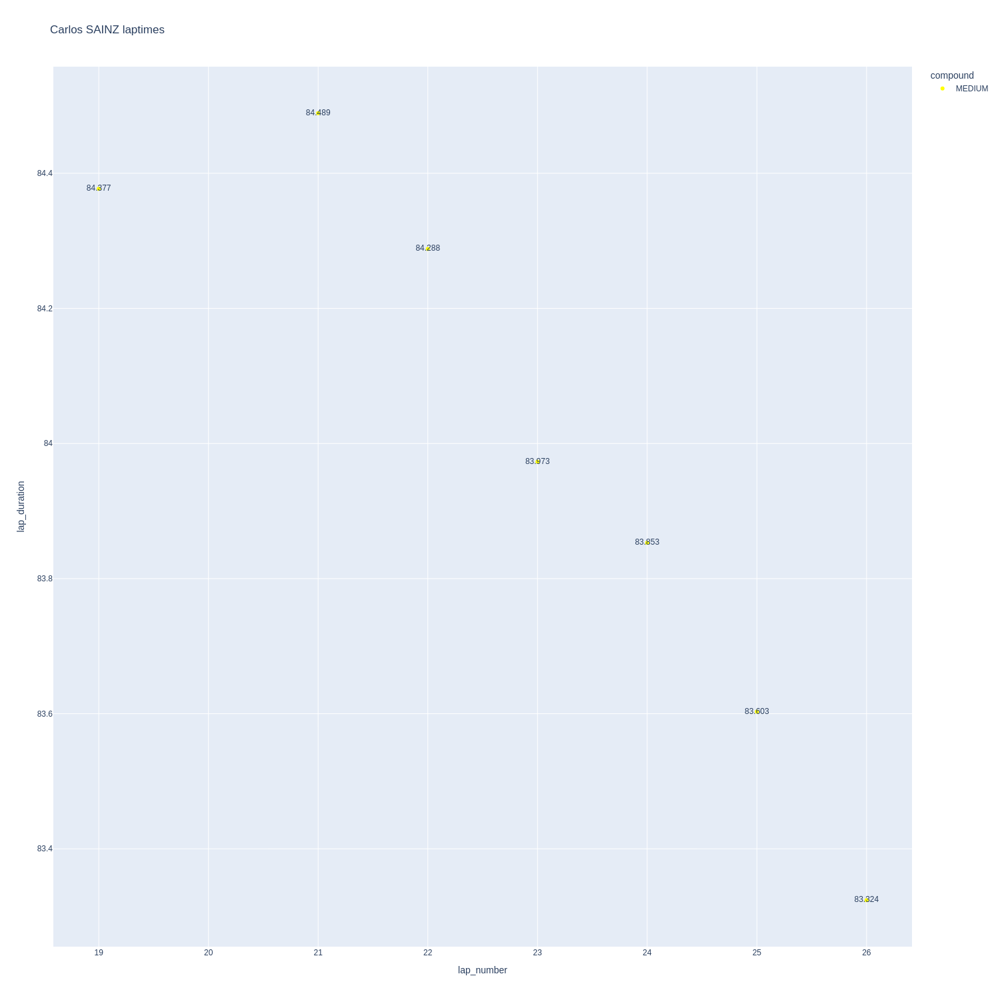

In [85]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

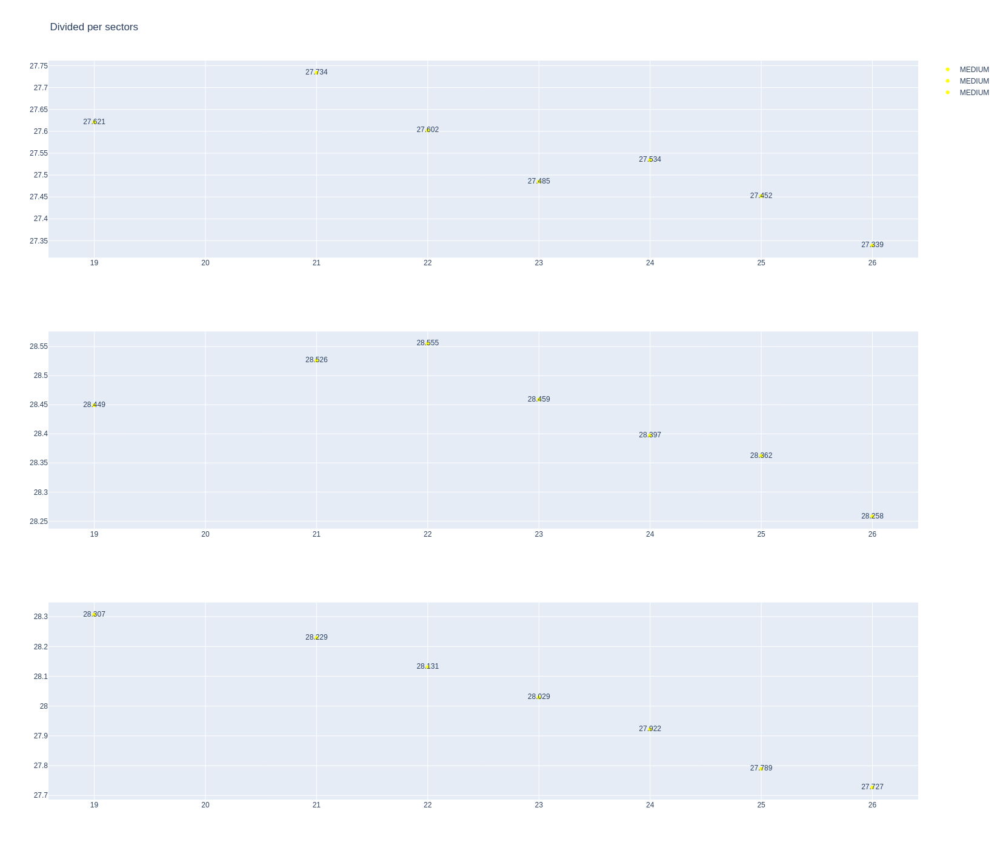

In [86]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [87]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1268,9906,1,5,1,3,MEDIUM,0
8,1268,9906,2,5,4,5,MEDIUM,0
12,1268,9906,1,27,1,5,HARD,0
32,1268,9906,2,27,6,8,HARD,0
34,1268,9906,3,5,6,7,MEDIUM,0
49,1268,9906,3,27,9,11,SOFT,0
52,1268,9906,4,5,8,10,SOFT,0
63,1268,9906,4,27,12,14,SOFT,0
64,1268,9906,5,5,11,13,SOFT,0
71,1268,9906,6,5,14,14,MEDIUM,7


In [88]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
319,Nico HULKENBERG,HARD,2025-09-05T15:46:24.183000+00:00,16,27.766,28.726,27.853,84.345
335,Nico HULKENBERG,HARD,2025-09-05T15:47:48.453000+00:00,17,27.945,28.900,28.005,84.850
351,Nico HULKENBERG,HARD,2025-09-05T15:49:13.328000+00:00,18,27.737,28.832,27.989,84.558
370,Nico HULKENBERG,HARD,2025-09-05T15:50:37.951000+00:00,19,27.864,28.760,27.921,84.545
389,Nico HULKENBERG,HARD,2025-09-05T15:52:02.417000+00:00,20,27.641,28.621,27.920,84.182
408,Nico HULKENBERG,HARD,2025-09-05T15:53:26.660000+00:00,21,27.673,28.789,27.902,84.364
427,Nico HULKENBERG,HARD,2025-09-05T15:54:51.023000+00:00,22,27.668,28.533,27.686,83.887
446,Nico HULKENBERG,HARD,2025-09-05T15:56:14.784000+00:00,23,27.389,28.450,27.612,83.451


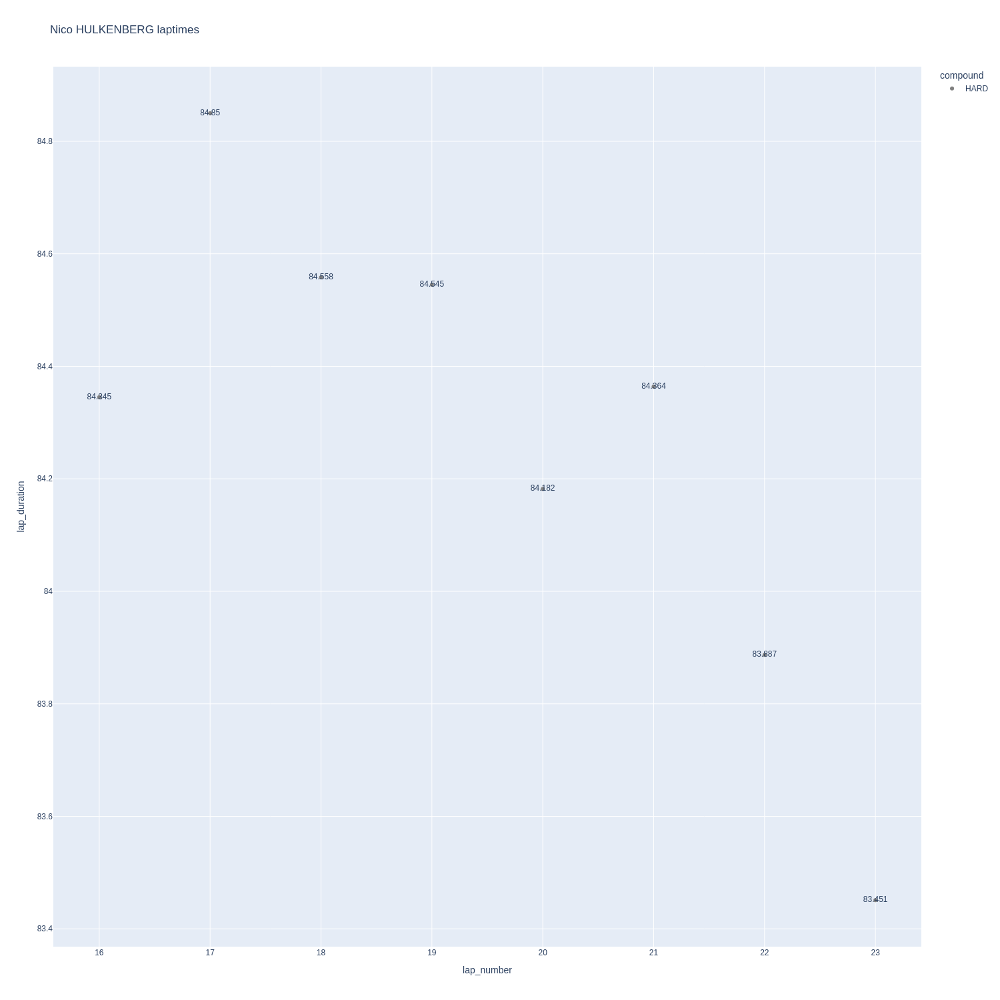

In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

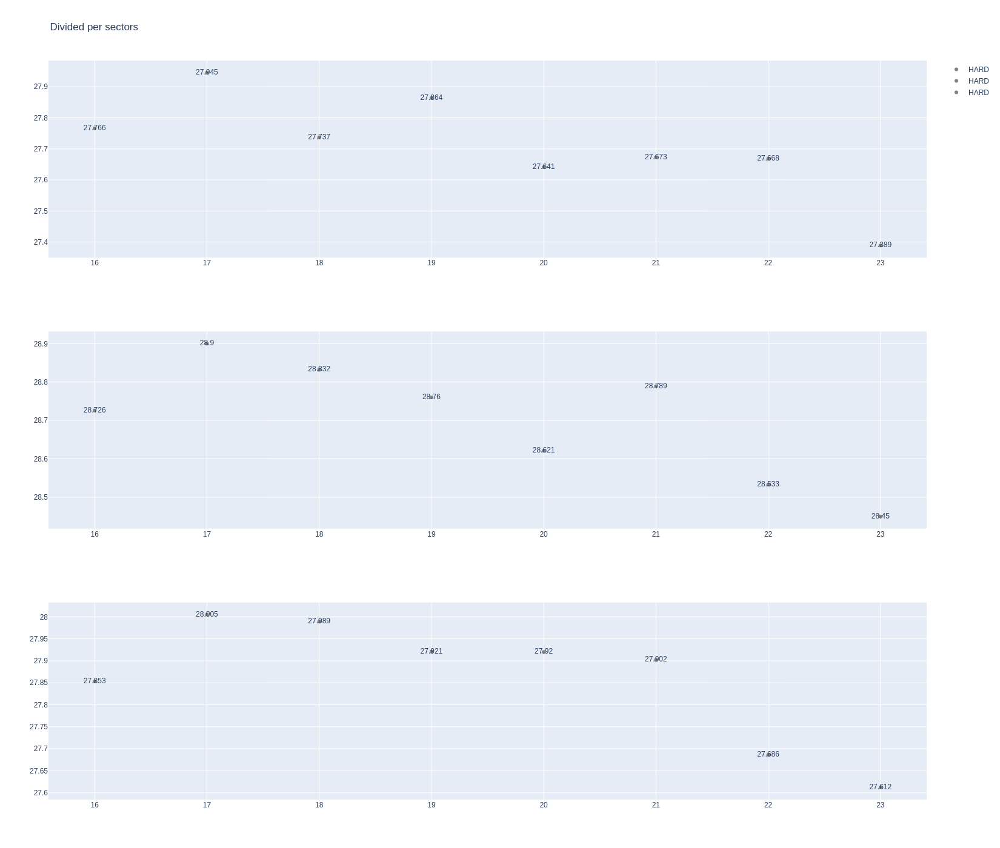

In [90]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [91]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
345,Gabriel BORTOLETO,MEDIUM,2025-09-05T15:48:35.582000+00:00,16,27.611,28.474,27.913,83.998
362,Gabriel BORTOLETO,MEDIUM,2025-09-05T15:49:59.477000+00:00,17,27.670,28.626,28.165,84.461
381,Gabriel BORTOLETO,MEDIUM,2025-09-05T15:51:23.923000+00:00,18,27.744,28.517,28.025,84.286
400,Gabriel BORTOLETO,MEDIUM,2025-09-05T15:52:48.338000+00:00,19,27.537,28.516,27.904,83.957
419,Gabriel BORTOLETO,MEDIUM,2025-09-05T15:54:12.248000+00:00,20,27.660,28.551,27.936,84.147
438,Gabriel BORTOLETO,MEDIUM,2025-09-05T15:55:36.323000+00:00,21,27.586,28.223,27.690,83.499


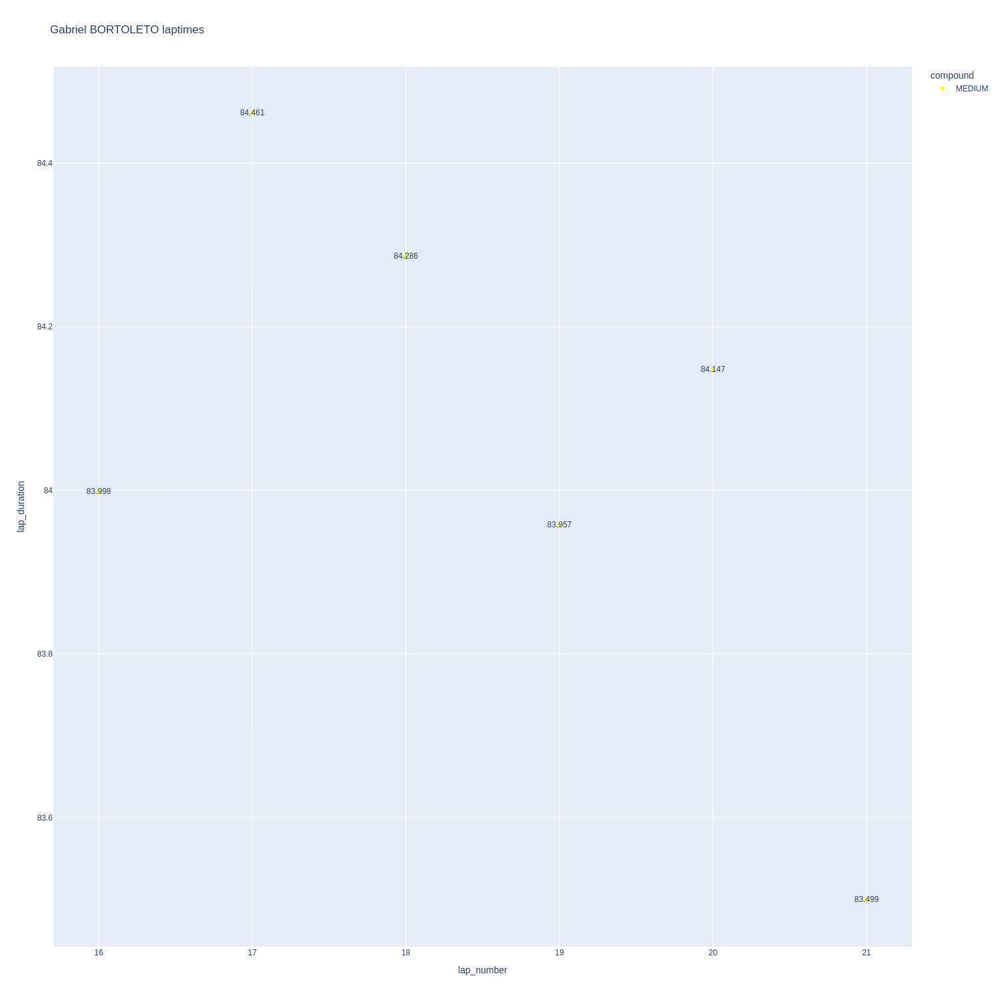

In [92]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

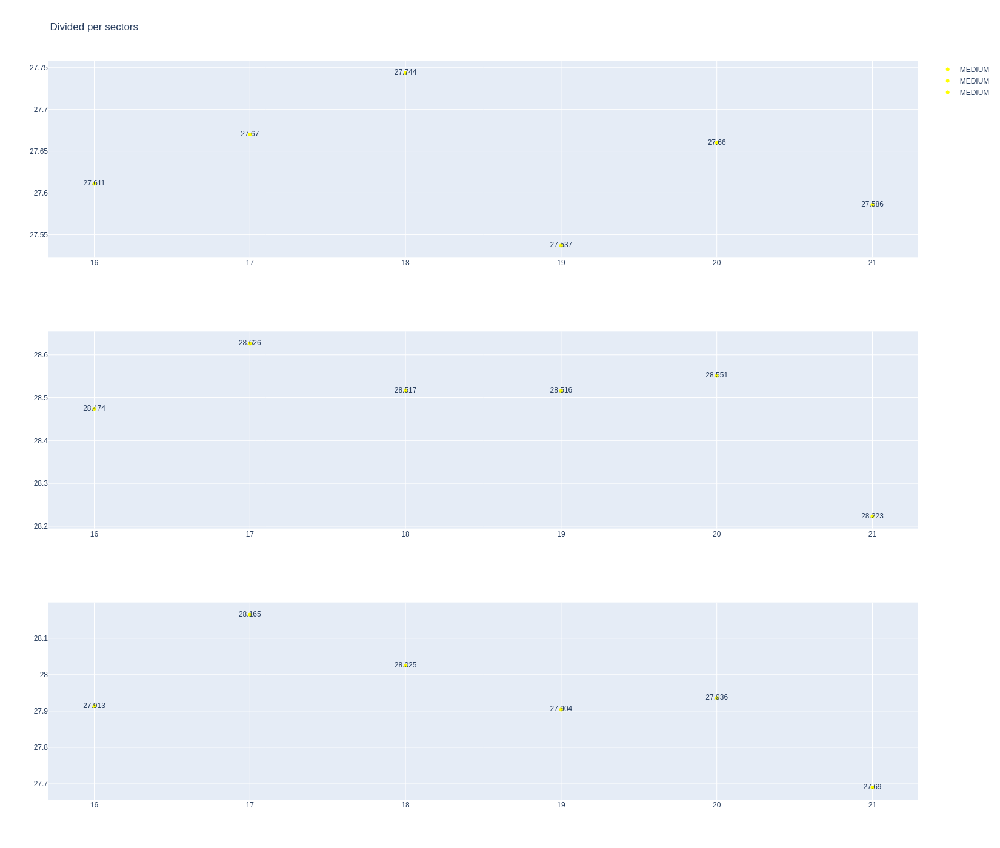

In [93]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [94]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration
It seems that teams powered by HOnda suffers in S1 while Alpine had a good pace. It seems that Aston is the fourth team in race pace witrh softs and mediums.
Aston in S2 is competitive. Colapinto's pace in S3 is interesting and Stroll suffers here.

In [95]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [96]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
1,Lando NORRIS,MEDIUM,83.696727,27.498909,28.419455,27.778364
0,Max VERSTAPPEN,MEDIUM,83.922100,27.599000,28.472100,27.851000
15,Carlos SAINZ,MEDIUM,83.986714,27.538143,28.429429,28.019143
17,Oscar PIASTRI,MEDIUM,84.001556,27.602556,28.507889,27.891111
2,Gabriel BORTOLETO,MEDIUM,84.058000,27.634667,28.484500,27.938833
9,Alexander ALBON,MEDIUM,84.198667,27.508167,28.637500,28.053000
16,George RUSSELL,HARD,84.201375,27.564000,28.483875,28.153500
10,Nico HULKENBERG,HARD,84.272750,27.710375,28.701375,27.861000
12,Esteban OCON,HARD,84.325000,27.794875,28.524875,28.005250
3,Isack HADJAR,MEDIUM,84.373667,27.843000,28.515889,28.014778


##### Sorted by sector 1

In [97]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
14,Lewis HAMILTON,HARD,27.406667
1,Lando NORRIS,MEDIUM,27.498909
9,Alexander ALBON,MEDIUM,27.508167
15,Carlos SAINZ,MEDIUM,27.538143
16,George RUSSELL,HARD,27.564000
0,Max VERSTAPPEN,MEDIUM,27.599000
17,Oscar PIASTRI,MEDIUM,27.602556
2,Gabriel BORTOLETO,MEDIUM,27.634667
5,Fernando ALONSO,MEDIUM,27.684167
7,Lance STROLL,MEDIUM,27.695000


##### Sorted by sector 2

In [98]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
1,Lando NORRIS,MEDIUM,28.419455
15,Carlos SAINZ,MEDIUM,28.429429
5,Fernando ALONSO,MEDIUM,28.444000
0,Max VERSTAPPEN,MEDIUM,28.472100
16,George RUSSELL,HARD,28.483875
2,Gabriel BORTOLETO,MEDIUM,28.484500
17,Oscar PIASTRI,MEDIUM,28.507889
3,Isack HADJAR,MEDIUM,28.515889
12,Esteban OCON,HARD,28.524875
6,Charles LECLERC,SOFT,28.538500


##### Sorted by sector 3

In [99]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
1,Lando NORRIS,MEDIUM,27.778364
0,Max VERSTAPPEN,MEDIUM,27.851000
10,Nico HULKENBERG,HARD,27.861000
17,Oscar PIASTRI,MEDIUM,27.891111
2,Gabriel BORTOLETO,MEDIUM,27.938833
4,Pierre GASLY,MEDIUM,27.948000
8,Yuki TSUNODA,MEDIUM,27.977111
12,Esteban OCON,HARD,28.005250
3,Isack HADJAR,MEDIUM,28.014778
15,Carlos SAINZ,MEDIUM,28.019143


#### Long runs mean

In [ ]:

longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [101]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
1,L NORRIS,83.697
0,M VERSTAPPEN,83.922
15,C SAINZ,83.987
17,O PIASTRI,84.002
2,G BORTOLETO,84.058
9,A ALBON,84.199
3,I HADJAR,84.374
4,P GASLY,84.452
11,L LAWSON,84.522
13,F COLAPINTO,84.715


In [102]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
6,C LECLERC,84.444


In [103]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
16,G RUSSELL,84.201
10,N HULKENBERG,84.273
12,E OCON,84.325
14,L HAMILTON,84.337
18,O BEARMAN,84.748


## Free Practice 3
### Obtain setup

In [104]:
practice = libraryDataF1.obtain_information('laps',session_key=9907)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9907)
drivers = libraryDataF1.obtain_information('drivers',session_key=9907)

In [105]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [106]:
session = ff1.get_session(2025, 16, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (4.83 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Italian Grand Prix - Practice 3 [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
logger      WARNING 	Failed to load result data from Ergast!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status d

### Speed trap

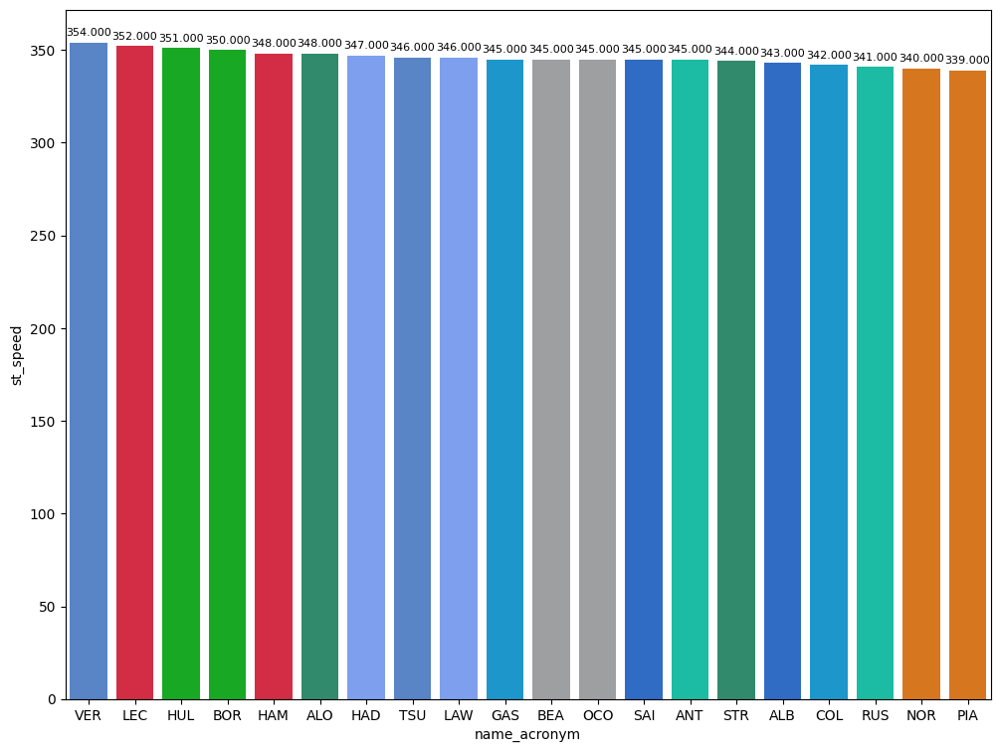

In [107]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

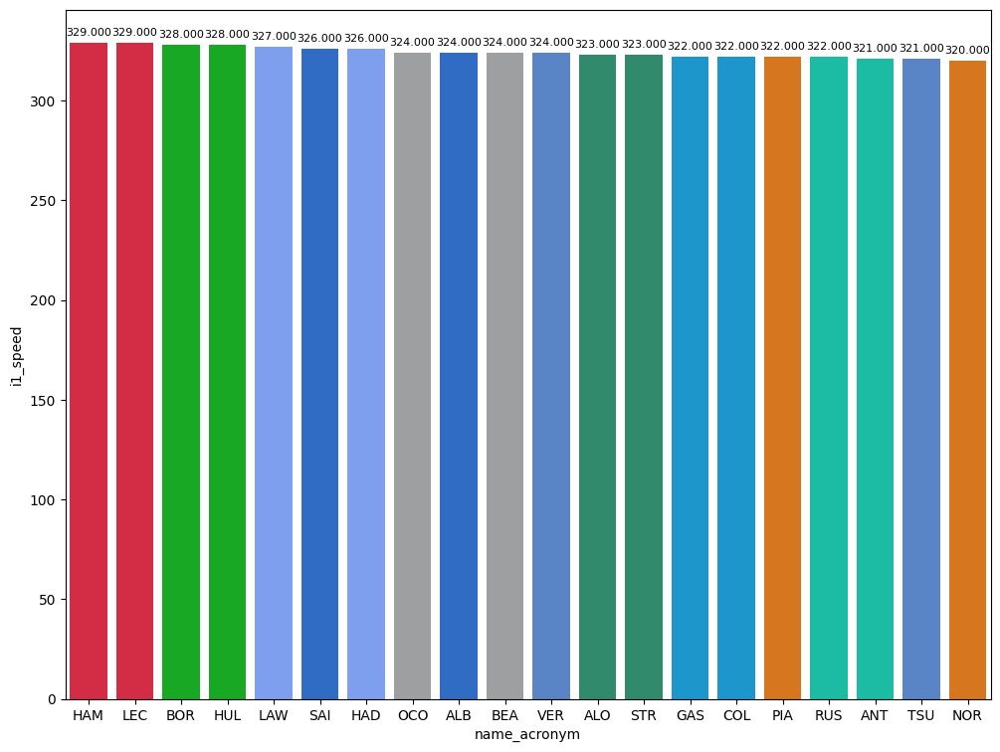

In [108]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

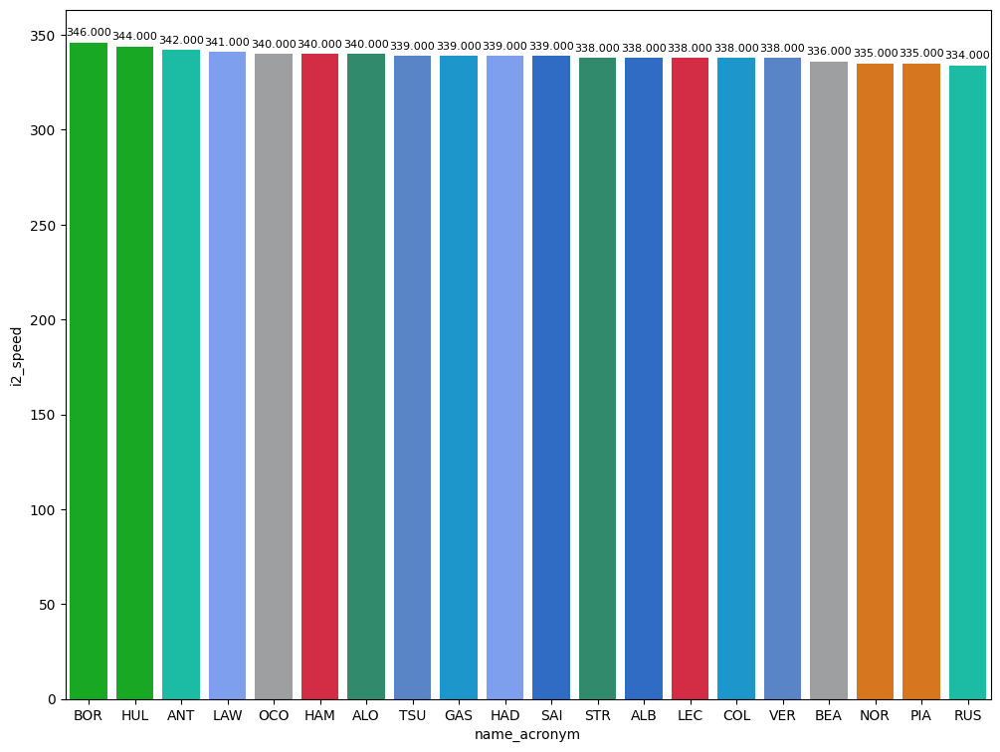

In [109]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [110]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
76,Yuki TSUNODA,HARD,26.818,27.018,26.626,80.462
206,Lewis HAMILTON,MEDIUM,26.510,26.996,26.423,79.929
256,Lando NORRIS,SOFT,26.654,26.411,26.266,79.331


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [111]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


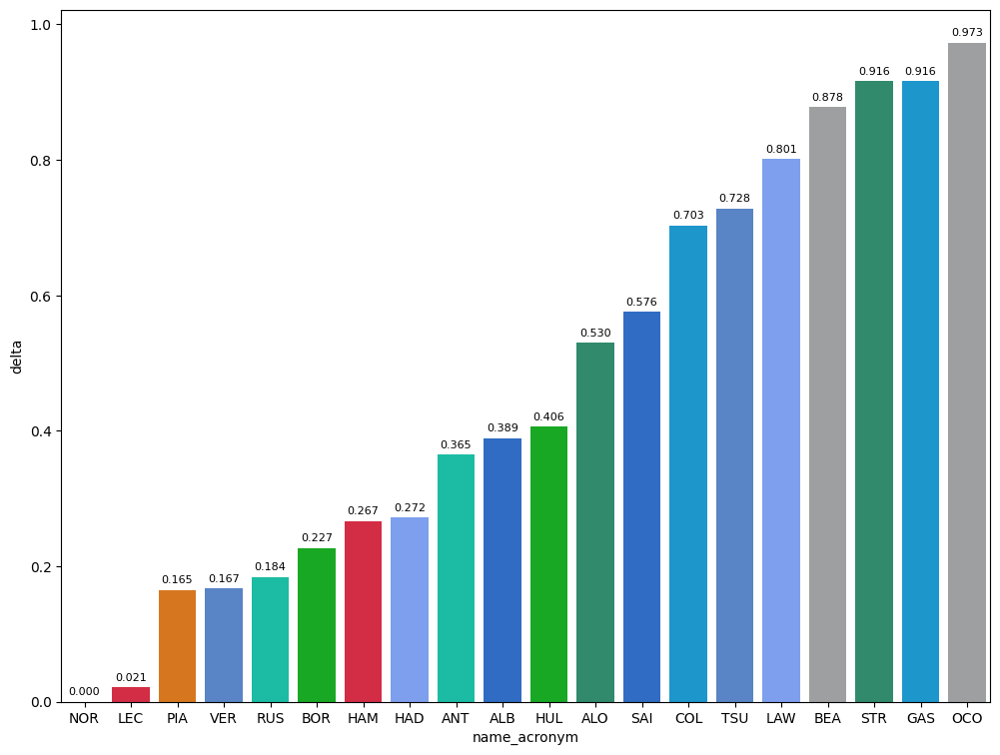

In [112]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

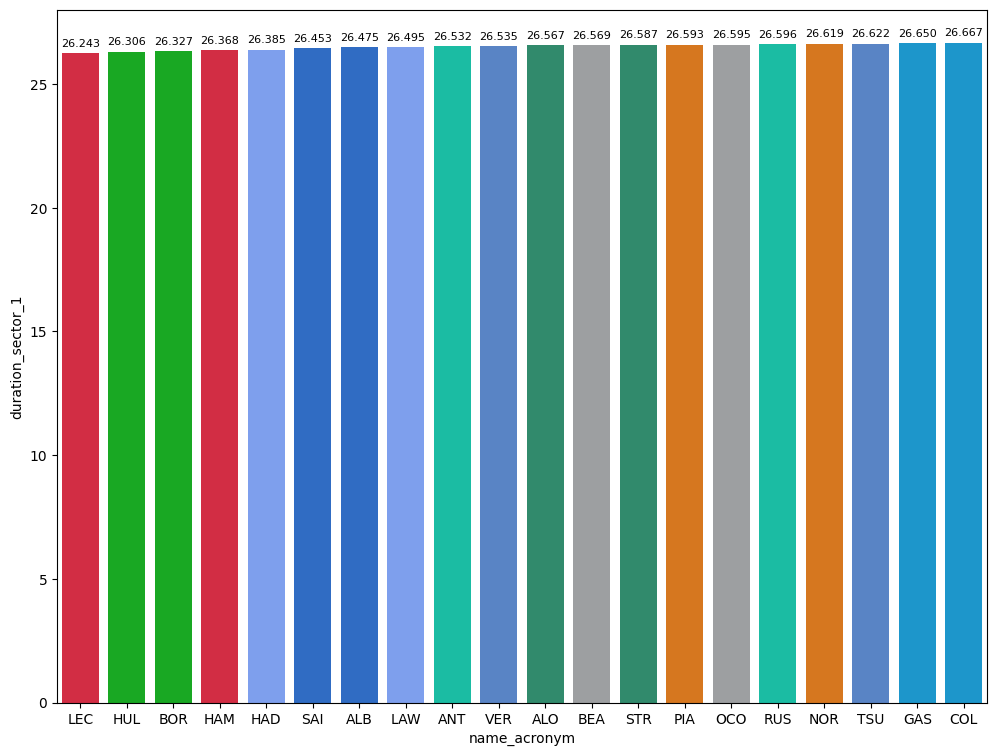

In [113]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

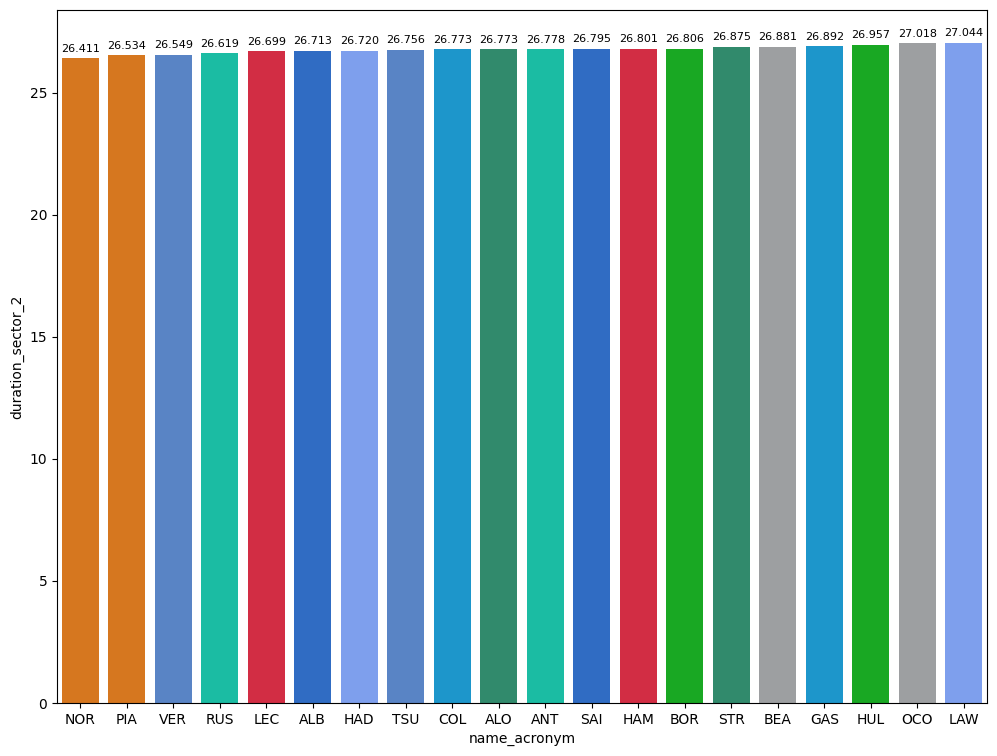

In [114]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

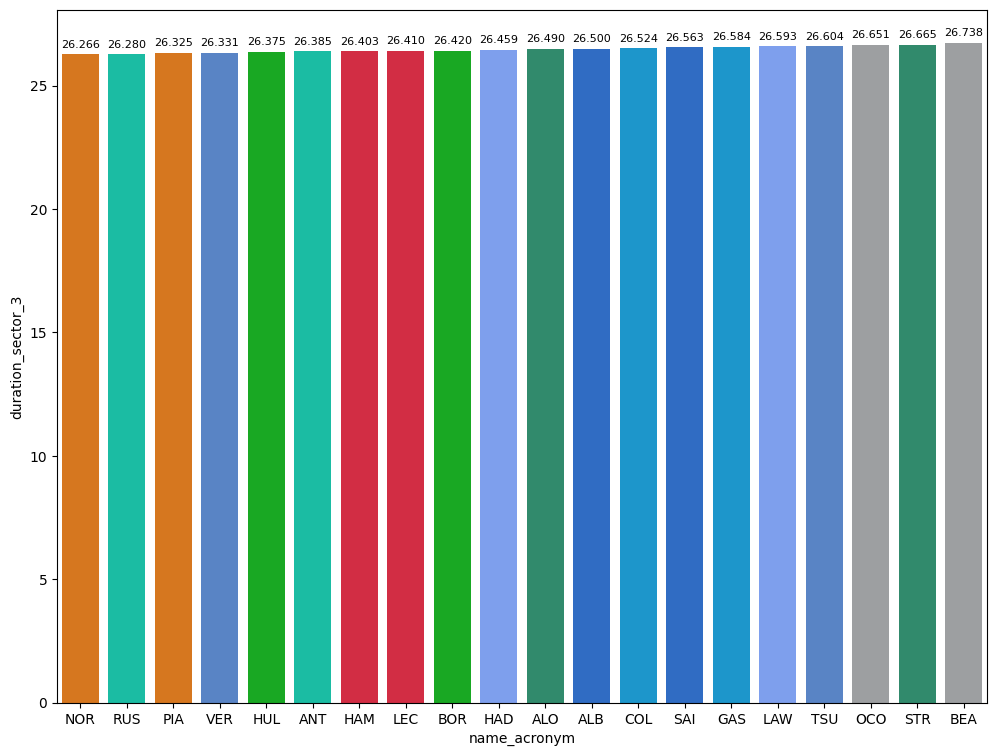

In [115]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [116]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False and lap_duration <88 and lap_duration > 84").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,84.540667
HARD,87.013000
MEDIUM,87.582000


### Comparaison between the poleman and the second

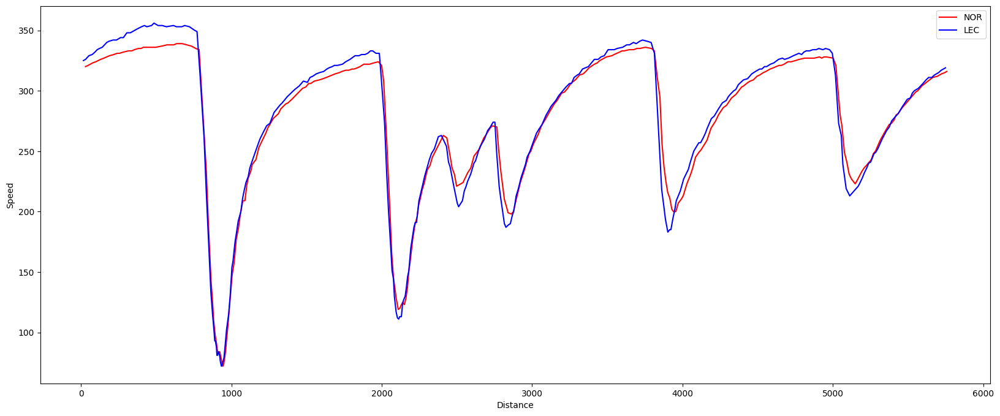

In [117]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

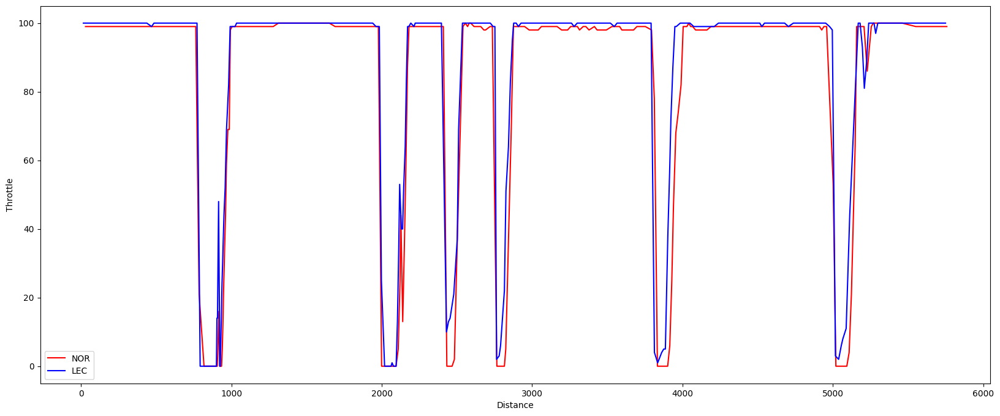

In [118]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

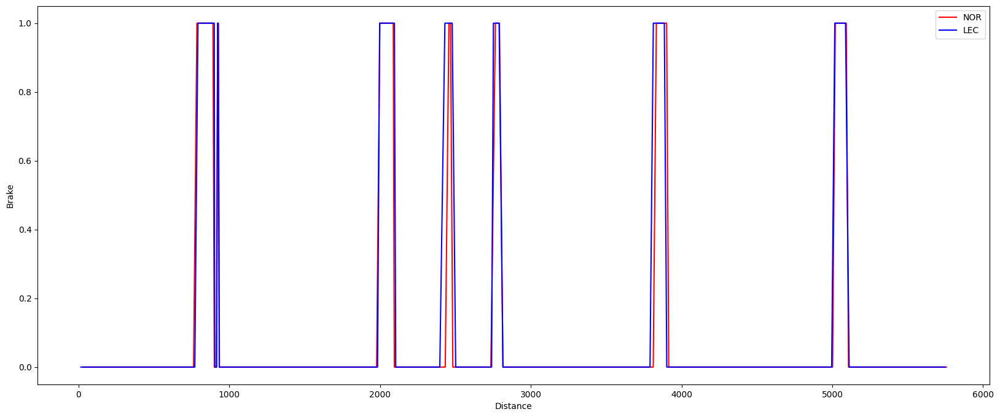

In [119]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

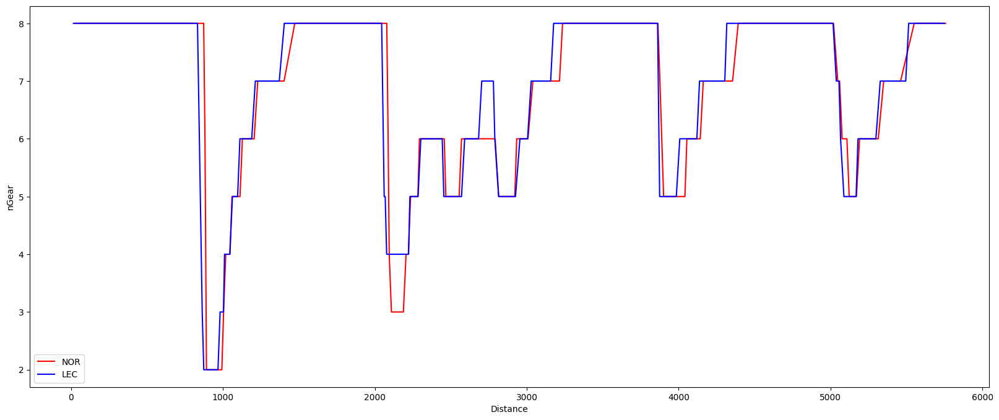

In [120]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Predictions

In [ ]:
# Free Practice 3
practice = libraryDataF1.obtain_information('laps',session_key=9585)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9585)
drivers = libraryDataF1.obtain_information('drivers',session_key=9585)

stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointablesfreepractice3 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])

# Free Practice 2
practice = libraryDataF1.obtain_information('laps',session_key=9584)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9584)
drivers = libraryDataF1.obtain_information('drivers',session_key=9584)


stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointablesfreepractice2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])


### Qualyfing prediction

In [ ]:
qualy_simulation = libraryDataF1.qualyfing_prediction([jointablesfreepractice3,jointablesfreepractice2],drivers,0.02,0.02,0.08)
qualy_simulation.sort_values(by='qualy_lap_time')

### Race prediction

In [ ]:
race_simulation = libraryDataF1.race_prediction(jointablesfreepractice2,drivers,84,88.8)
race_simulation.groupby('team').mean().sort_values(by='mean_lap_duration')

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session. As every laptime that has been deleted were slow laps, none of them were removed.

In [7]:
libraryDataF1.obtain_information('race_control',session_key=9908)

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
0,1268,9908,2025-09-06T14:00:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
1,1268,9908,2025-09-06T14:04:17+00:00,None,None,Other,None,None,NaN,CAR 55 (SAI) TIME 1:20.470 DELETED - TRACK LIM...
2,1268,9908,2025-09-06T14:08:27+00:00,None,None,Other,None,None,NaN,CAR 23 (ALB) TIME 1:43.018 DELETED - TRACK LIM...
3,1268,9908,2025-09-06T14:17:46+00:00,None,None,Other,None,None,NaN,CAR 30 (LAW) LAP DELETED - TRACK LIMITS AT TUR...
4,1268,9908,2025-09-06T14:17:55+00:00,None,None,Other,None,None,NaN,CAR 4 (NOR) TIME 1:40.393 DELETED - TRACK LIMI...
5,1268,9908,2025-09-06T14:18:00+00:00,None,None,Flag,CHEQUERED,Track,NaN,CHEQUERED FLAG
6,1268,9908,2025-09-06T14:18:24+00:00,None,None,Other,None,None,NaN,FIRST CAR TO TAKE THE FLAG - CAR 5 (BOR)
7,1268,9908,2025-09-06T14:18:37+00:00,None,None,Other,None,None,NaN,PIT LANE INCIDENT INVOLVING CAR 55 (SAI) NOTED...
8,1268,9908,2025-09-06T14:20:05+00:00,None,None,Flag,YELLOW,Sector,7.0,YELLOW IN TRACK SECTOR 7
9,1268,9908,2025-09-06T14:20:17+00:00,None,None,Flag,YELLOW,Sector,8.0,YELLOW IN TRACK SECTOR 8


### Obtain setup

In [8]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9908)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9908)
drivers = libraryDataF1.obtain_information('drivers',session_key=9908)
libraryDataF1.obtain_drivers_colours(drivers)

In [9]:
session = ff1.get_session(2024, 16, 'Q')
session.load();
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Italian Grand Prix - Qualifying [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/16/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "/home/frank/.local/lib/python3.8/site-packages/urllib3/connection.py", line 198, in _new_conn
    sock = connection.create_connection(
  File "/home/frank/.local/lib/python3.8/site-packages/urllib3/util/connection.py", line 85, in create_connection
    raise err
  File "/home/frank/.local/lib/python3.8/site-packages/urllib3/util/connection.py", line 73, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/frank/.local/lib/python3.8/site-packages/urllib3/connectionpool.py", line 793, in urlopen
    resp

In [10]:
laptimes_deleted = [80.470]
driver_number_lap_deleted = [55]

for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
    try:
        id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
        qualyfing = qualyfing.drop(id_deleted)
    except:
        print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

In [11]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)

In this case, the fastest lap is 79.327 seconds (1.19.327= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 84.87989 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [12]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration <= 84.87")

In [13]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole.

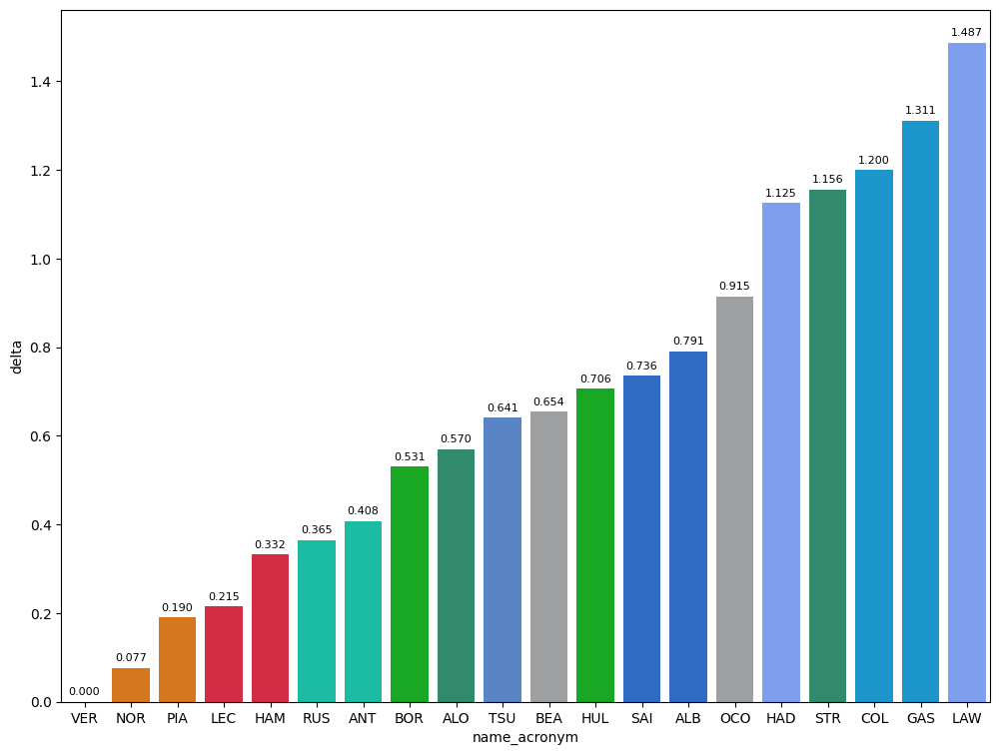

In [14]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

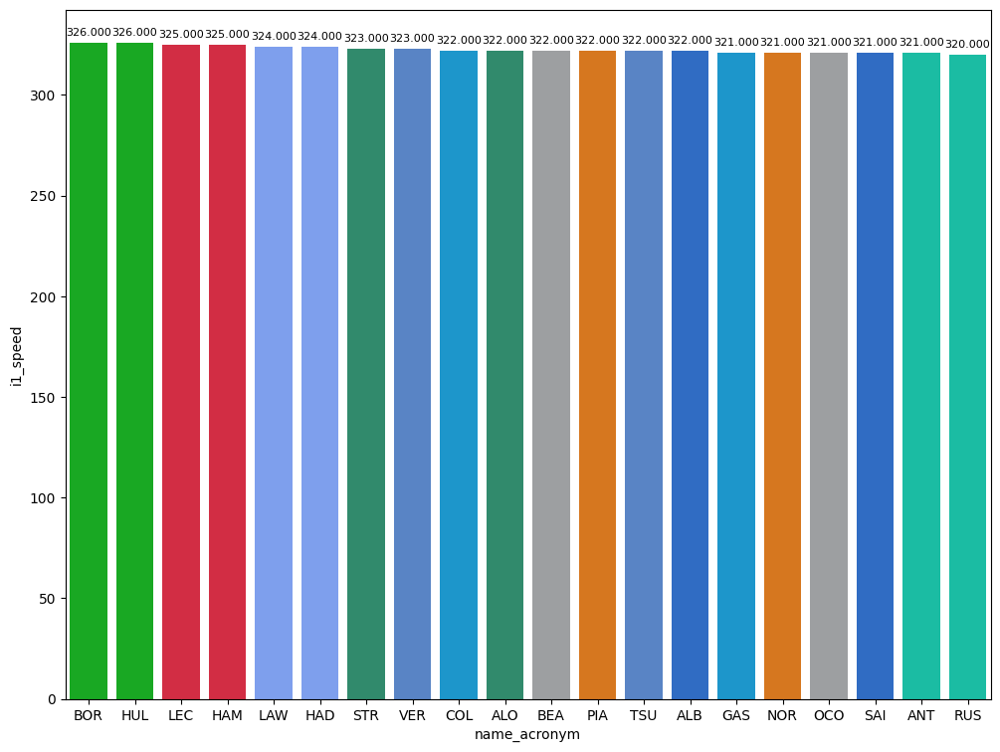

In [15]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

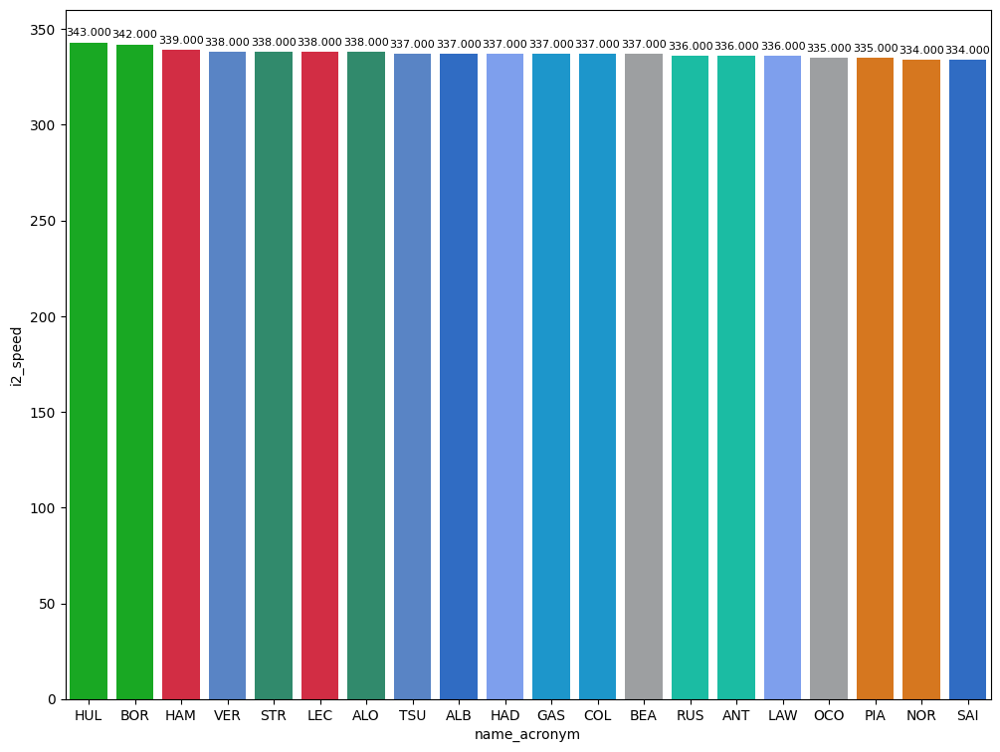

In [16]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

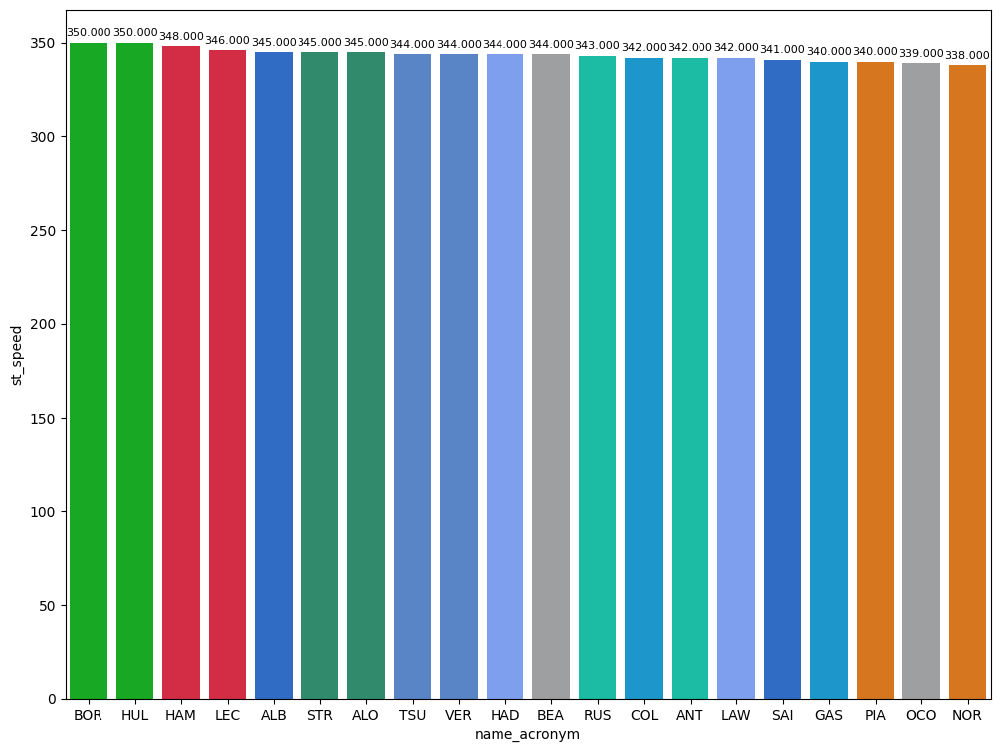

In [17]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

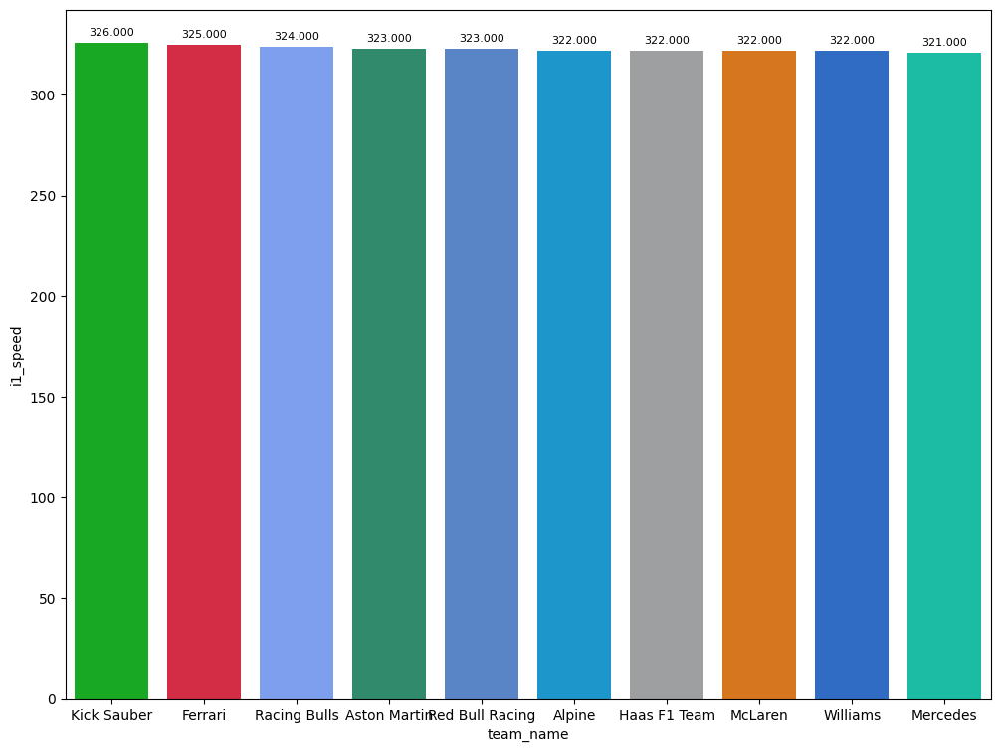

In [18]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

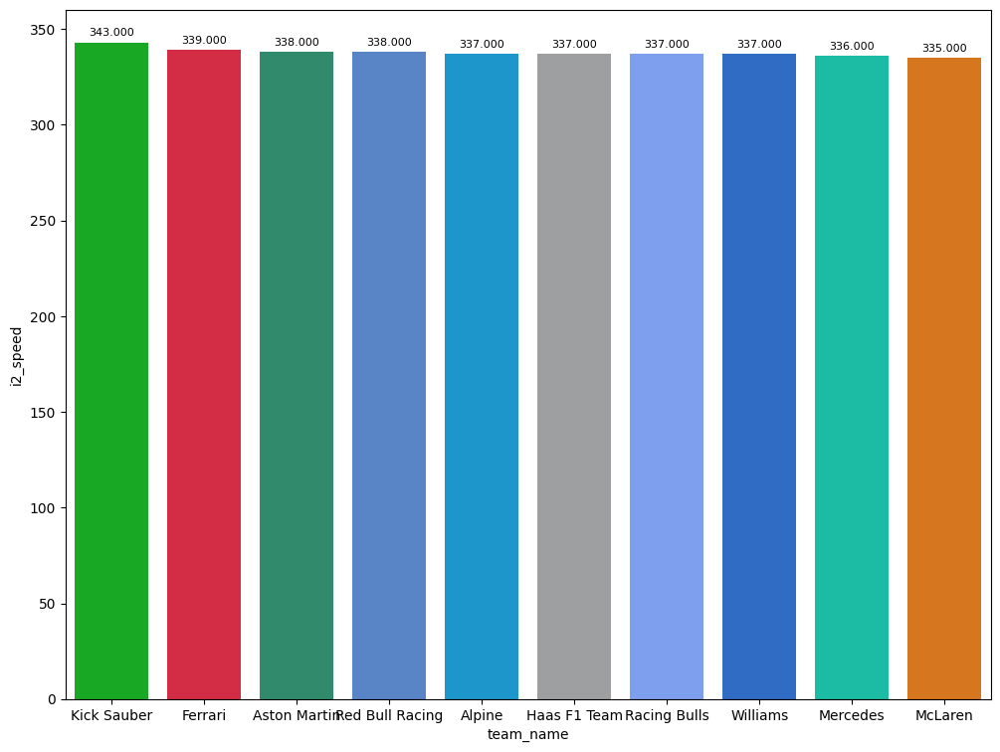

In [19]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

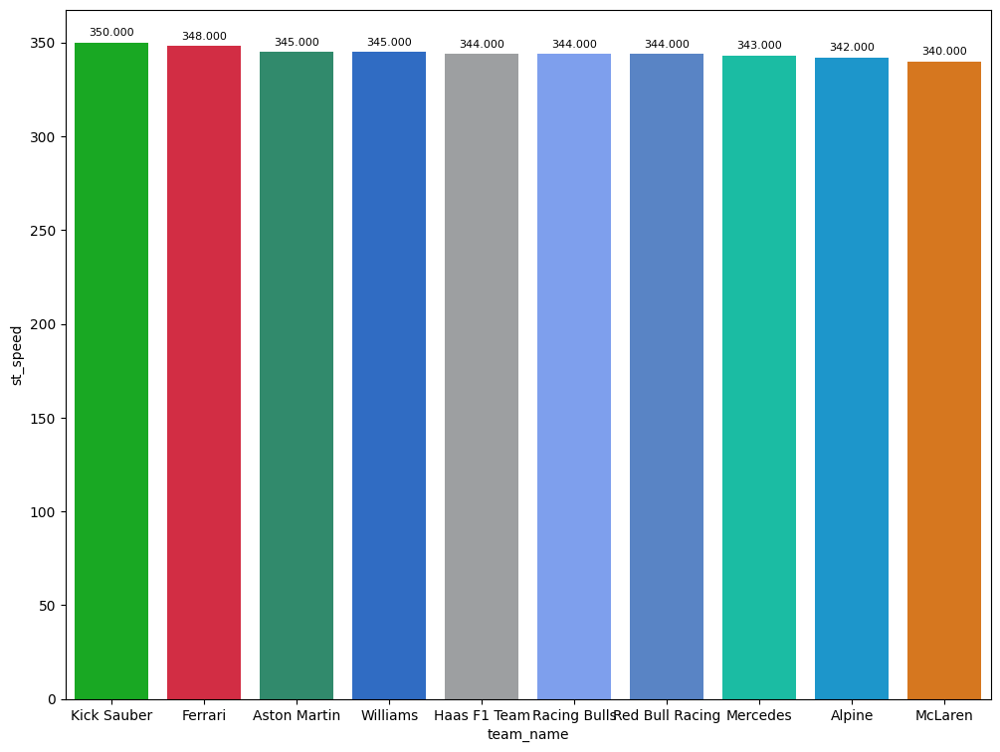

In [20]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [21]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [22]:
maximumDateQ1 = "date_start <'2025-09-06T14:27:00+00:00'"
maximumDateQ2 = "date_start <'2025-09-06T14:50:00+00:00' and date_start >'2025-09-06T14:27:00+00:00'"
maximumDateQ3 = "date_start >'2025-09-06T14:50:00+00:00'"

### Qualyfing 1

In [23]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver,I will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap. 
With the new alphast, some drivers used two compounds to make their fastest lap. Using F1 tempo to watch the telemetry alongside the section where I comment the gap difference among the drivers eliminated compared to the driver that finished in a risk position to be eliminated.
Before the lesmos,Zhou was the fastest followed by Ricciardo, Stroll, Colapinto and Bottas. After the lesmos, Zhou lost his gap being only faster than Bottas. After the Serraglio straight we can observe that the Williams was the fastest,reaching 335 km/h and Colapinto cut his gap.After this straight, Stroll had the best second sector of this group but , unfortunately, he lost his gap in the third sector. 
Pdte: Colapinto's laptime was his fastest laptime. In his second attemp, he got wrong in the exit of the second lesmo


In [24]:
#Reference
P15 = q1Data[14:15]

In [25]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Alexander ALBON Sector 1:  26.466 Sector 2:  26.862 Sector 3:  26.509


In [26]:
q1Data[15::]

,meeting_key_x,session_key_x,driver_number,lap_number,date_start,duration_sector_1,duration_sector_2,duration_sector_3,i1_speed,i2_speed,...,broadcast_name,full_name,name_acronym,team_name,team_colour,first_name,last_name,headshot_url,country_code,isFastestLap
87,1268,9908,6,5,2025-09-06T14:16:13.577000+00:00,26.331,27.092,26.494,326,338,...,I HADJAR,Isack HADJAR,HAD,Racing Bulls,6C98FF,Isack,Hadjar,https://media.formula1.com/d_driver_fallback_i...,None,True
12,1268,9908,18,8,2025-09-06T14:16:39.105000+00:00,26.502,26.903,26.543,323,339,...,L STROLL,Lance STROLL,STR,Aston Martin,229971,Lance,Stroll,https://media.formula1.com/d_driver_fallback_i...,None,True
31,1268,9908,43,8,2025-09-06T14:16:25.894000+00:00,26.547,27.016,26.429,322,337,...,F COLAPINTO,Franco COLAPINTO,COL,Alpine,00A1E8,Franco,Colapinto,None,None,True
15,1268,9908,10,8,2025-09-06T14:16:19.120000+00:00,26.628,26.961,26.514,323,338,...,P GASLY,Pierre GASLY,GAS,Alpine,00A1E8,Pierre,Gasly,https://media.formula1.com/d_driver_fallback_i...,None,True
88,1268,9908,30,2,2025-09-06T14:06:11.433000+00:00,26.557,27.050,26.672,324,336,...,L LAWSON,Liam LAWSON,LAW,Racing Bulls,6C98FF,Liam,Lawson,https://media.formula1.com/d_driver_fallback_i...,None,True


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [27]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,6,0.080,-0.135,0.230,-0.015,HAD
1,18,0.111,0.036,0.041,0.034,STR
2,43,0.155,0.081,0.154,-0.080,COL
3,10,0.266,0.162,0.099,0.005,GAS
4,30,0.442,0.091,0.188,0.163,LAW


In [28]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

/home/frank/.local/lib/python3.8/site-packages/fastf1/core.py:3063: FutureWarning: In the future, `None` will be returned instead of an empty `Lap` object when there are no laps that satisfy the definition for fastest lap.
  warnings.warn(("In the future, `None` will be returned instead of "
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"


ValueError: Cannot slice telemetry because self contains no driver number!

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.

In [29]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,63,-0.423,0.193,-0.300,-0.316,RUS
1,1,-0.382,0.040,-0.237,-0.185,VER
2,4,-0.320,0.032,-0.236,-0.116,NOR
3,22,-0.218,0.050,-0.096,-0.172,TSU
4,55,-0.193,0.081,-0.225,-0.049,SAI
5,14,-0.179,-0.118,-0.010,-0.051,ALO
6,87,-0.149,0.092,-0.088,-0.153,BEA
7,5,-0.149,-0.094,0.007,-0.062,BOR
8,16,-0.148,0.004,-0.126,-0.026,LEC
9,81,-0.126,0.223,-0.199,-0.150,PIA


#### Best sector per driver
In this section we can see the best sector of the session

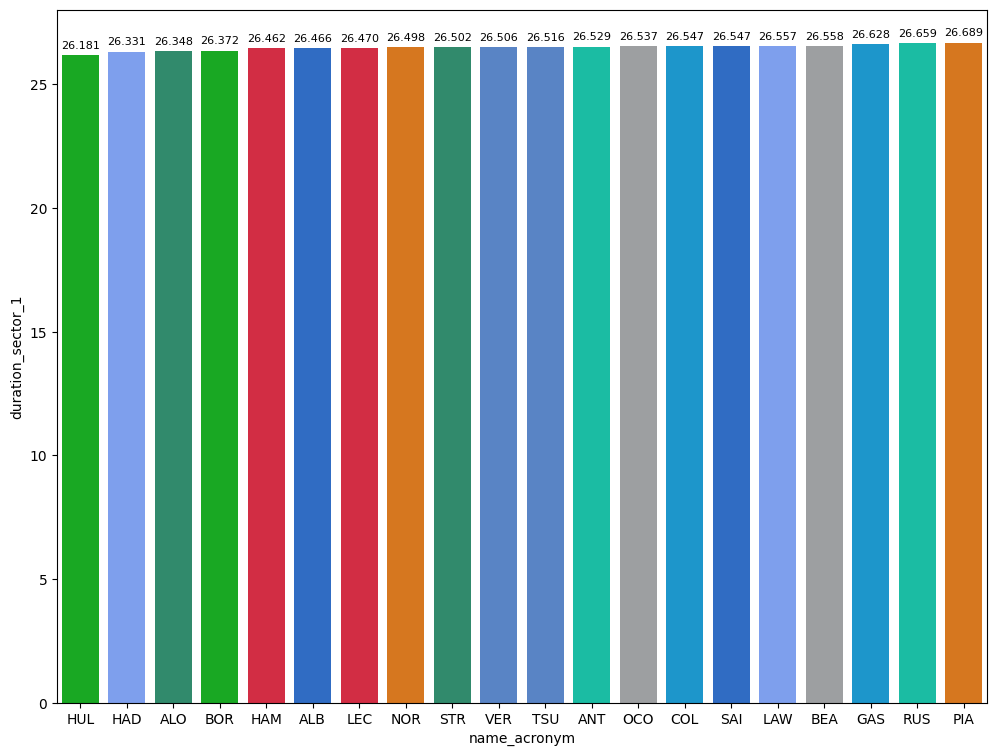

In [30]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

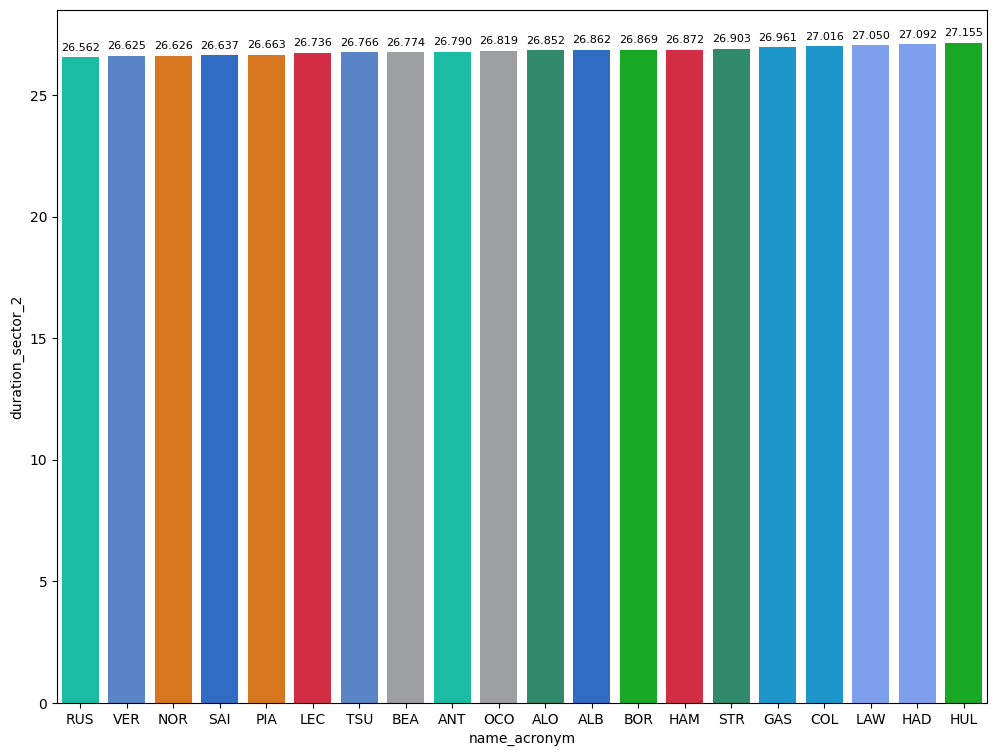

In [31]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

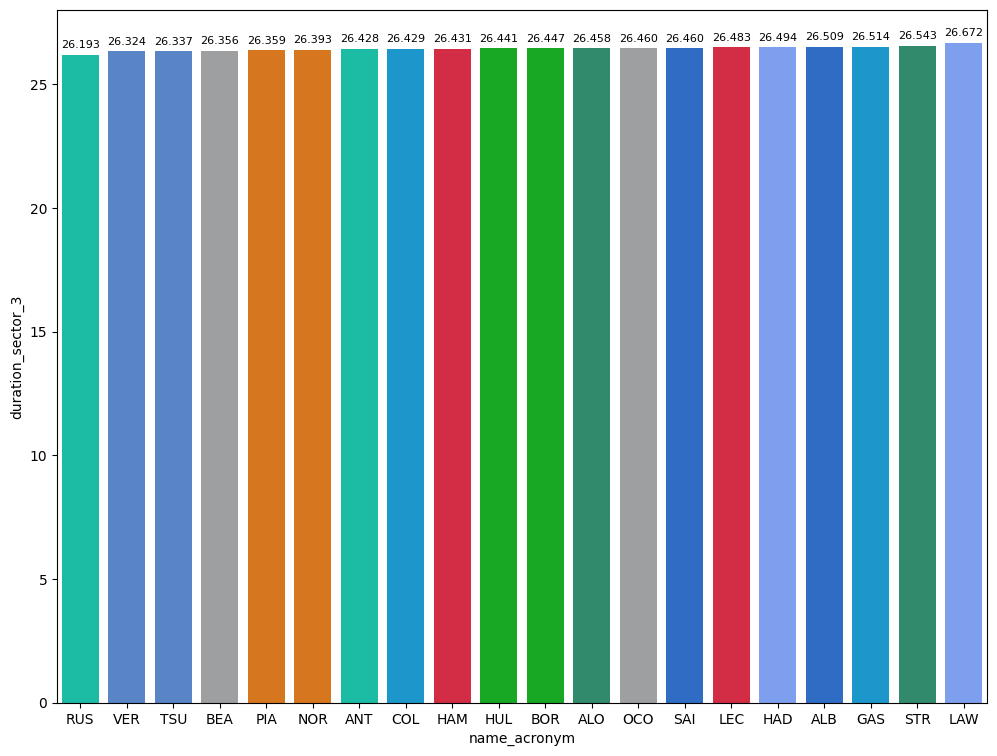

In [32]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2

In [33]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.
Differences are usually narrow but, in this case, were pretty narrow. In the exit of turn 1,Ricciardo was the fastest and, since then, the fight was between Ricciardo and Hulkenberg being the Australian the fastest.
Alonso that was 1.5 tenths behind then, cut his gap thanks to the second DRS zone.being only 0.084 slower than Hulkenberg- In case of Ricciardo, he lost his lap in this straight Since the exit of the chicane of the secondd sector, Alonso was the fastest being in front of Hulkenberg but in the last turn, Hulkenberg cut the enough gap to pass to Q3.

In [34]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Yuki TSUNODA Sector 1:  26.42 Sector 2:  26.672 Sector 3:  26.341


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [35]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,87,0.013,-0.044,0.064,-0.007,BEA
1,27,0.065,-0.082,0.144,0.003,HUL
2,55,0.095,-0.027,0.035,0.087,SAI
3,23,0.150,0.022,-0.029,0.157,ALB
4,31,0.274,0.122,0.057,0.095,OCO


In [36]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

/home/frank/.local/lib/python3.8/site-packages/fastf1/core.py:3063: FutureWarning: In the future, `None` will be returned instead of an empty `Lap` object when there are no laps that satisfy the definition for fastest lap.
  warnings.warn(("In the future, `None` will be returned instead of "
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"


ValueError: Cannot slice telemetry because self contains no driver number!

##### Analysis with the drivers that finished better than the driver at risk

In [37]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.293,-0.014,-0.134,-0.145,VER
1,12,-0.188,0.041,-0.059,-0.170,ANT
2,81,-0.147,0.128,-0.143,-0.132,PIA
3,63,-0.146,0.095,-0.104,-0.137,RUS
4,4,-0.140,0.040,-0.047,-0.133,NOR
5,16,-0.123,0.012,-0.036,-0.099,LEC
6,5,-0.110,-0.205,0.110,-0.015,BOR
7,14,-0.071,-0.026,-0.079,0.034,ALO
8,44,-0.062,-0.137,0.015,0.060,HAM


#### Best sector per driver
In this section we can see the best sector of the session

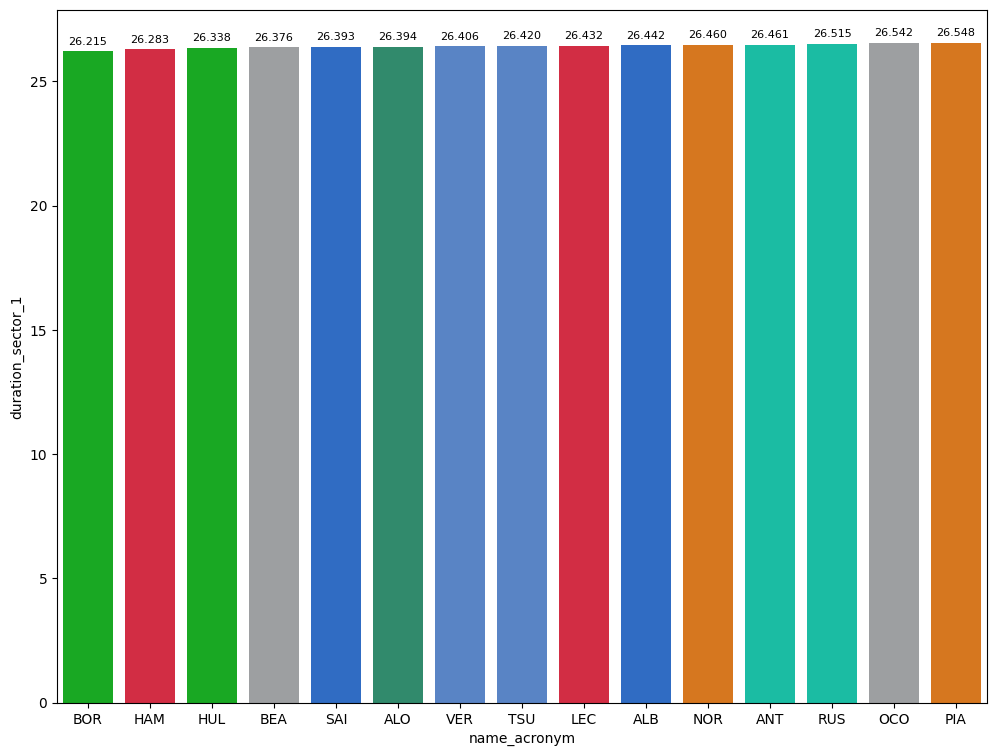

In [38]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

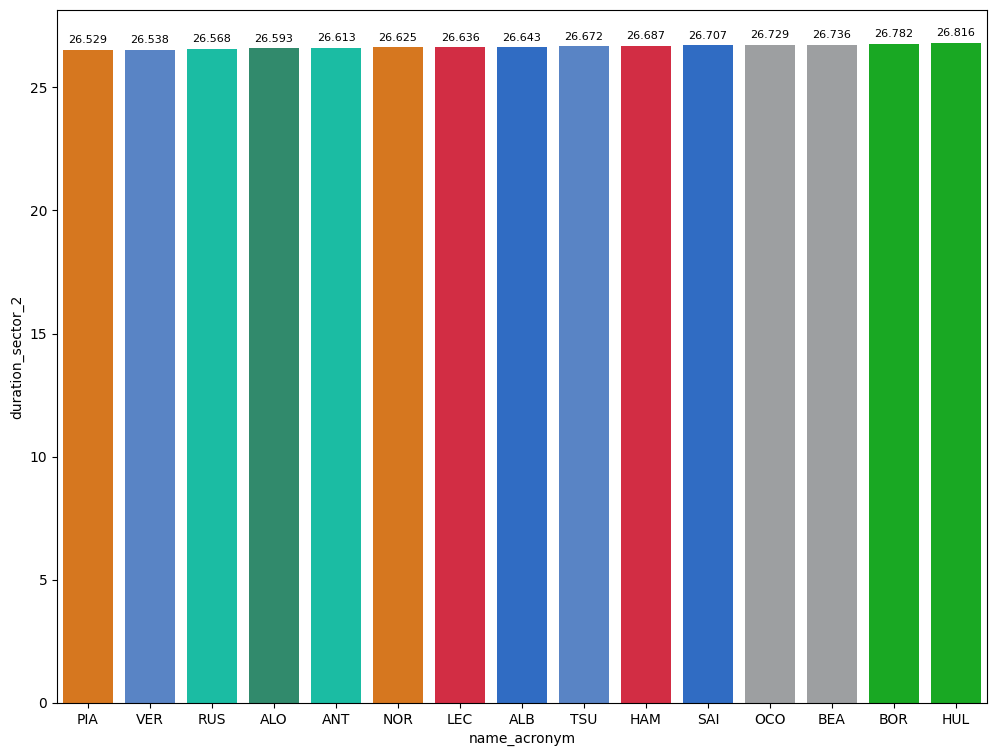

In [39]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

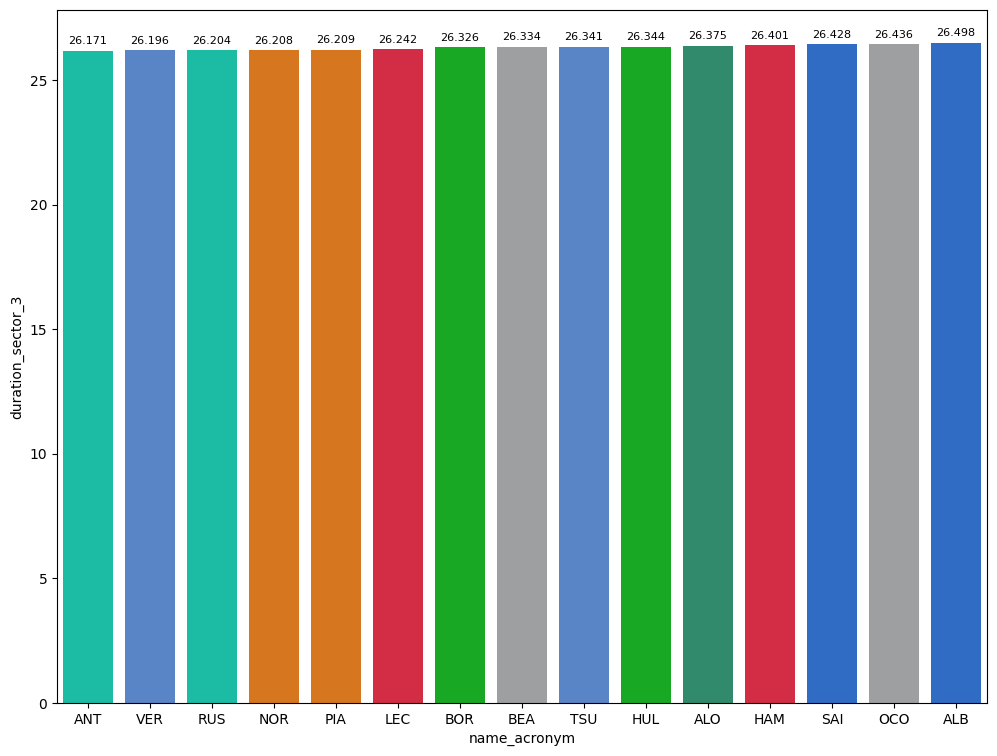

In [40]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [41]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [42]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  26.262 Sector 2:  26.483 Sector 3:  26.047


##### Analysis of each sector of the poleman compared to the drivers eliminated.
McLaren had an extra in Monza that this one was showed in Qualyfing with McLaren achiving 1-2 in Qualy.As we can see, even though,Norris's first sector was the slowest of the group but his second sector was astonishing being only Piastri the unique driver that was in his tenth and his thrid sector, only Russell was able to be in his time.


In [43]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,0.077,0.116,-0.045,0.006,NOR
1,81,0.190,0.314,-0.143,0.019,PIA
2,16,0.215,0.003,0.099,0.113,LEC
3,44,0.332,-0.043,0.203,0.172,HAM
4,63,0.365,0.252,-0.049,0.162,RUS
5,12,0.408,0.203,0.157,0.048,ANT
6,5,0.598,-0.029,0.193,0.434,BOR
7,14,0.632,0.207,0.109,0.316,ALO
8,22,0.727,0.254,0.162,0.311,TSU


#### Best sector per driver
In this section we can see the best sector of the session

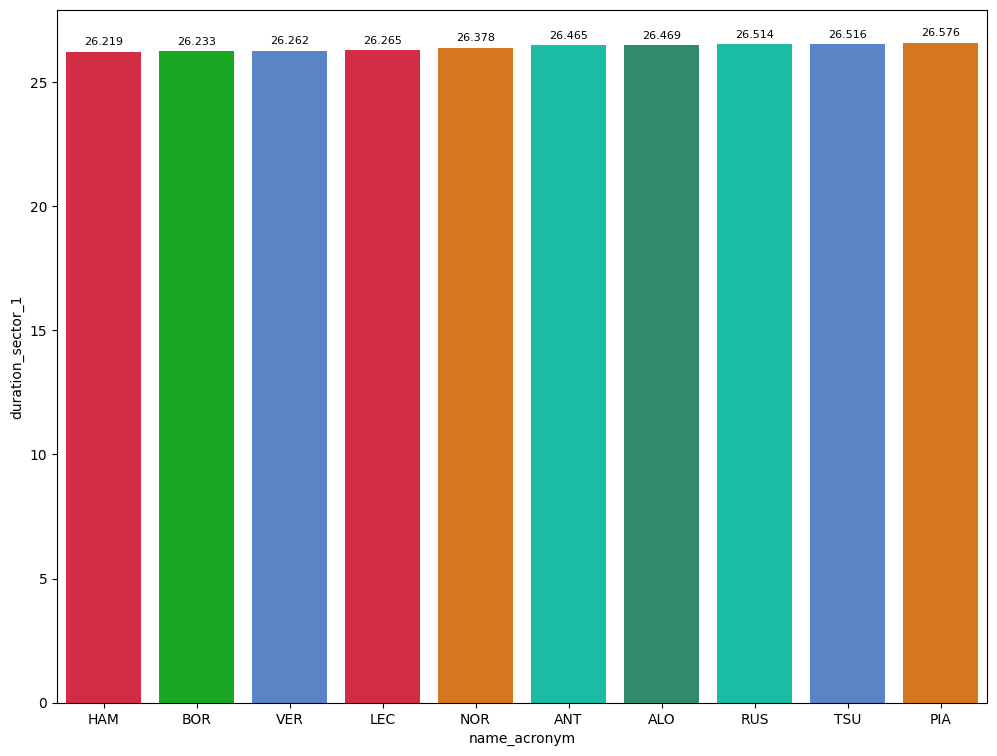

In [44]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

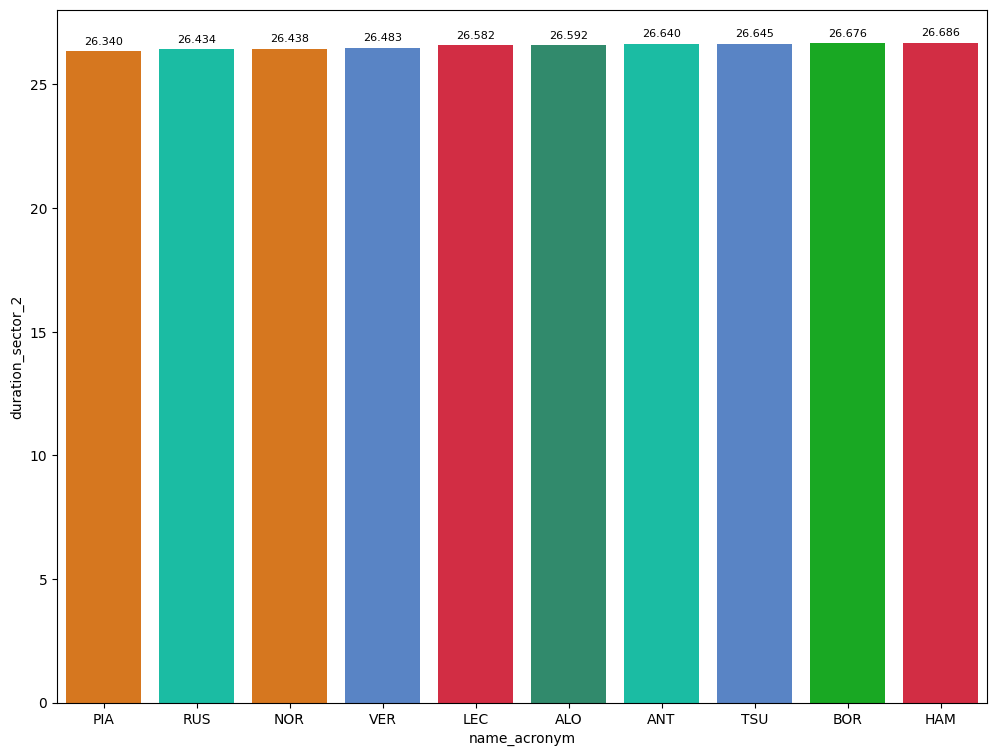

In [45]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

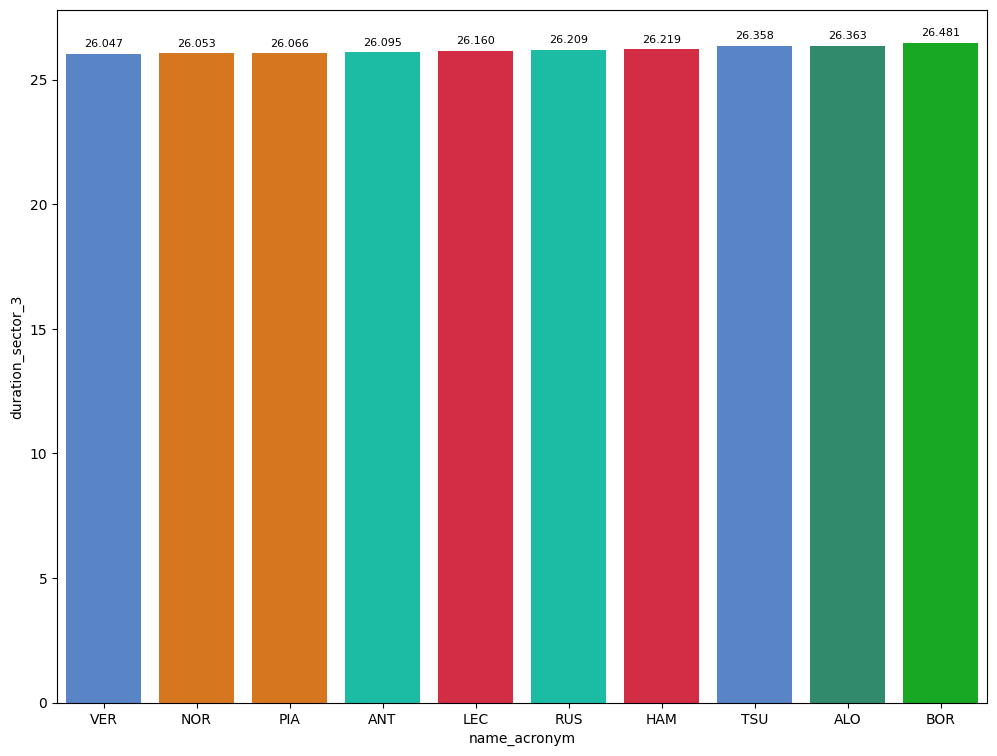

In [46]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

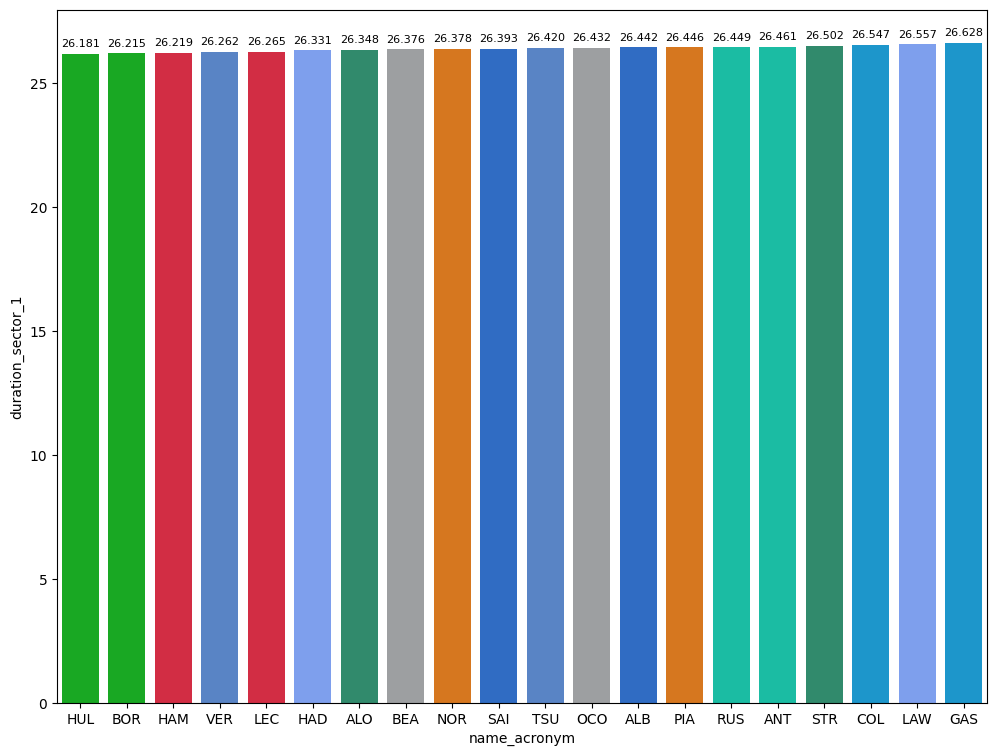

In [47]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

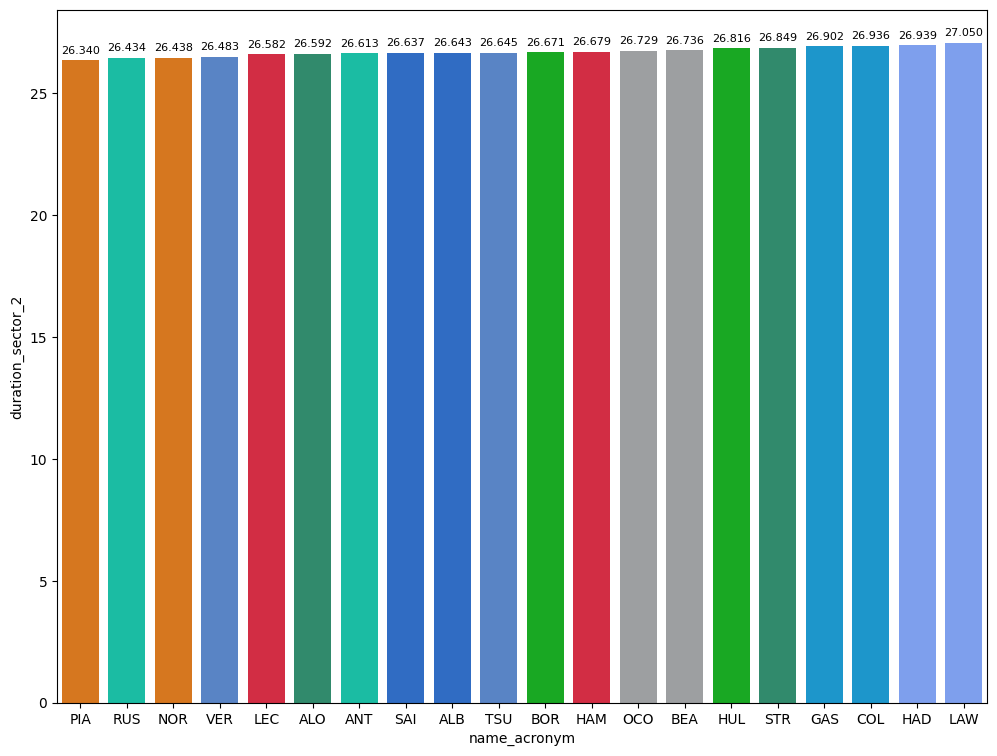

In [48]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

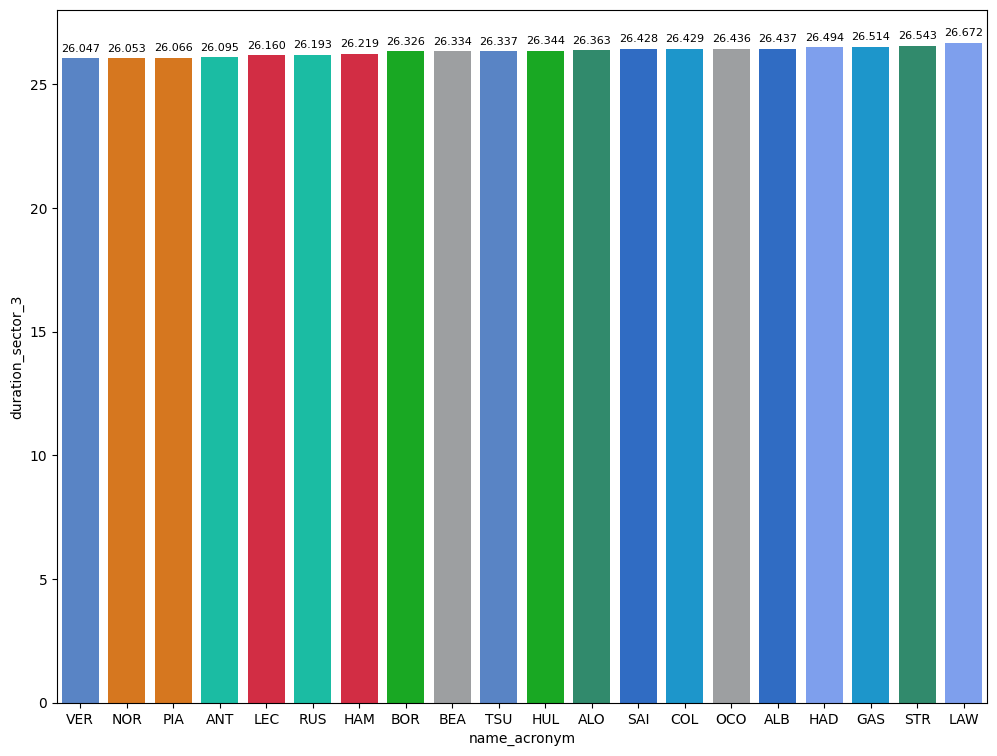

In [49]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

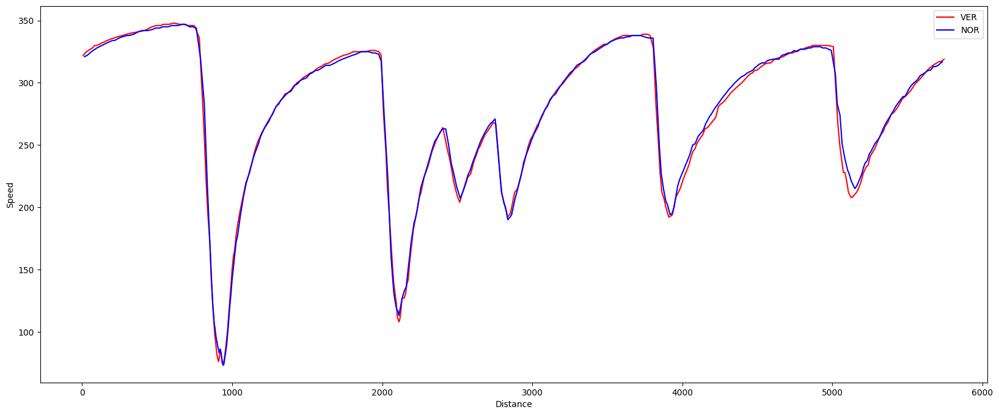

In [50]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

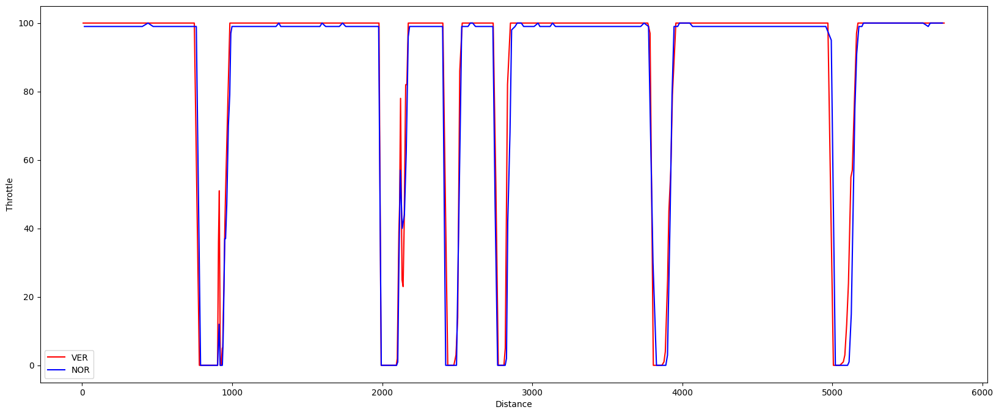

In [51]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

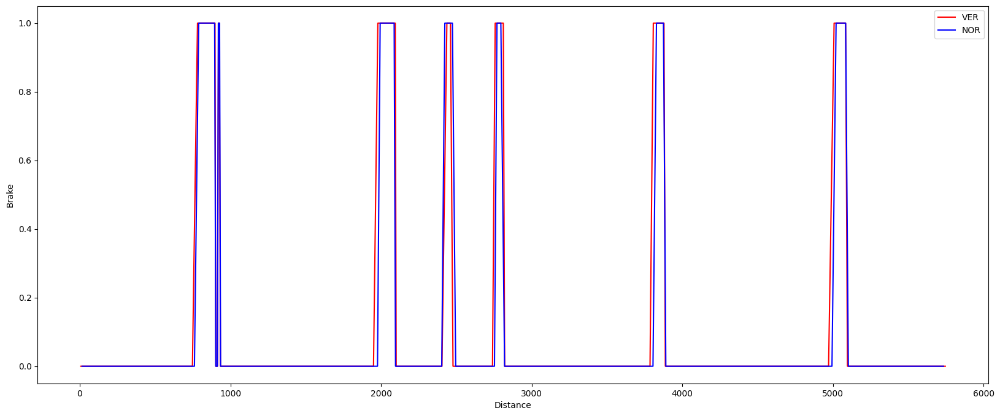

In [52]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

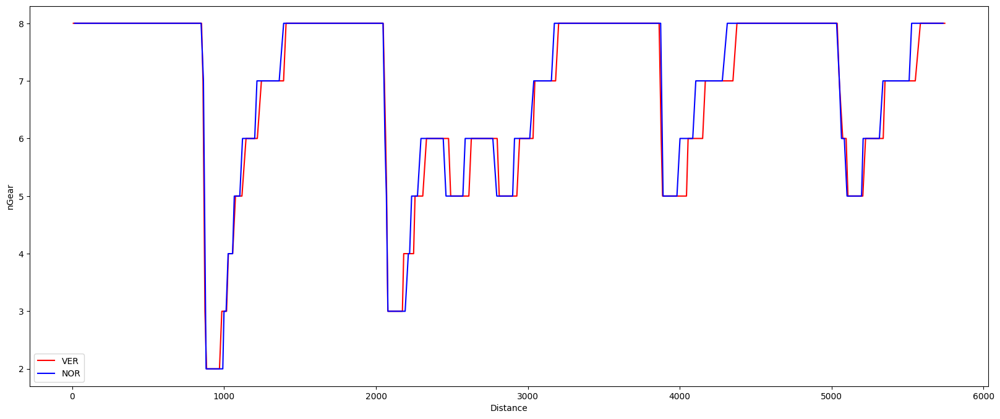

In [53]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [5]:
race = libraryDataF1.obtain_information('laps',session_key=9912)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9912)
drivers = libraryDataF1.obtain_information('drivers',session_key=9912)


In [ ]:
# drivers.loc[drivers['driver_number']==43,'team_name'] = 'Williams'
# drivers.loc[drivers['driver_number']==43,'team_colour'] = '64C4FF'

In [6]:
libraryDataF1.obtain_drivers_colours(drivers)
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [7]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Speed trap

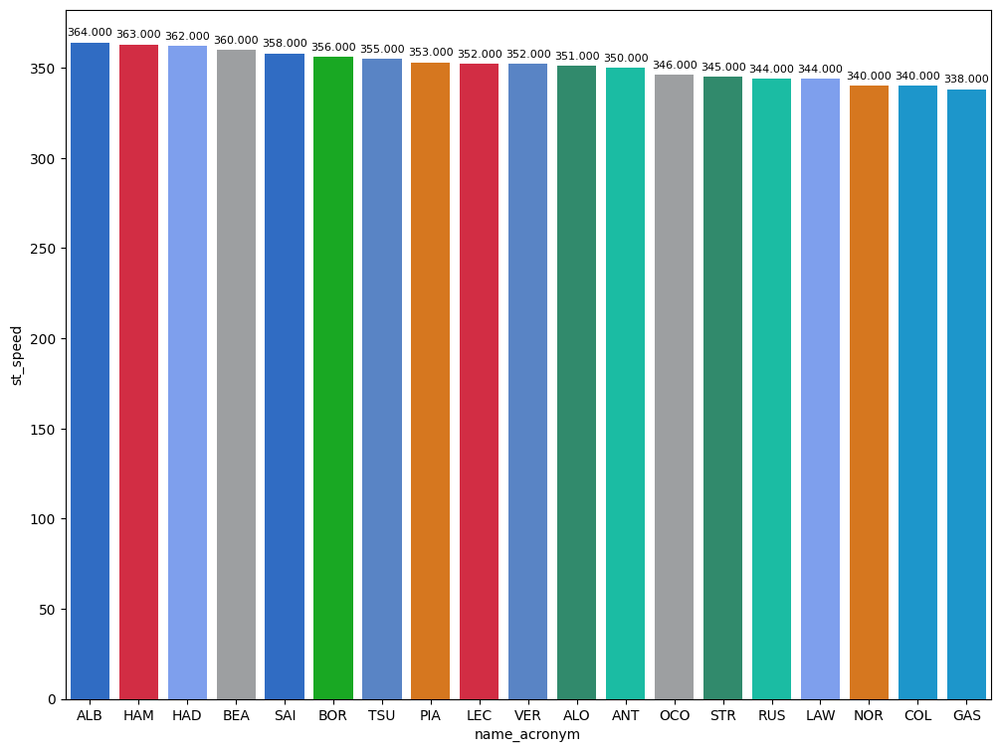

In [9]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax().dropna()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

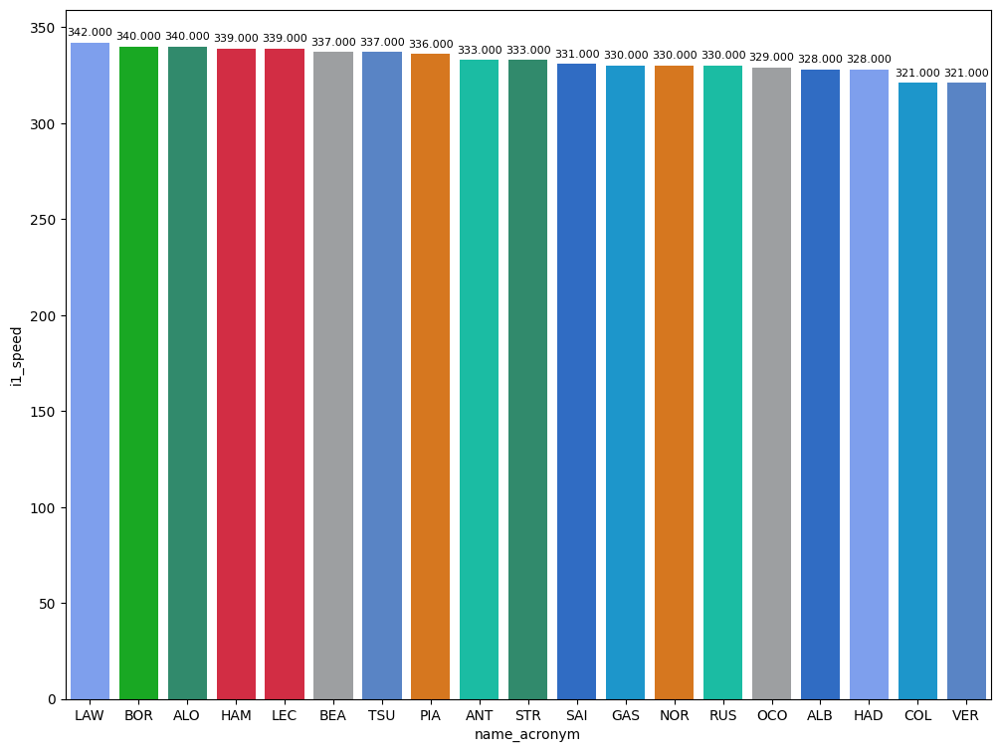

In [10]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax().dropna()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

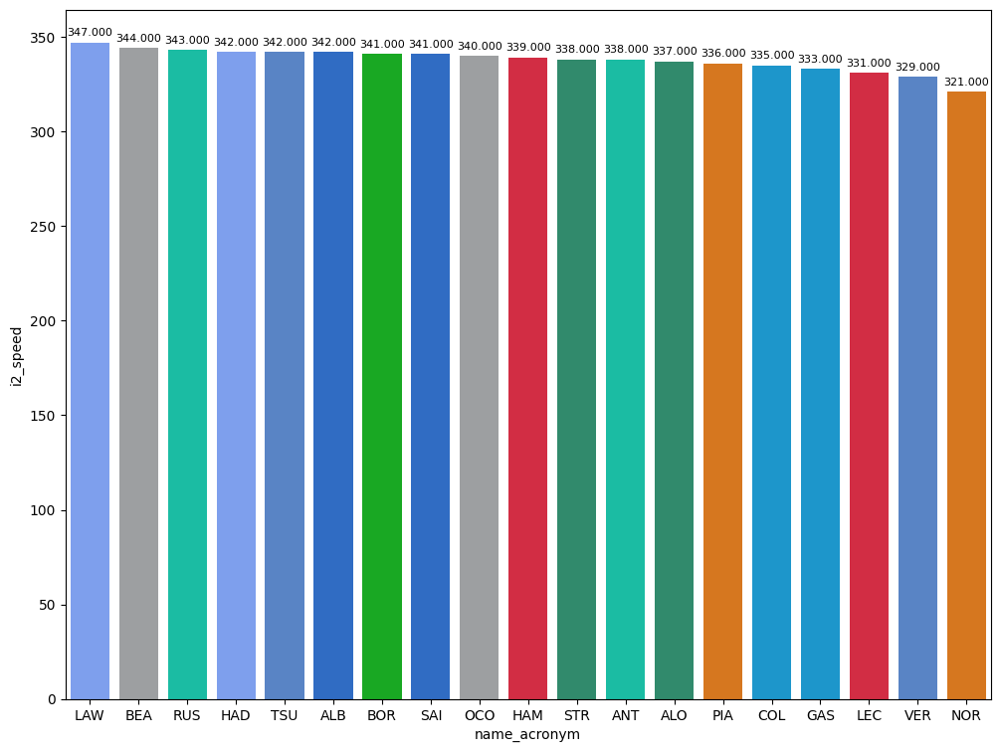

In [11]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax().dropna()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Tyre Strategies

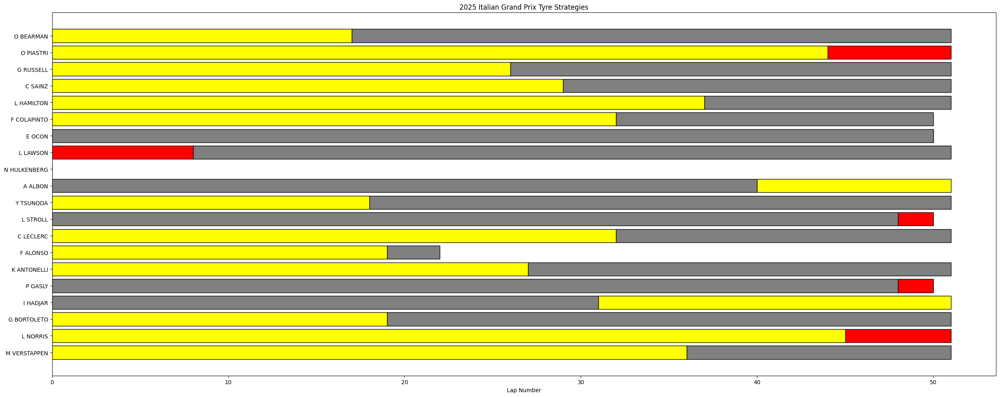

In [12]:
libraryDataF1.race_strategies("2025 Italian Grand Prix Tyre Strategies",drivers,stintInformation)

### Lap Time Distributions

/home/frank/Escritorio/F1_backup/F1_notebooks/F1_25/F1_library/libraryF1dataNotebook.py:576: UserWarning: The palette list has more values (20) than needed (19), which may not be intended.
  sns.violinplot(data=datasetX,


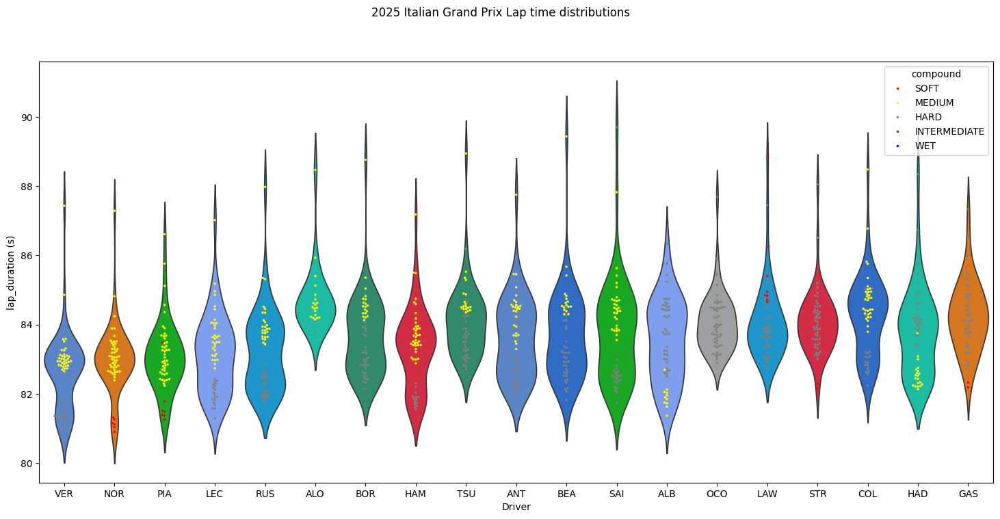

In [14]:
libraryDataF1.lap_time_distributions("2025 Italian Grand Prix Lap time distributions",drivers,jointables.query("lap_duration<90"))

### Mean pace with the different compound used on the session

In [20]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >80 and lap_duration <=86").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,82.495826
HARD,83.356492
MEDIUM,83.765229


### Race pace

In [21]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >80 and lap_duration <=86").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
McLaren,82.945147
Ferrari,83.155722
Red Bull Racing,83.356017
Mercedes,83.433822
Williams,83.562791
Kick Sauber,83.569294
Racing Bulls,83.774413
Haas F1 Team,83.889338
Alpine,84.172293


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1

In [22]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >80 and lap_duration <=86").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Ferrari,27.234806
Williams,27.263055
Mercedes,27.317425
McLaren,27.353250
Kick Sauber,27.381088
Racing Bulls,27.399444
Red Bull Racing,27.412542
Haas F1 Team,27.447887
Aston Martin,27.460306


#### Sector 2

In [23]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >80 and lap_duration <=86").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
McLaren,28.155838
Ferrari,28.374722
Red Bull Racing,28.432000
Mercedes,28.494041
Kick Sauber,28.495441
Williams,28.514758
Haas F1 Team,28.600986
Racing Bulls,28.622476
Aston Martin,28.743408


#### Sector 3

In [24]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False and lap_duration >80 and lap_duration <=86").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,27.436059
Red Bull Racing,27.511475
Ferrari,27.546194
Mercedes,27.622356
Kick Sauber,27.692765
Racing Bulls,27.752492
Williams,27.784978
Alpine,27.816948
Haas F1 Team,27.840465


### Long runs

In [25]:
MINIMUN_SECONDS = 80
MAXIMUM_SECONDS = 86

#### Red Bull Racing

In [26]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1268,9912,1,22,1,19,MEDIUM,0
13,1268,9912,1,1,1,37,MEDIUM,0
21,1268,9912,2,1,38,53,HARD,0
37,1268,9912,2,22,20,53,HARD,0


In [27]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Max VERSTAPPEN,MEDIUM,2025-09-07T13:05:02.302000+00:00,2,28.457,28.843,27.559,84.859
40,Max VERSTAPPEN,MEDIUM,2025-09-07T13:06:27.253000+00:00,3,27.212,28.713,27.587,83.512
59,Max VERSTAPPEN,MEDIUM,2025-09-07T13:07:50.554000+00:00,4,27.375,28.455,27.432,83.262
77,Max VERSTAPPEN,MEDIUM,2025-09-07T13:09:13.857000+00:00,5,27.520,28.427,27.641,83.588
96,Max VERSTAPPEN,MEDIUM,2025-09-07T13:10:37.529000+00:00,6,27.434,28.496,27.646,83.576
115,Max VERSTAPPEN,MEDIUM,2025-09-07T13:12:01.164000+00:00,7,27.458,28.306,27.546,83.310
134,Max VERSTAPPEN,MEDIUM,2025-09-07T13:13:24.486000+00:00,8,27.411,28.318,27.410,83.139
153,Max VERSTAPPEN,MEDIUM,2025-09-07T13:14:47.612000+00:00,9,27.292,28.355,27.454,83.101
172,Max VERSTAPPEN,MEDIUM,2025-09-07T13:16:10.701000+00:00,10,27.369,28.370,27.349,83.088
190,Max VERSTAPPEN,MEDIUM,2025-09-07T13:17:33.768000+00:00,11,27.378,28.300,27.388,83.066


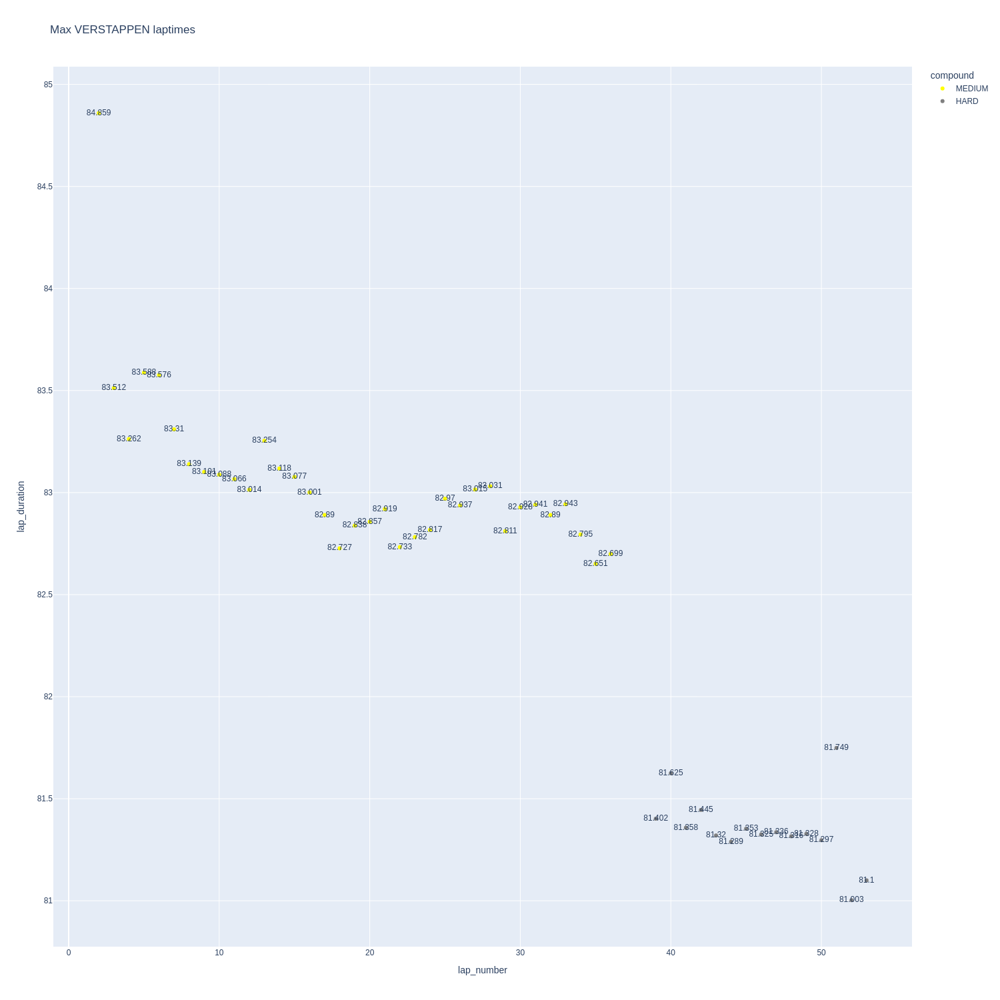

In [28]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

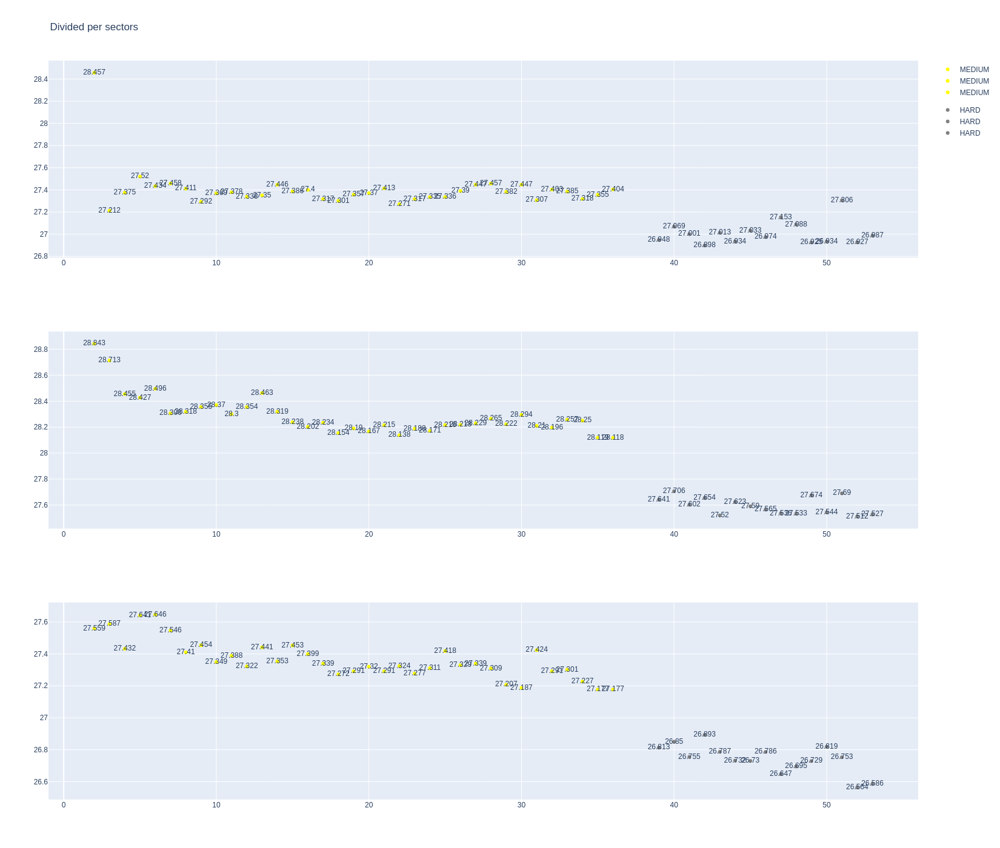

In [29]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [30]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Yuki TSUNODA,MEDIUM,2025-09-07T13:05:06.572000+00:00,2,27.805,29.267,28.277,85.349
47,Yuki TSUNODA,MEDIUM,2025-09-07T13:06:31.849000+00:00,3,27.680,29.478,28.368,85.526
66,Yuki TSUNODA,MEDIUM,2025-09-07T13:07:57.304000+00:00,4,27.607,29.192,28.072,84.871
85,Yuki TSUNODA,MEDIUM,2025-09-07T13:09:22.294000+00:00,5,27.424,29.067,28.103,84.594
104,Yuki TSUNODA,MEDIUM,2025-09-07T13:10:46.879000+00:00,6,27.516,29.248,28.133,84.897
123,Yuki TSUNODA,MEDIUM,2025-09-07T13:12:11.773000+00:00,7,27.626,28.973,28.057,84.656
142,Yuki TSUNODA,MEDIUM,2025-09-07T13:13:36.382000+00:00,8,27.502,28.976,27.975,84.453
161,Yuki TSUNODA,MEDIUM,2025-09-07T13:15:00.911000+00:00,9,27.531,28.874,28.125,84.530
180,Yuki TSUNODA,MEDIUM,2025-09-07T13:16:25.326000+00:00,10,27.599,28.911,27.939,84.449
198,Yuki TSUNODA,MEDIUM,2025-09-07T13:17:49.743000+00:00,11,27.572,28.861,27.981,84.414


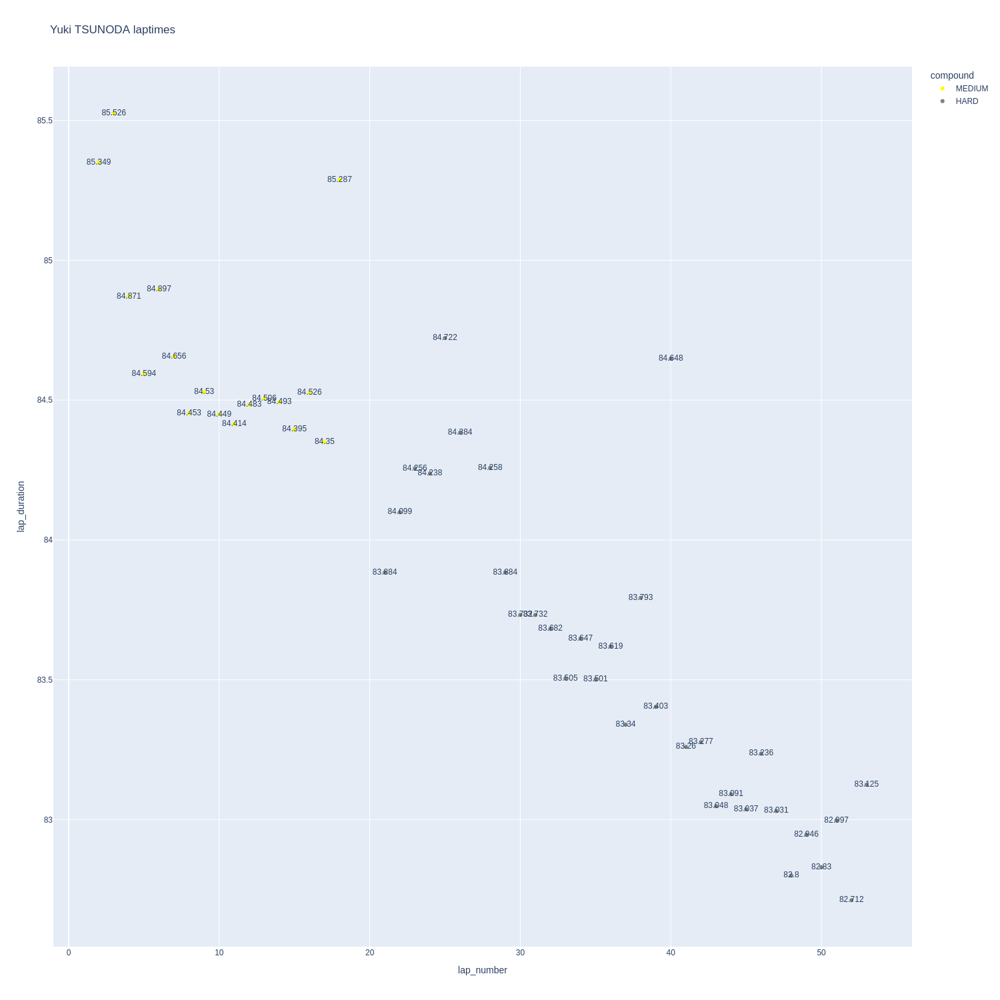

In [31]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

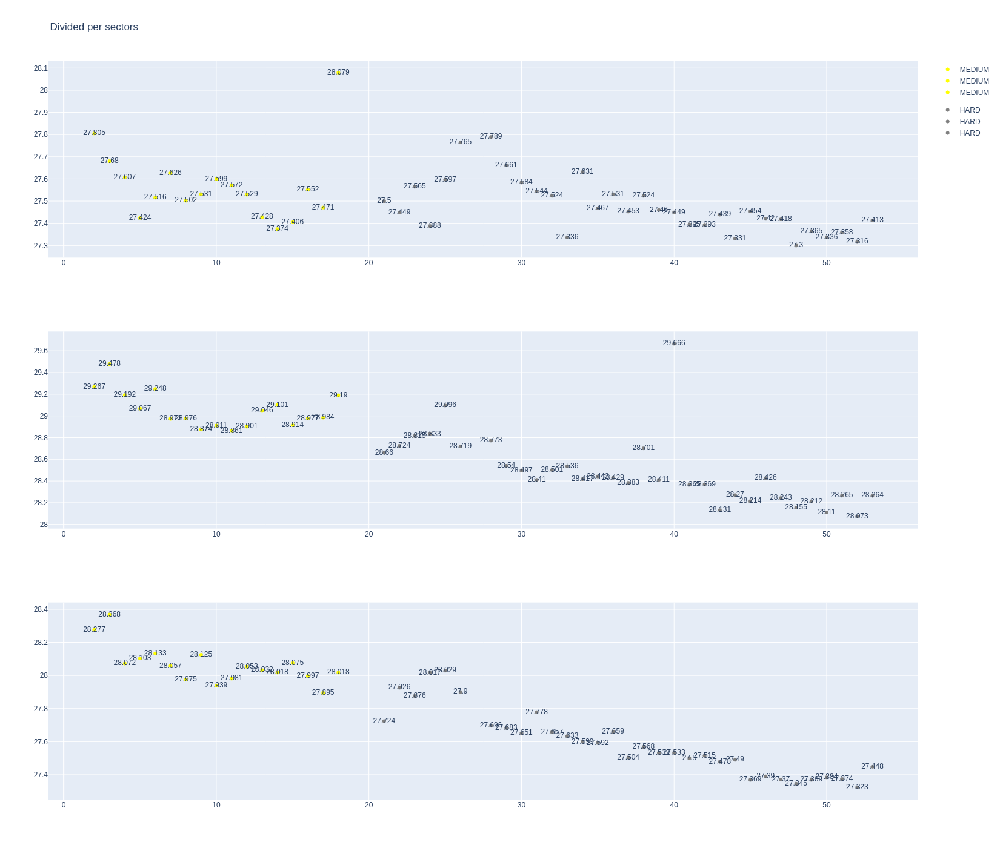

In [32]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [33]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1268,9912,1,16,1,33,MEDIUM,0
14,1268,9912,1,44,1,38,MEDIUM,0
28,1268,9912,2,16,34,53,HARD,0
30,1268,9912,2,44,39,53,HARD,0


In [34]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Charles LECLERC,MEDIUM,2025-09-07T13:05:03.507000+00:00,2,27.470,29.358,28.350,85.178
41,Charles LECLERC,MEDIUM,2025-09-07T13:06:28.646000+00:00,3,27.995,29.025,27.945,84.965
60,Charles LECLERC,MEDIUM,2025-09-07T13:07:53.632000+00:00,4,27.653,29.020,27.852,84.525
79,Charles LECLERC,MEDIUM,2025-09-07T13:09:18.122000+00:00,5,27.531,28.968,27.942,84.441
98,Charles LECLERC,MEDIUM,2025-09-07T13:10:42.665000+00:00,6,27.986,28.969,27.903,84.858
118,Charles LECLERC,MEDIUM,2025-09-07T13:12:07.508000+00:00,7,27.478,28.744,27.752,83.974
137,Charles LECLERC,MEDIUM,2025-09-07T13:13:31.369000+00:00,8,27.508,28.746,27.787,84.041
156,Charles LECLERC,MEDIUM,2025-09-07T13:14:55.437000+00:00,9,27.413,28.811,27.828,84.052
175,Charles LECLERC,MEDIUM,2025-09-07T13:16:19.579000+00:00,10,27.535,28.793,27.812,84.140
193,Charles LECLERC,MEDIUM,2025-09-07T13:17:43.657000+00:00,11,27.383,28.780,27.873,84.036


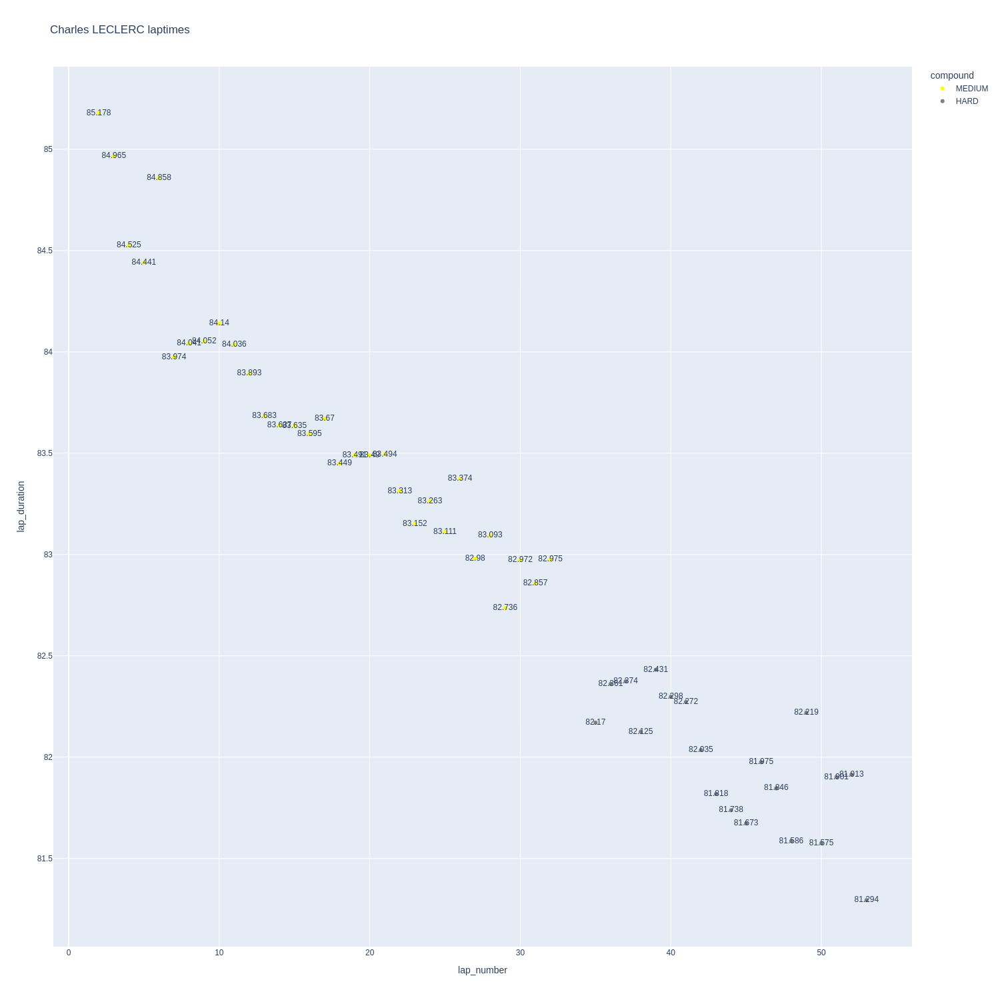

In [35]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

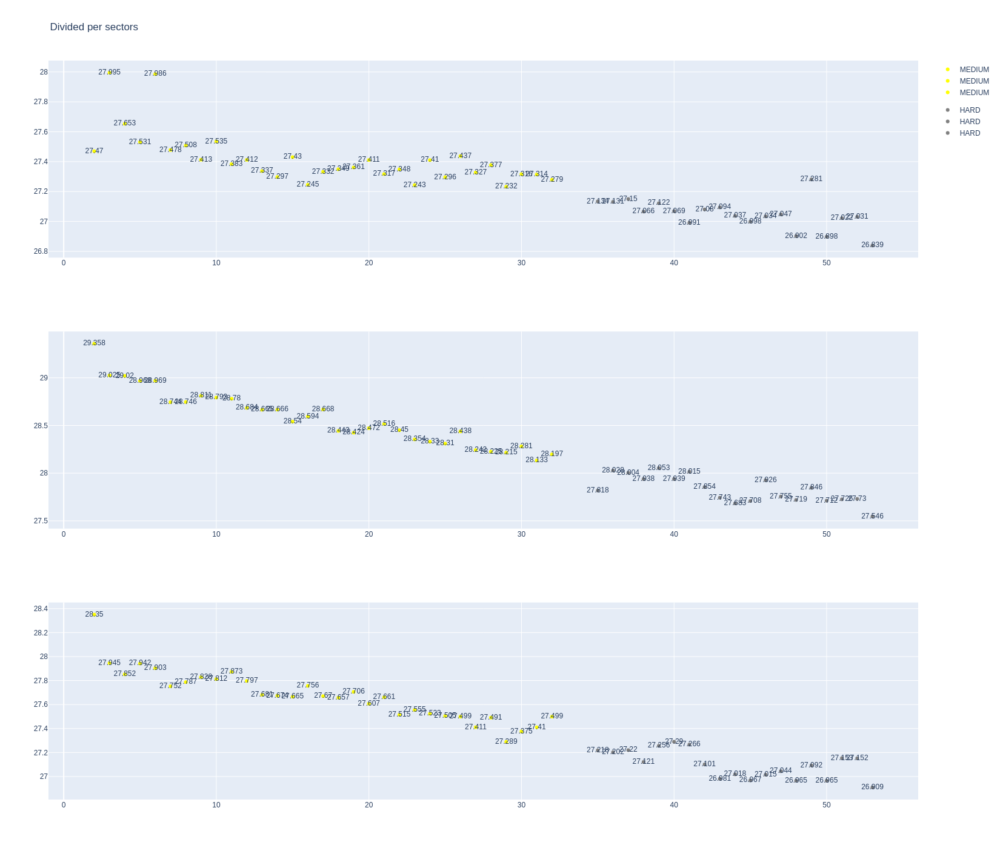

In [36]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [37]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Lewis HAMILTON,MEDIUM,2025-09-07T13:05:05.607000+00:00,2,27.501,29.625,28.376,85.502
46,Lewis HAMILTON,MEDIUM,2025-09-07T13:06:31.318000+00:00,3,27.463,29.717,28.306,85.486
65,Lewis HAMILTON,MEDIUM,2025-09-07T13:07:56.757000+00:00,4,27.415,29.339,27.990,84.744
84,Lewis HAMILTON,MEDIUM,2025-09-07T13:09:21.584000+00:00,5,26.922,29.052,27.968,83.942
102,Lewis HAMILTON,MEDIUM,2025-09-07T13:10:45.277000+00:00,6,27.175,28.891,28.109,84.175
121,Lewis HAMILTON,MEDIUM,2025-09-07T13:12:09.617000+00:00,7,26.956,28.949,28.152,84.057
139,Lewis HAMILTON,MEDIUM,2025-09-07T13:13:33.578000+00:00,8,27.378,29.043,28.225,84.646
158,Lewis HAMILTON,MEDIUM,2025-09-07T13:14:58.271000+00:00,9,27.281,28.742,27.871,83.894
177,Lewis HAMILTON,MEDIUM,2025-09-07T13:16:22.248000+00:00,10,27.292,28.601,27.931,83.824
195,Lewis HAMILTON,MEDIUM,2025-09-07T13:17:46.008000+00:00,11,27.302,28.721,27.853,83.876


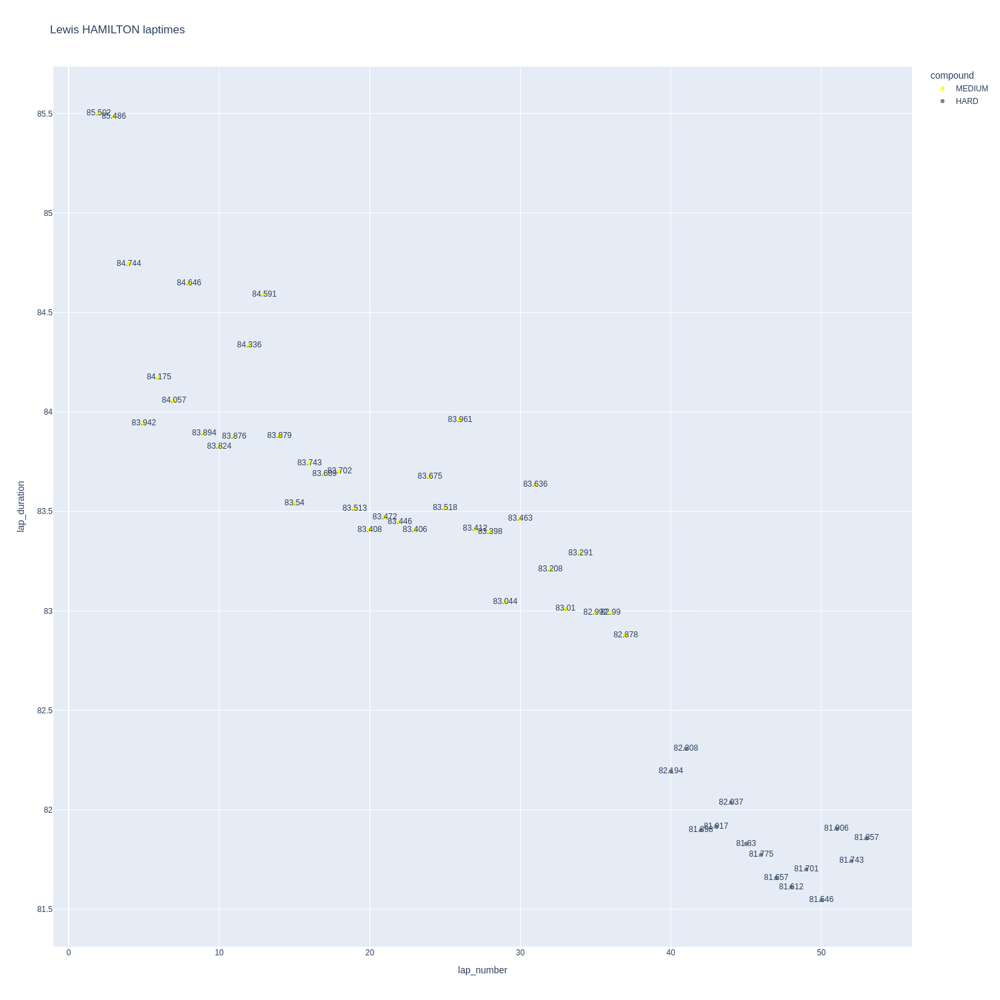

In [38]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

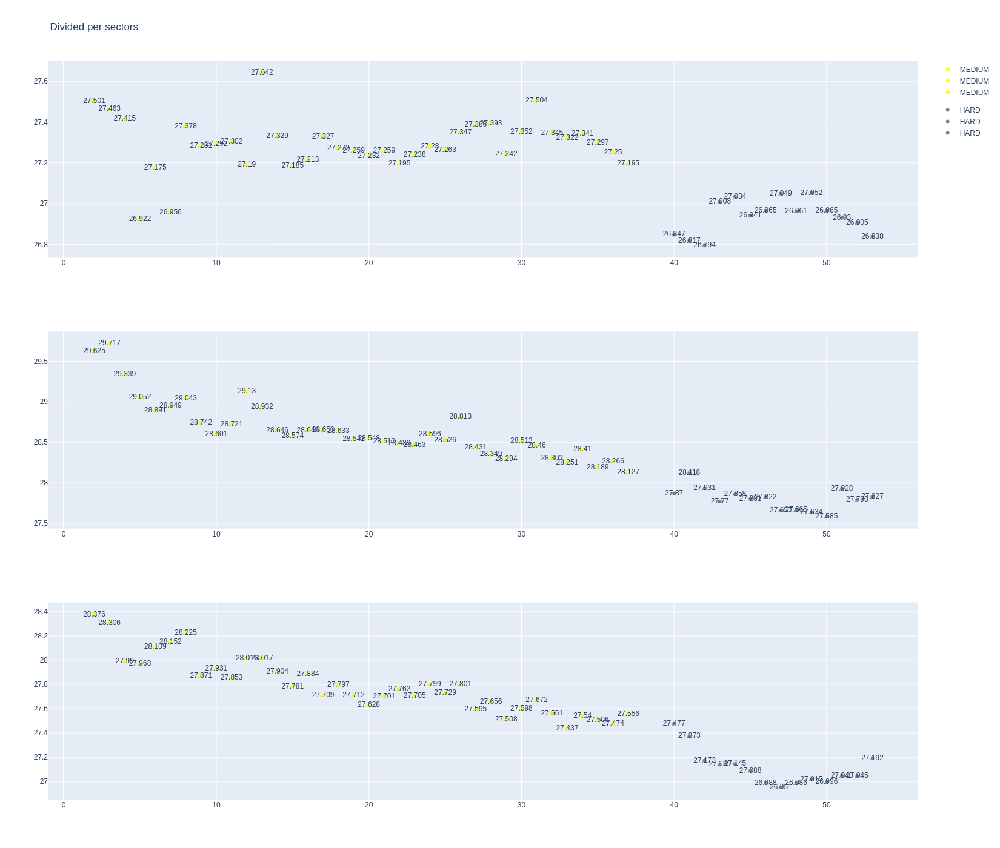

In [39]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [40]:
stintInformation.query('driver_number == 12 or driver_number == 63')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1268,9912,1,63,1,27,MEDIUM,0
8,1268,9912,1,12,1,28,MEDIUM,0
29,1268,9912,2,63,28,53,HARD,0
32,1268,9912,2,12,29,53,HARD,0


In [41]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Kimi ANTONELLI,MEDIUM,2025-09-07T13:05:06.884000+00:00,2,27.625,29.637,28.191,85.453
48,Kimi ANTONELLI,MEDIUM,2025-09-07T13:06:32.381000+00:00,3,27.462,29.648,28.351,85.461
67,Kimi ANTONELLI,MEDIUM,2025-09-07T13:07:57.725000+00:00,4,27.359,29.466,28.016,84.841
86,Kimi ANTONELLI,MEDIUM,2025-09-07T13:09:22.763000+00:00,5,27.253,29.309,28.088,84.650
105,Kimi ANTONELLI,MEDIUM,2025-09-07T13:10:47.357000+00:00,6,27.114,29.695,28.271,85.080
124,Kimi ANTONELLI,MEDIUM,2025-09-07T13:12:12.531000+00:00,7,27.509,29.028,27.964,84.501
143,Kimi ANTONELLI,MEDIUM,2025-09-07T13:13:36.812000+00:00,8,27.352,29.080,27.966,84.398
162,Kimi ANTONELLI,MEDIUM,2025-09-07T13:15:01.405000+00:00,9,27.380,29.168,28.018,84.566
181,Kimi ANTONELLI,MEDIUM,2025-09-07T13:16:25.826000+00:00,10,27.321,29.201,28.049,84.571
199,Kimi ANTONELLI,MEDIUM,2025-09-07T13:17:50.399000+00:00,11,27.407,29.110,27.993,84.510


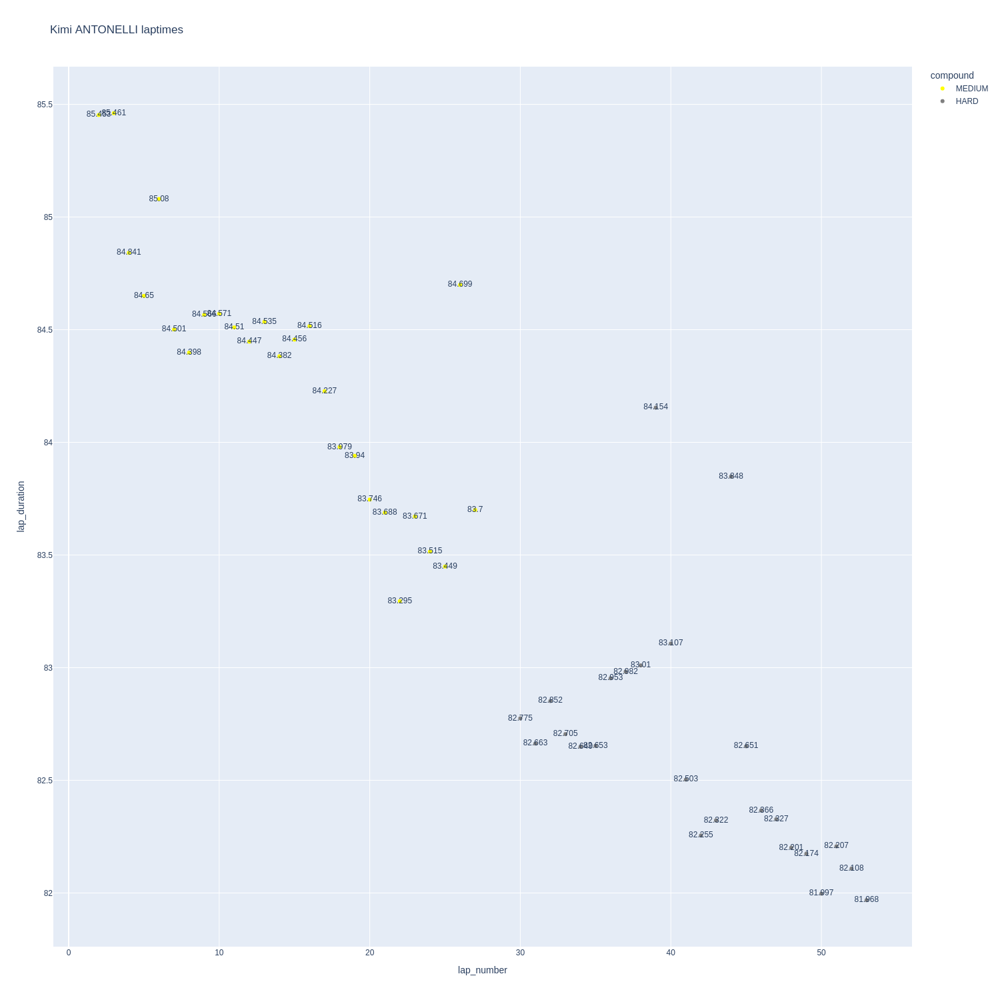

In [42]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

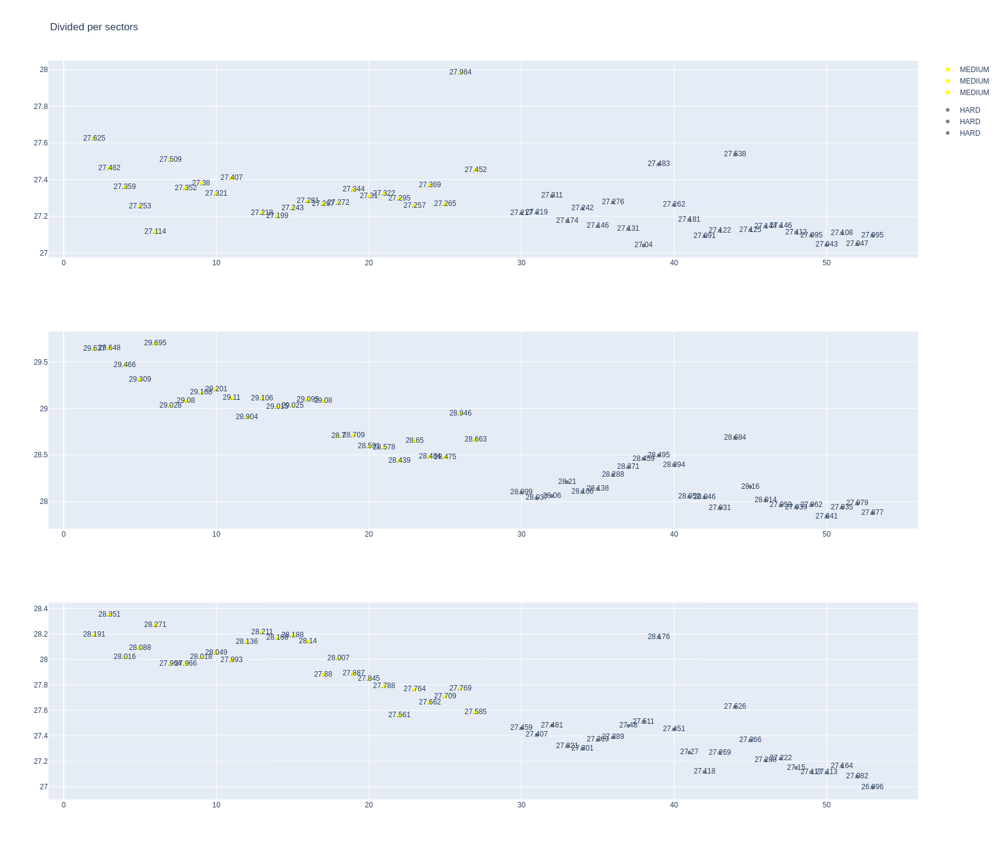

In [43]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [44]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,George RUSSELL,MEDIUM,2025-09-07T13:05:04.066000+00:00,2,27.677,29.339,28.293,85.309
43,George RUSSELL,MEDIUM,2025-09-07T13:06:29.443000+00:00,3,28.305,29.054,27.987,85.346
62,George RUSSELL,MEDIUM,2025-09-07T13:07:54.757000+00:00,4,27.405,29.093,28.015,84.513
81,George RUSSELL,MEDIUM,2025-09-07T13:09:19.201000+00:00,5,27.428,28.862,28.054,84.344
100,George RUSSELL,MEDIUM,2025-09-07T13:10:43.620000+00:00,6,27.492,28.842,28.123,84.457
119,George RUSSELL,MEDIUM,2025-09-07T13:12:07.976000+00:00,7,27.355,28.744,27.841,83.940
138,George RUSSELL,MEDIUM,2025-09-07T13:13:32.058000+00:00,8,27.538,28.622,27.720,83.880
157,George RUSSELL,MEDIUM,2025-09-07T13:14:55.890000+00:00,9,27.399,28.738,27.931,84.068
176,George RUSSELL,MEDIUM,2025-09-07T13:16:20.001000+00:00,10,27.309,29.084,27.954,84.347
194,George RUSSELL,MEDIUM,2025-09-07T13:17:44.258000+00:00,11,27.537,28.760,27.827,84.124


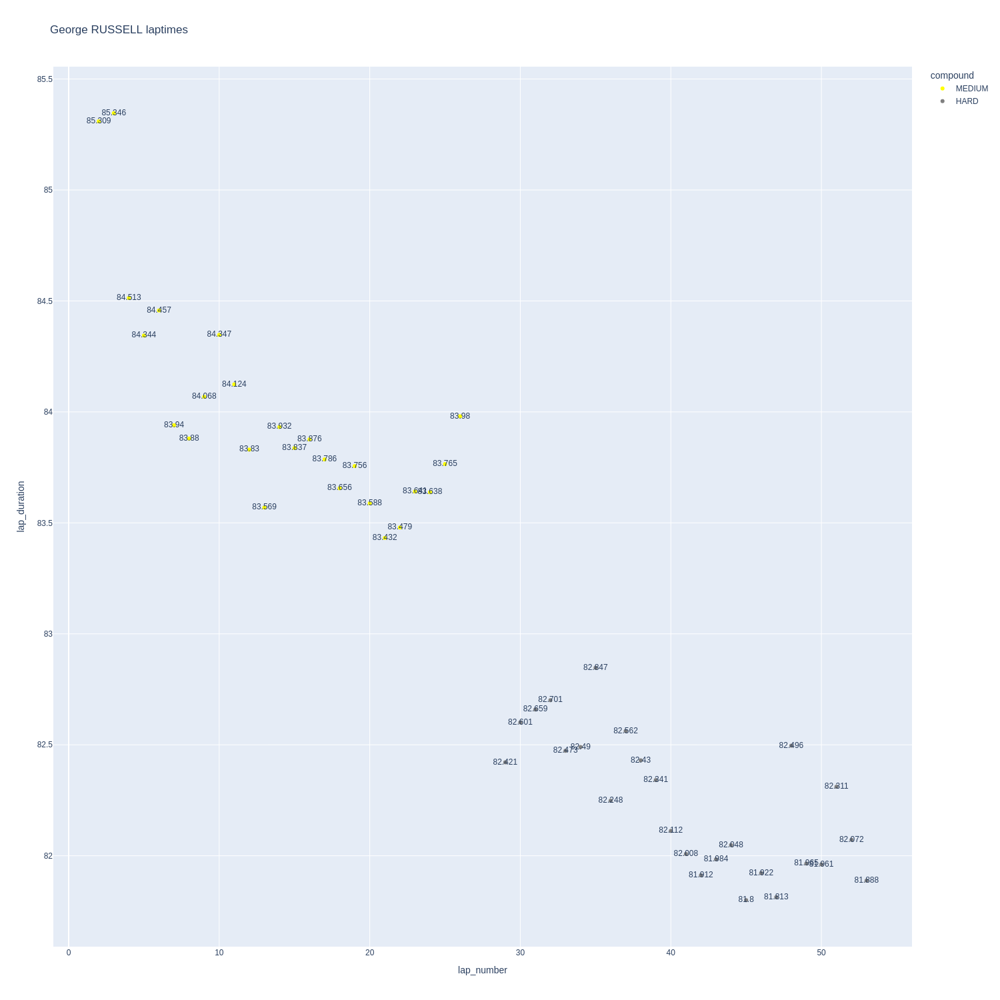

In [45]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

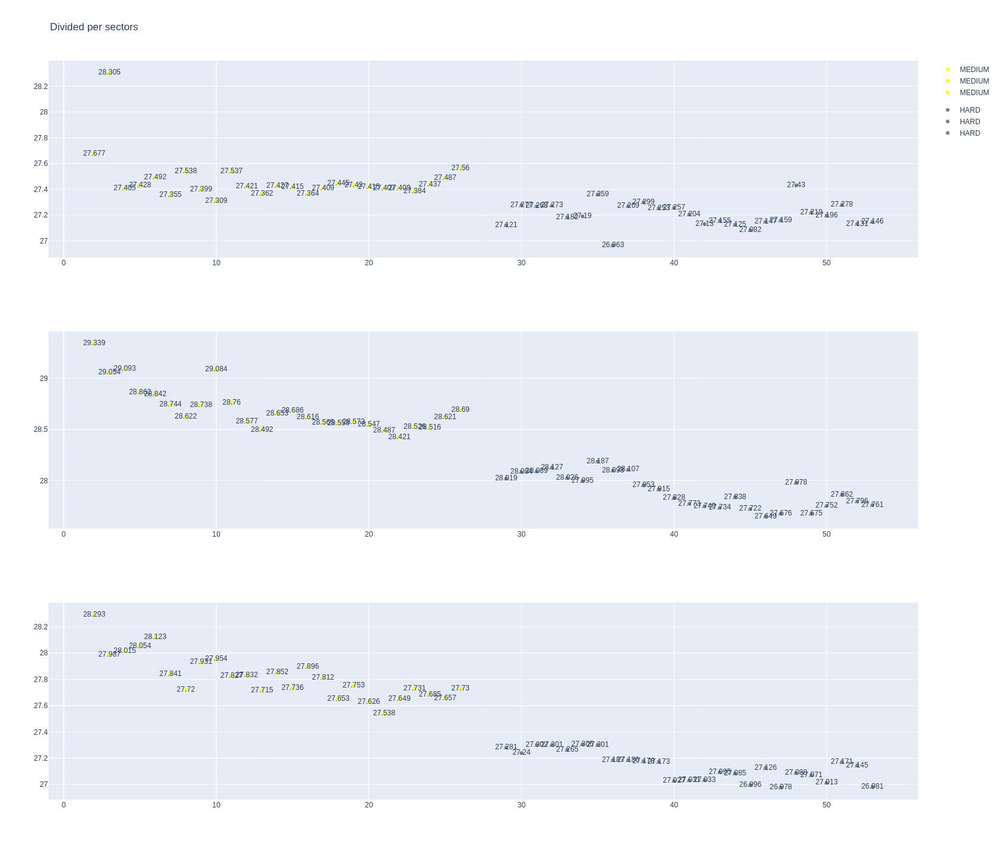

In [46]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [47]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1268,9912,1,81,1,45,MEDIUM,0
17,1268,9912,1,4,1,46,MEDIUM,0
26,1268,9912,2,4,47,53,SOFT,2
27,1268,9912,2,81,46,53,SOFT,3


In [48]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Lando NORRIS,MEDIUM,2025-09-07T13:05:02.727000+00:00,2,27.675,28.557,27.657,83.889
39,Lando NORRIS,MEDIUM,2025-09-07T13:06:26.418000+00:00,3,27.624,28.430,27.620,83.674
58,Lando NORRIS,MEDIUM,2025-09-07T13:07:50.319000+00:00,4,28.346,28.762,27.711,84.819
78,Lando NORRIS,MEDIUM,2025-09-07T13:09:14.966000+00:00,5,27.645,28.659,27.934,84.238
97,Lando NORRIS,MEDIUM,2025-09-07T13:10:39.295000+00:00,6,27.407,28.595,27.885,83.887
116,Lando NORRIS,MEDIUM,2025-09-07T13:12:03.164000+00:00,7,27.400,28.426,27.712,83.538
135,Lando NORRIS,MEDIUM,2025-09-07T13:13:26.720000+00:00,8,27.424,28.333,27.761,83.518
154,Lando NORRIS,MEDIUM,2025-09-07T13:14:50.258000+00:00,9,27.397,28.356,27.724,83.477
173,Lando NORRIS,MEDIUM,2025-09-07T13:16:13.731000+00:00,10,27.420,28.351,27.645,83.416
191,Lando NORRIS,MEDIUM,2025-09-07T13:17:37.128000+00:00,11,27.415,28.315,27.630,83.360


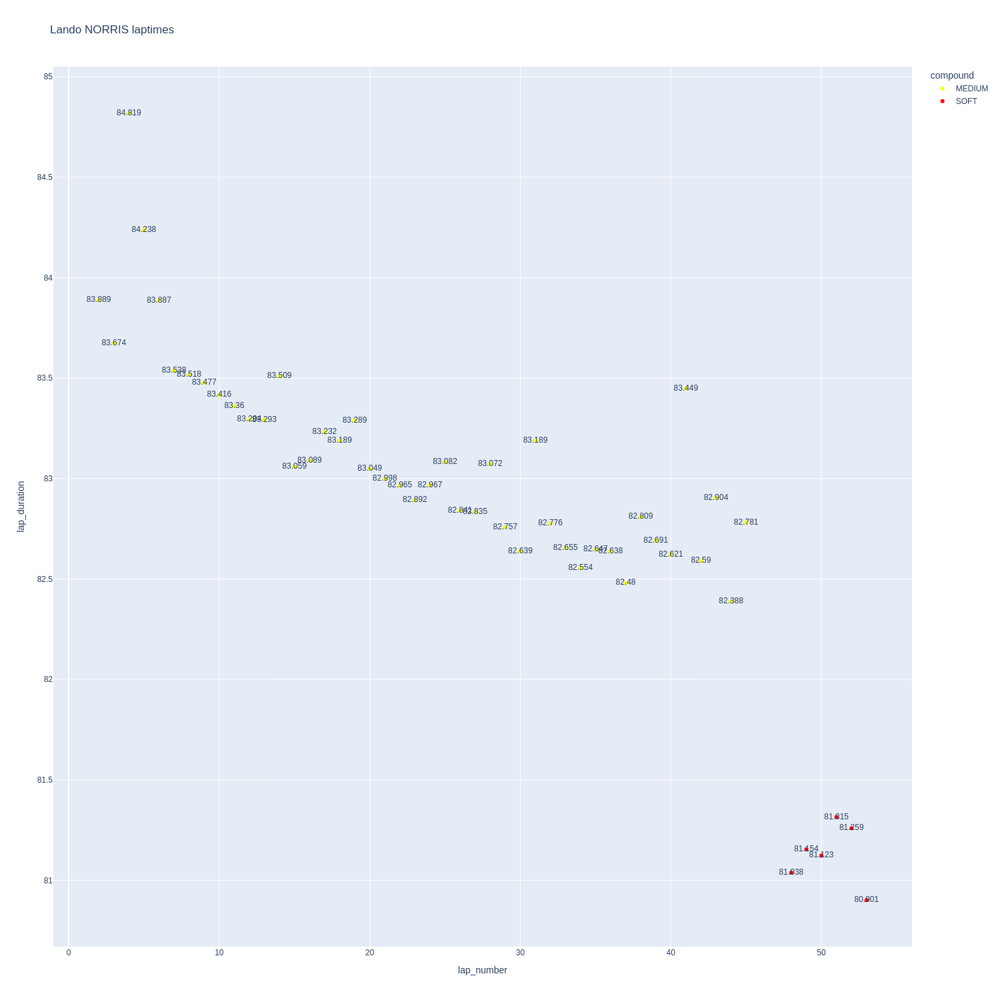

In [49]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

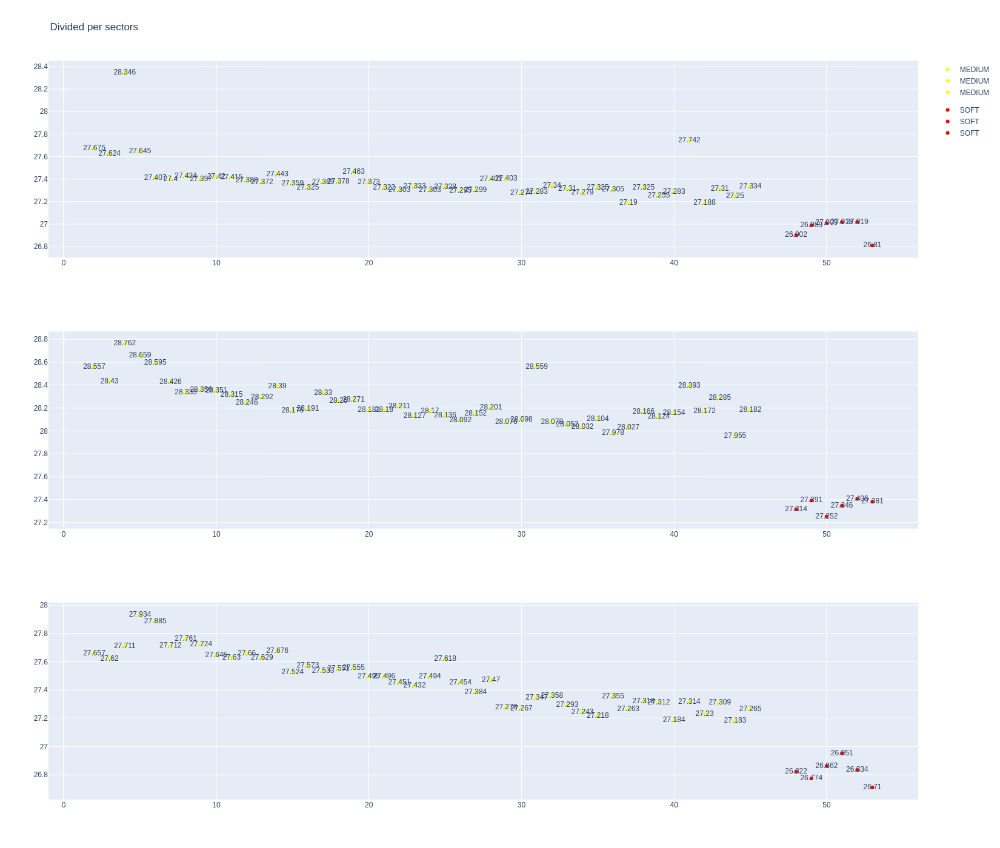

In [50]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [51]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Oscar PIASTRI,MEDIUM,2025-09-07T13:05:03.127000+00:00,2,27.817,29.686,28.256,85.759
42,Oscar PIASTRI,MEDIUM,2025-09-07T13:06:28.849000+00:00,3,28.424,28.647,28.046,85.117
61,Oscar PIASTRI,MEDIUM,2025-09-07T13:07:54.069000+00:00,4,27.516,29.120,27.931,84.567
80,Oscar PIASTRI,MEDIUM,2025-09-07T13:09:18.607000+00:00,5,27.390,28.967,28.001,84.358
99,Oscar PIASTRI,MEDIUM,2025-09-07T13:10:42.936000+00:00,6,27.322,28.515,27.842,83.679
117,Oscar PIASTRI,MEDIUM,2025-09-07T13:12:06.617000+00:00,7,27.487,28.495,27.756,83.738
136,Oscar PIASTRI,MEDIUM,2025-09-07T13:13:30.405000+00:00,8,27.442,28.551,27.956,83.949
155,Oscar PIASTRI,MEDIUM,2025-09-07T13:14:54.446000+00:00,9,27.470,28.473,27.742,83.685
174,Oscar PIASTRI,MEDIUM,2025-09-07T13:16:18.032000+00:00,10,27.430,28.274,27.757,83.461
192,Oscar PIASTRI,MEDIUM,2025-09-07T13:17:41.518000+00:00,11,27.380,28.518,27.999,83.897


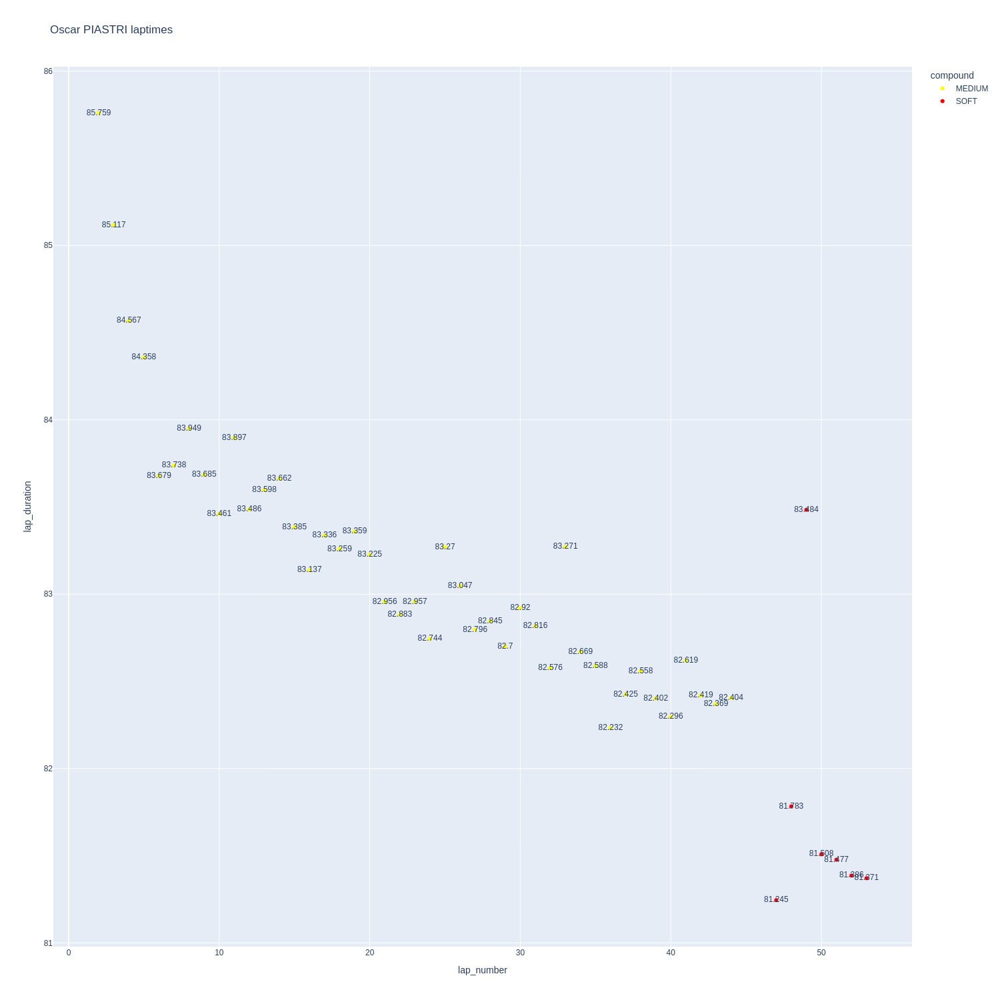

In [52]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

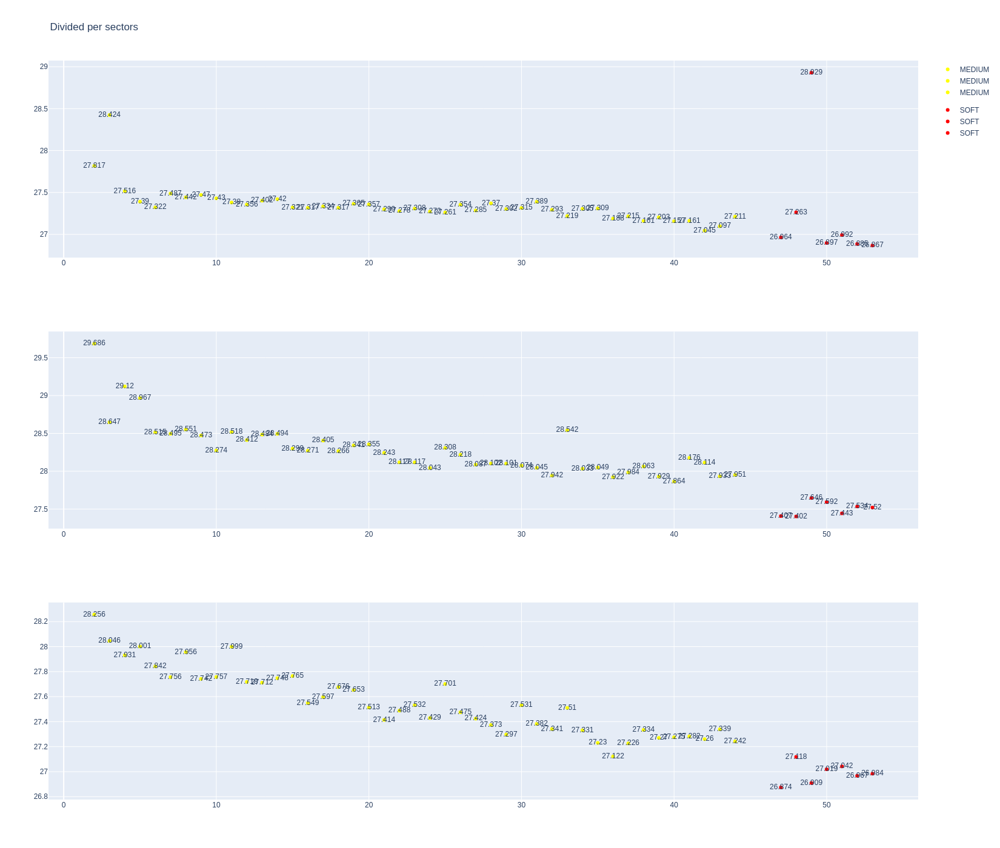

In [53]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [54]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1268,9912,1,14,1,20,MEDIUM,1
6,1268,9912,2,14,21,24,HARD,1
18,1268,9912,1,18,1,49,HARD,1
25,1268,9912,2,18,50,52,SOFT,0


In [55]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Fernando ALONSO,MEDIUM,2025-09-07T13:05:04.801000+00:00,2,28.102,29.350,28.474,85.926
45,Fernando ALONSO,MEDIUM,2025-09-07T13:06:30.896000+00:00,3,27.618,29.576,28.209,85.403
64,Fernando ALONSO,MEDIUM,2025-09-07T13:07:56.241000+00:00,4,27.621,28.963,28.277,84.861
83,Fernando ALONSO,MEDIUM,2025-09-07T13:09:21.132000+00:00,5,27.854,29.048,28.227,85.129
103,Fernando ALONSO,MEDIUM,2025-09-07T13:10:46.155000+00:00,6,27.317,28.657,28.222,84.196
122,Fernando ALONSO,MEDIUM,2025-09-07T13:12:10.336000+00:00,7,27.303,29.015,28.305,84.623
141,Fernando ALONSO,MEDIUM,2025-09-07T13:13:34.943000+00:00,8,27.400,29.022,28.302,84.724
160,Fernando ALONSO,MEDIUM,2025-09-07T13:14:59.737000+00:00,9,27.287,28.913,28.285,84.485
179,Fernando ALONSO,MEDIUM,2025-09-07T13:16:24.279000+00:00,10,27.472,28.902,28.132,84.506
197,Fernando ALONSO,MEDIUM,2025-09-07T13:17:48.696000+00:00,11,27.504,28.795,28.161,84.460


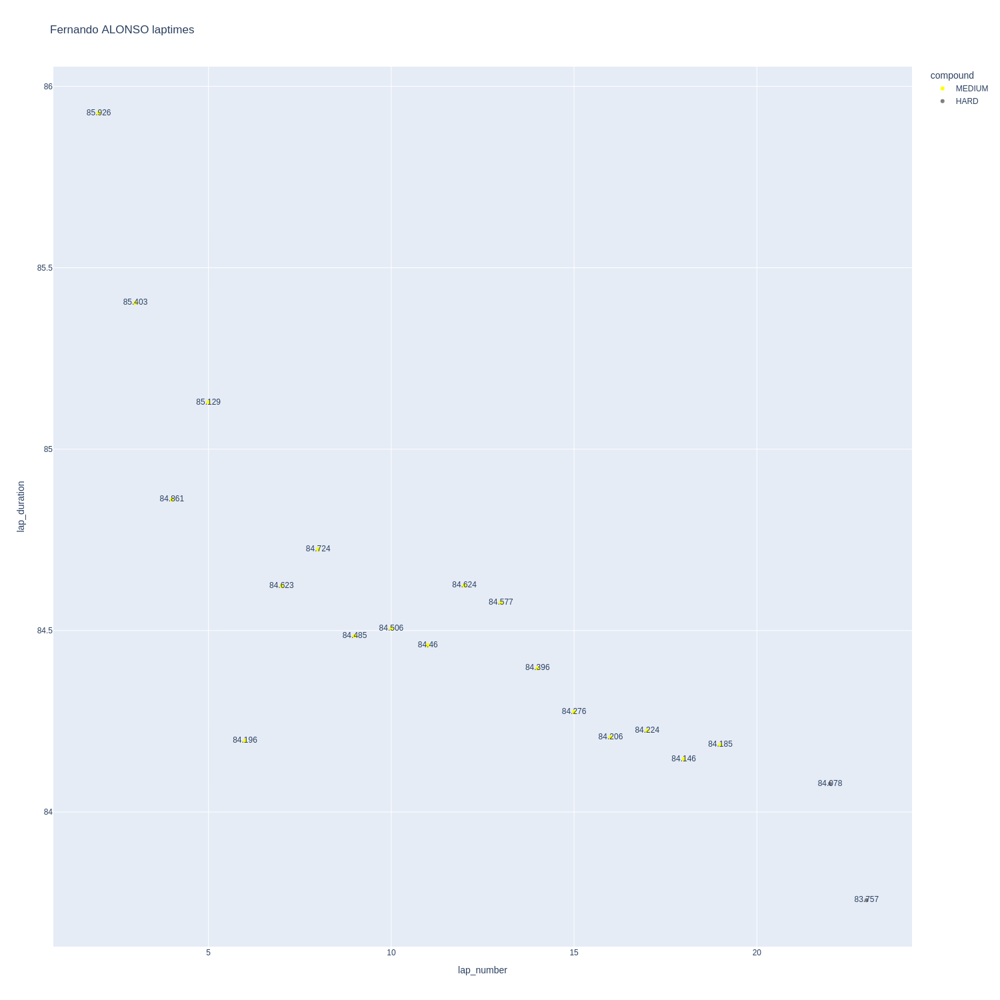

In [56]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

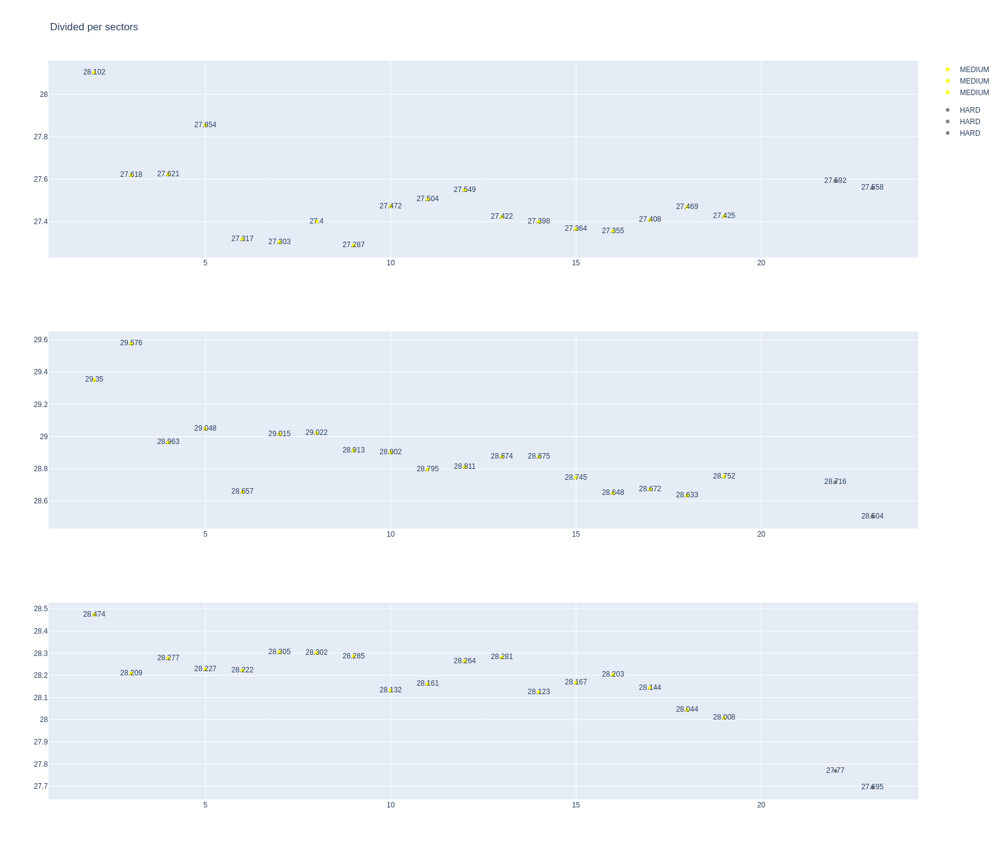

In [57]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [58]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
54,Lance STROLL,HARD,2025-09-07T13:06:35.693000+00:00,3,27.603,29.126,28.335,85.064
73,Lance STROLL,HARD,2025-09-07T13:08:00.804000+00:00,4,27.515,29.373,28.321,85.209
92,Lance STROLL,HARD,2025-09-07T13:09:25.878000+00:00,5,27.560,29.143,28.212,84.915
111,Lance STROLL,HARD,2025-09-07T13:10:50.851000+00:00,6,27.320,29.081,28.412,84.813
130,Lance STROLL,HARD,2025-09-07T13:12:15.673000+00:00,7,27.479,28.959,28.240,84.678
149,Lance STROLL,HARD,2025-09-07T13:13:40.281000+00:00,8,27.566,29.007,28.262,84.835
168,Lance STROLL,HARD,2025-09-07T13:15:05.148000+00:00,9,27.365,28.874,28.302,84.541
186,Lance STROLL,HARD,2025-09-07T13:16:29.561000+00:00,10,27.347,28.774,28.088,84.209
204,Lance STROLL,HARD,2025-09-07T13:17:53.883000+00:00,11,27.401,28.787,28.174,84.362
223,Lance STROLL,HARD,2025-09-07T13:19:18.337000+00:00,12,27.318,29.015,28.195,84.528


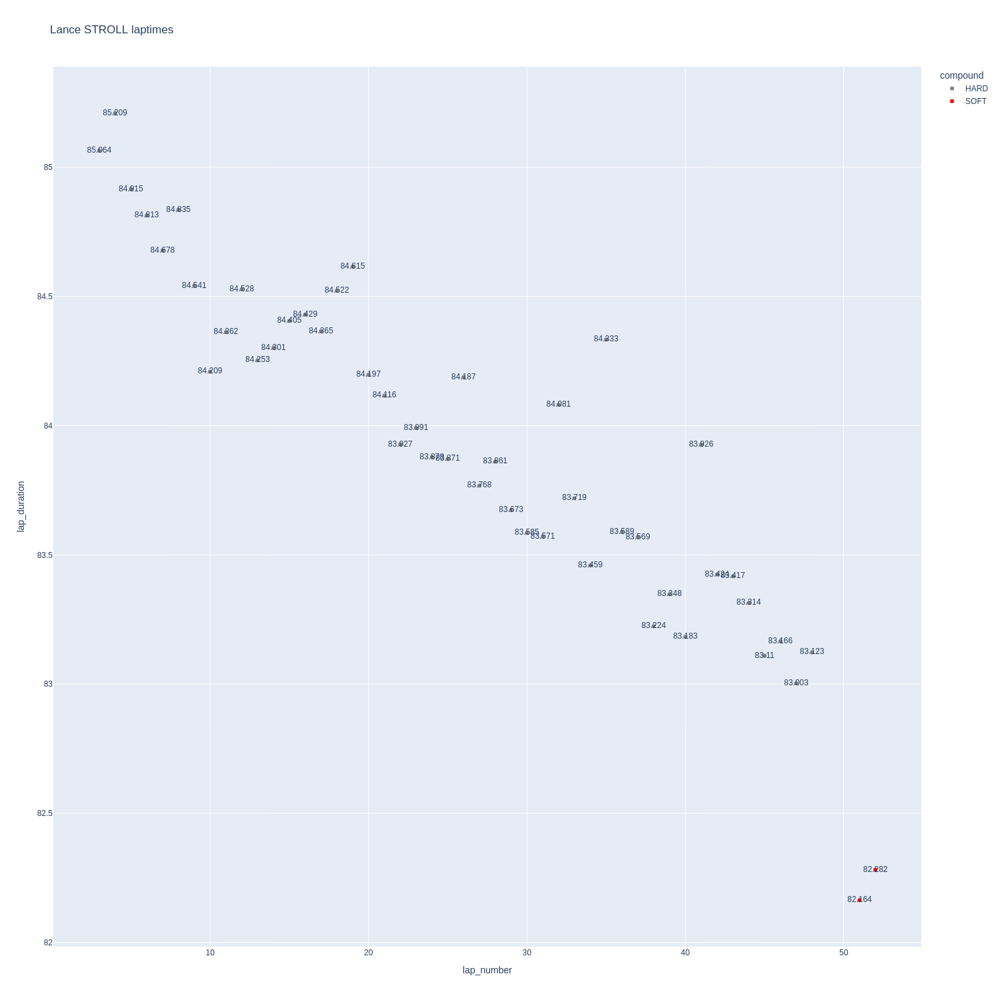

In [59]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

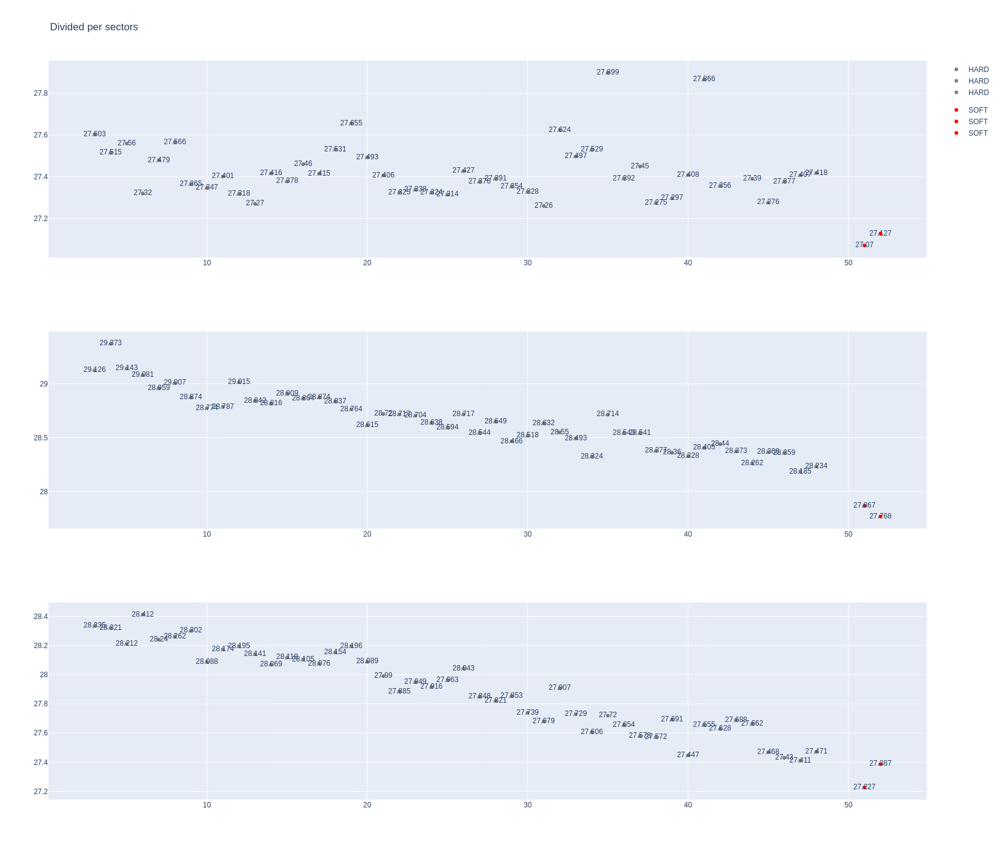

In [60]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [61]:
stintInformation.query('driver_number == 6 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1268,9912,1,30,1,9,SOFT,0
10,1268,9912,1,6,1,32,HARD,1
34,1268,9912,2,6,33,53,MEDIUM,0
38,1268,9912,2,30,10,53,HARD,0


In [62]:
data = libraryDataF1.getinfolongruns(jointables,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Liam LAWSON,SOFT,2025-09-07T13:06:35.037000+00:00,3,27.394,29.194,28.354,84.942
72,Liam LAWSON,SOFT,2025-09-07T13:07:59.913000+00:00,4,27.594,29.348,28.462,85.404
91,Liam LAWSON,SOFT,2025-09-07T13:09:25.328000+00:00,5,27.397,29.118,28.313,84.828
110,Liam LAWSON,SOFT,2025-09-07T13:10:50.245000+00:00,6,27.329,29.095,28.232,84.656
129,Liam LAWSON,SOFT,2025-09-07T13:12:14.923000+00:00,7,27.429,29.162,28.259,84.850
148,Liam LAWSON,SOFT,2025-09-07T13:13:39.629000+00:00,8,27.534,29.056,28.135,84.725
208,Liam LAWSON,HARD,2025-09-07T13:18:18.399000+00:00,11,27.500,28.517,27.862,83.879
227,Liam LAWSON,HARD,2025-09-07T13:19:42.265000+00:00,12,27.524,28.814,27.876,84.214
246,Liam LAWSON,HARD,2025-09-07T13:21:06.414000+00:00,13,27.478,28.597,27.875,83.950
265,Liam LAWSON,HARD,2025-09-07T13:22:30.414000+00:00,14,27.438,28.591,27.820,83.849


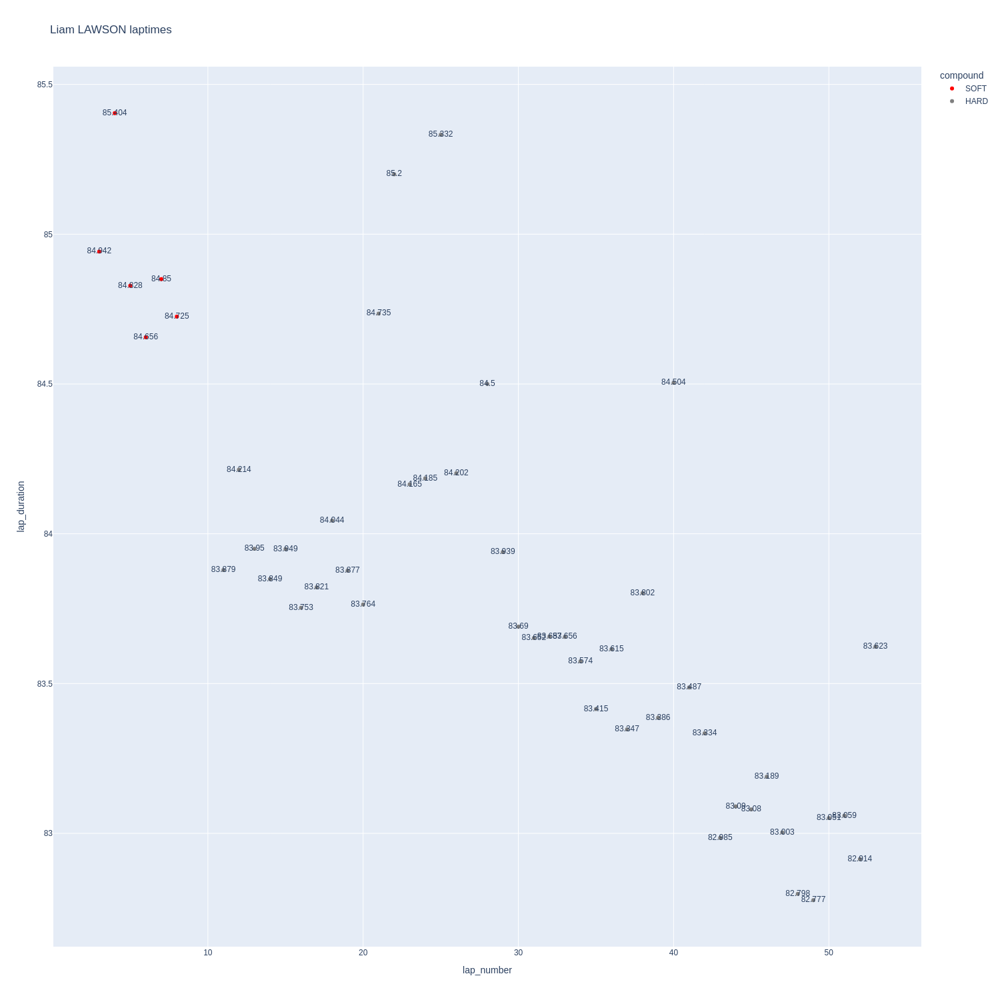

In [63]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

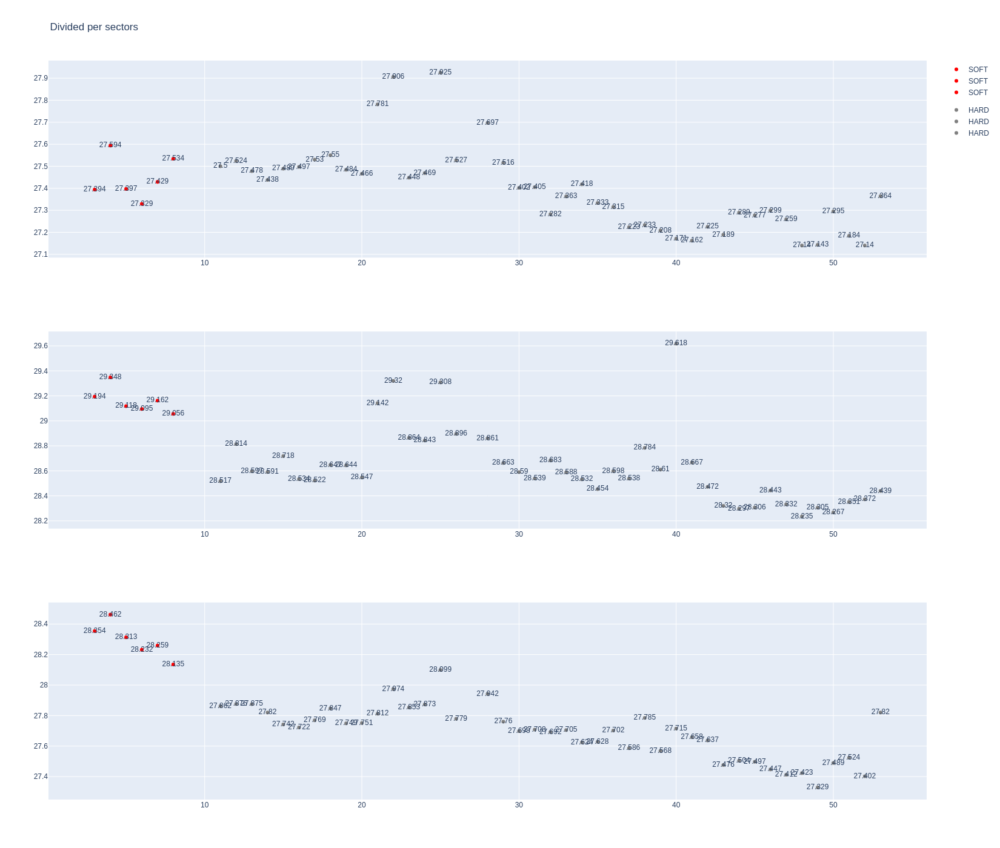

In [64]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [65]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
56,Isack HADJAR,HARD,2025-09-07T13:06:36.803000+00:00,3,27.609,29.650,28.208,85.467
75,Isack HADJAR,HARD,2025-09-07T13:08:02.335000+00:00,4,27.616,29.235,28.367,85.218
94,Isack HADJAR,HARD,2025-09-07T13:09:27.428000+00:00,5,27.340,29.360,28.187,84.887
113,Isack HADJAR,HARD,2025-09-07T13:10:52.351000+00:00,6,27.407,29.369,28.148,84.924
132,Isack HADJAR,HARD,2025-09-07T13:12:17.329000+00:00,7,27.494,28.929,28.183,84.606
151,Isack HADJAR,HARD,2025-09-07T13:13:41.856000+00:00,8,28.656,29.041,28.031,85.728
170,Isack HADJAR,HARD,2025-09-07T13:15:07.644000+00:00,9,27.403,28.666,28.098,84.167
188,Isack HADJAR,HARD,2025-09-07T13:16:31.717000+00:00,10,27.505,29.292,28.067,84.864
206,Isack HADJAR,HARD,2025-09-07T13:17:56.602000+00:00,11,27.595,28.820,28.234,84.649
225,Isack HADJAR,HARD,2025-09-07T13:19:21.312000+00:00,12,27.546,28.975,28.074,84.595


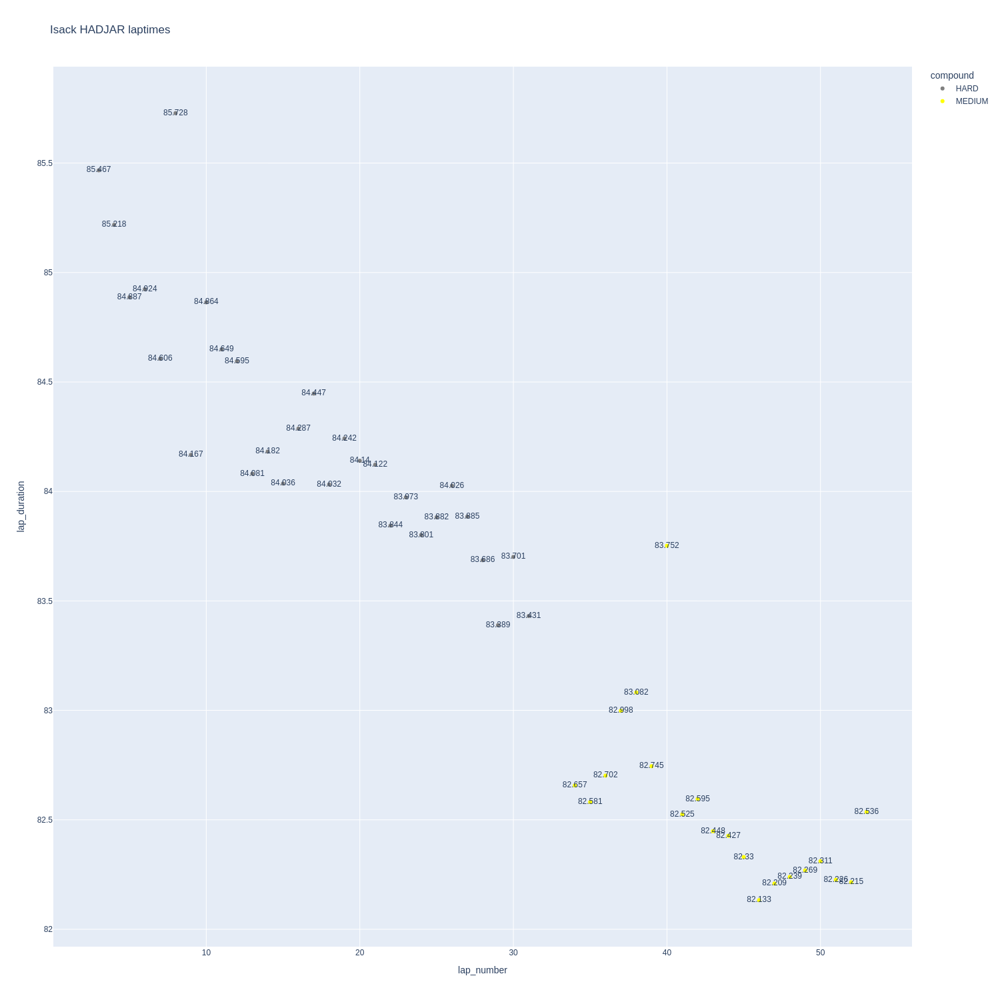

In [66]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

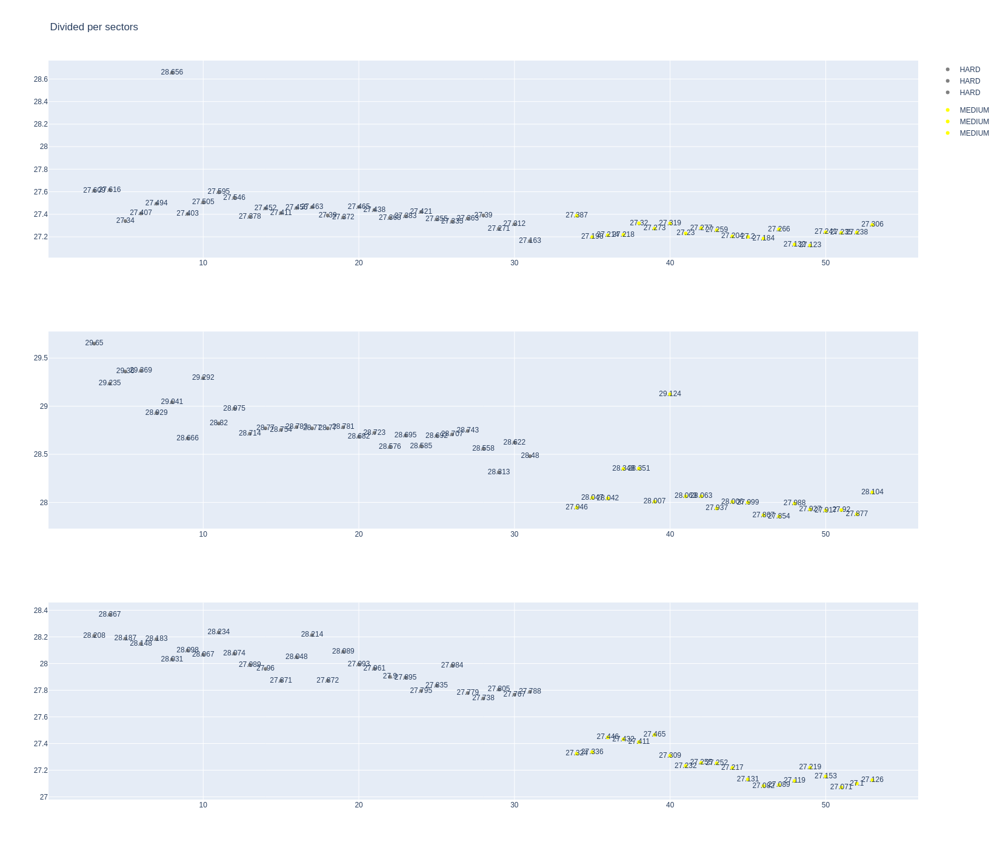

In [67]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [68]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1268,9912,1,87,1,18,MEDIUM,0
20,1268,9912,1,31,1,51,HARD,0
22,1268,9912,2,31,52,52,SOFT,0
36,1268,9912,2,87,19,53,HARD,0


In [69]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
33,Esteban OCON,HARD,2025-09-07T13:05:08.431000+00:00,2,28.398,28.920,28.579,85.897
52,Esteban OCON,HARD,2025-09-07T13:06:34.271000+00:00,3,27.355,29.410,28.390,85.155
71,Esteban OCON,HARD,2025-09-07T13:07:59.600000+00:00,4,27.582,29.397,28.456,85.435
90,Esteban OCON,HARD,2025-09-07T13:09:25.055000+00:00,5,27.331,29.044,28.310,84.685
109,Esteban OCON,HARD,2025-09-07T13:10:49.664000+00:00,6,27.256,29.079,28.315,84.650
128,Esteban OCON,HARD,2025-09-07T13:12:14.298000+00:00,7,27.447,29.087,28.316,84.850
147,Esteban OCON,HARD,2025-09-07T13:13:38.982000+00:00,8,27.471,28.952,28.185,84.608
166,Esteban OCON,HARD,2025-09-07T13:15:03.622000+00:00,9,27.351,29.060,28.246,84.657
185,Esteban OCON,HARD,2025-09-07T13:16:28.326000+00:00,10,27.444,28.819,28.203,84.466
203,Esteban OCON,HARD,2025-09-07T13:17:52.727000+00:00,11,27.438,28.825,28.226,84.489


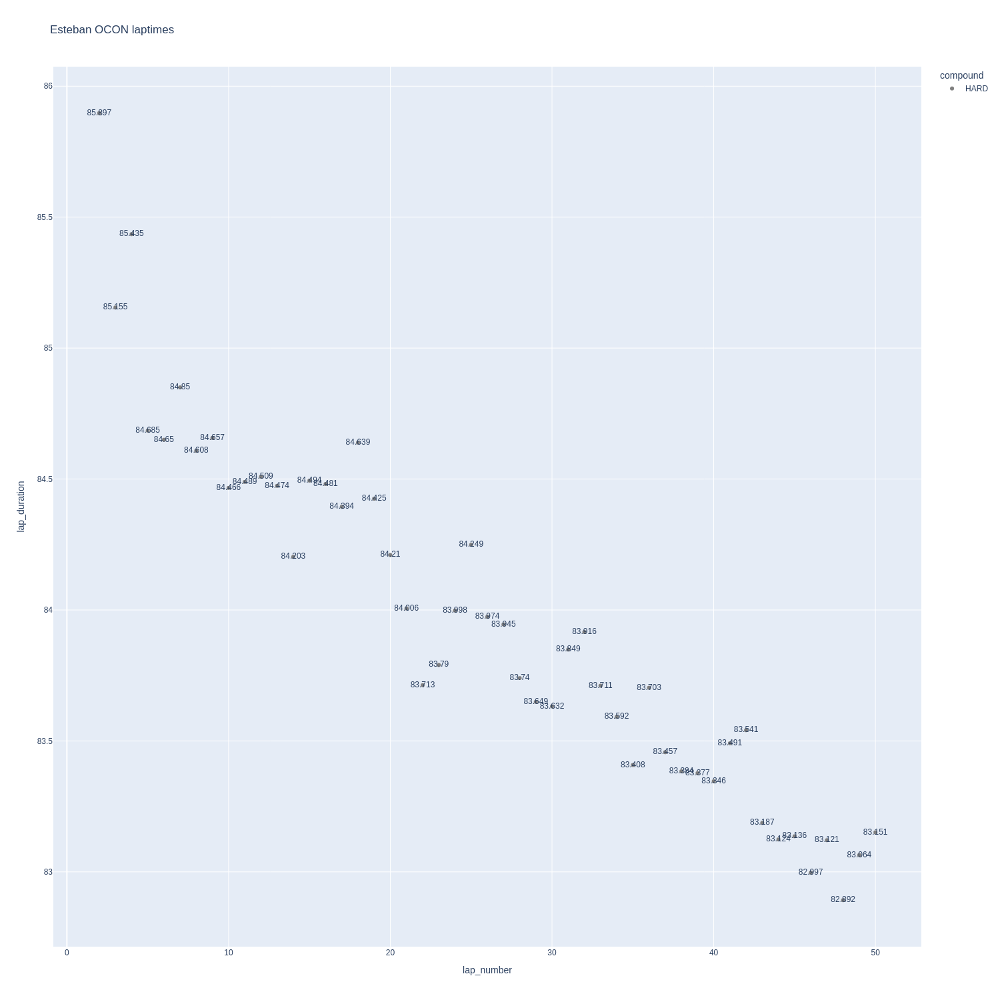

In [70]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

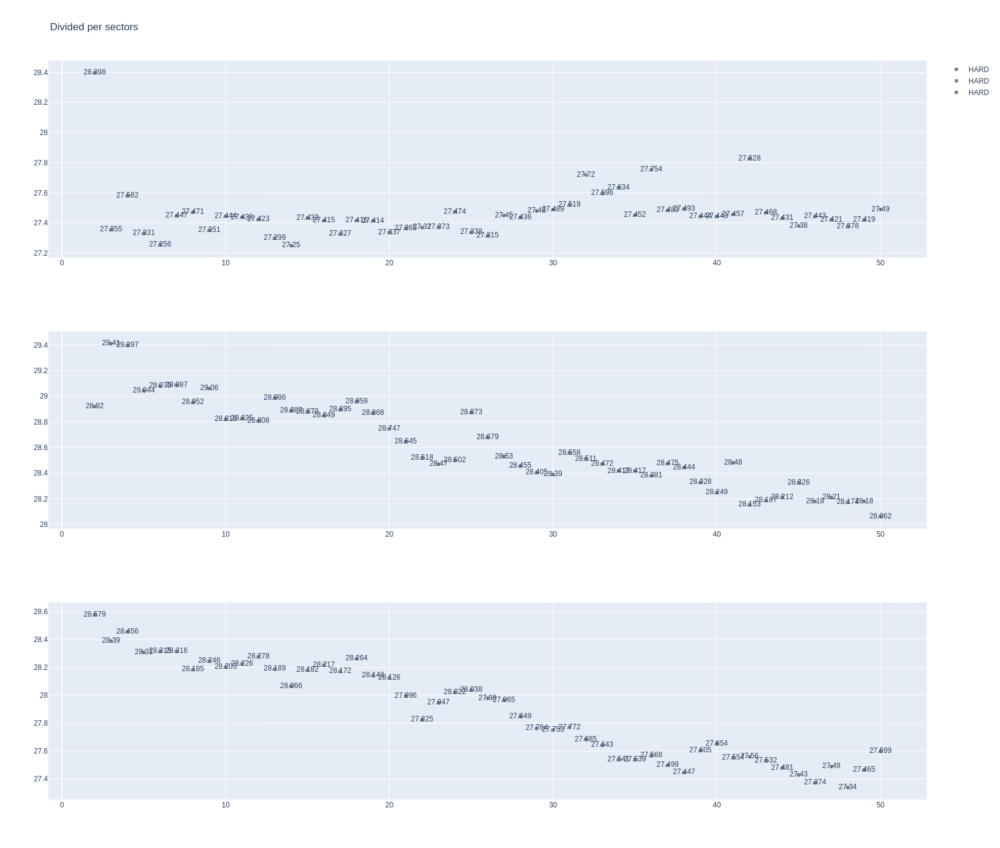

In [71]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [72]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Oliver BEARMAN,MEDIUM,2025-09-07T13:05:07.166000+00:00,2,27.910,29.363,28.398,85.671
49,Oliver BEARMAN,MEDIUM,2025-09-07T13:06:32.849000+00:00,3,27.504,29.406,28.510,85.420
68,Oliver BEARMAN,MEDIUM,2025-09-07T13:07:58.241000+00:00,4,27.563,29.162,28.160,84.885
87,Oliver BEARMAN,MEDIUM,2025-09-07T13:09:23.282000+00:00,5,27.591,29.143,28.095,84.829
106,Oliver BEARMAN,MEDIUM,2025-09-07T13:10:47.982000+00:00,6,27.447,29.068,28.230,84.745
125,Oliver BEARMAN,MEDIUM,2025-09-07T13:12:12.721000+00:00,7,27.633,28.919,28.073,84.625
144,Oliver BEARMAN,MEDIUM,2025-09-07T13:13:37.304000+00:00,8,27.518,28.916,28.060,84.494
163,Oliver BEARMAN,MEDIUM,2025-09-07T13:15:01.854000+00:00,9,27.649,28.879,27.992,84.520
182,Oliver BEARMAN,MEDIUM,2025-09-07T13:16:26.295000+00:00,10,27.517,28.930,28.087,84.534
200,Oliver BEARMAN,MEDIUM,2025-09-07T13:17:50.883000+00:00,11,27.558,28.962,28.142,84.662


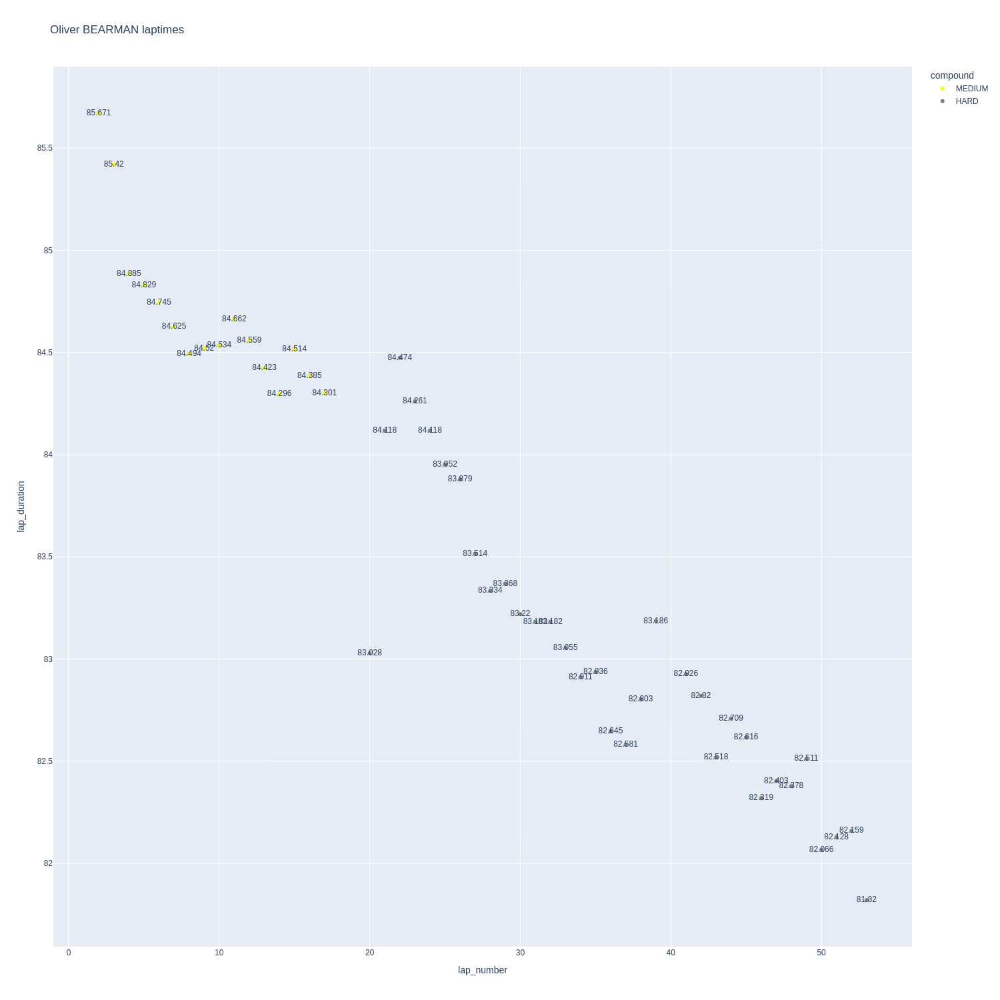

In [73]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

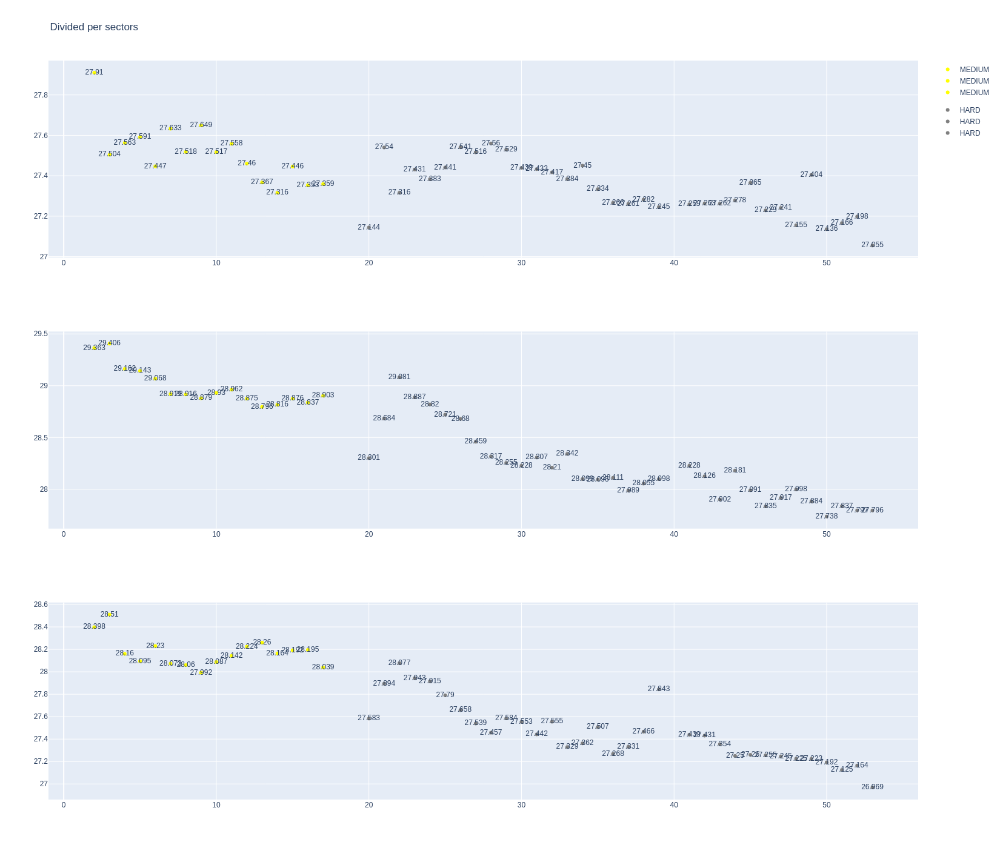

In [74]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [75]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1268,9912,1,43,1,33,MEDIUM,0
19,1268,9912,1,10,1,49,HARD,0
23,1268,9912,2,10,50,52,SOFT,0
24,1268,9912,2,43,34,52,HARD,0


In [76]:
data =libraryDataF1.getinfolongruns(jointables,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
55,Franco COLAPINTO,MEDIUM,2025-09-07T13:06:36.318000+00:00,3,27.648,29.365,28.333,85.346
74,Franco COLAPINTO,MEDIUM,2025-09-07T13:08:01.757000+00:00,4,27.363,29.501,28.176,85.040
93,Franco COLAPINTO,MEDIUM,2025-09-07T13:09:26.770000+00:00,5,27.726,28.972,28.247,84.945
112,Franco COLAPINTO,MEDIUM,2025-09-07T13:10:51.632000+00:00,6,27.594,29.083,28.267,84.944
131,Franco COLAPINTO,MEDIUM,2025-09-07T13:12:16.626000+00:00,7,27.589,29.154,28.143,84.886
150,Franco COLAPINTO,MEDIUM,2025-09-07T13:13:41.499000+00:00,8,27.847,29.118,28.139,85.104
169,Franco COLAPINTO,MEDIUM,2025-09-07T13:15:06.510000+00:00,9,27.617,28.930,28.269,84.816
187,Franco COLAPINTO,MEDIUM,2025-09-07T13:16:31.420000+00:00,10,27.613,29.239,27.876,84.728
205,Franco COLAPINTO,MEDIUM,2025-09-07T13:17:56.133000+00:00,11,27.661,28.925,28.182,84.768
224,Franco COLAPINTO,MEDIUM,2025-09-07T13:19:20.931000+00:00,12,27.649,28.960,28.097,84.706


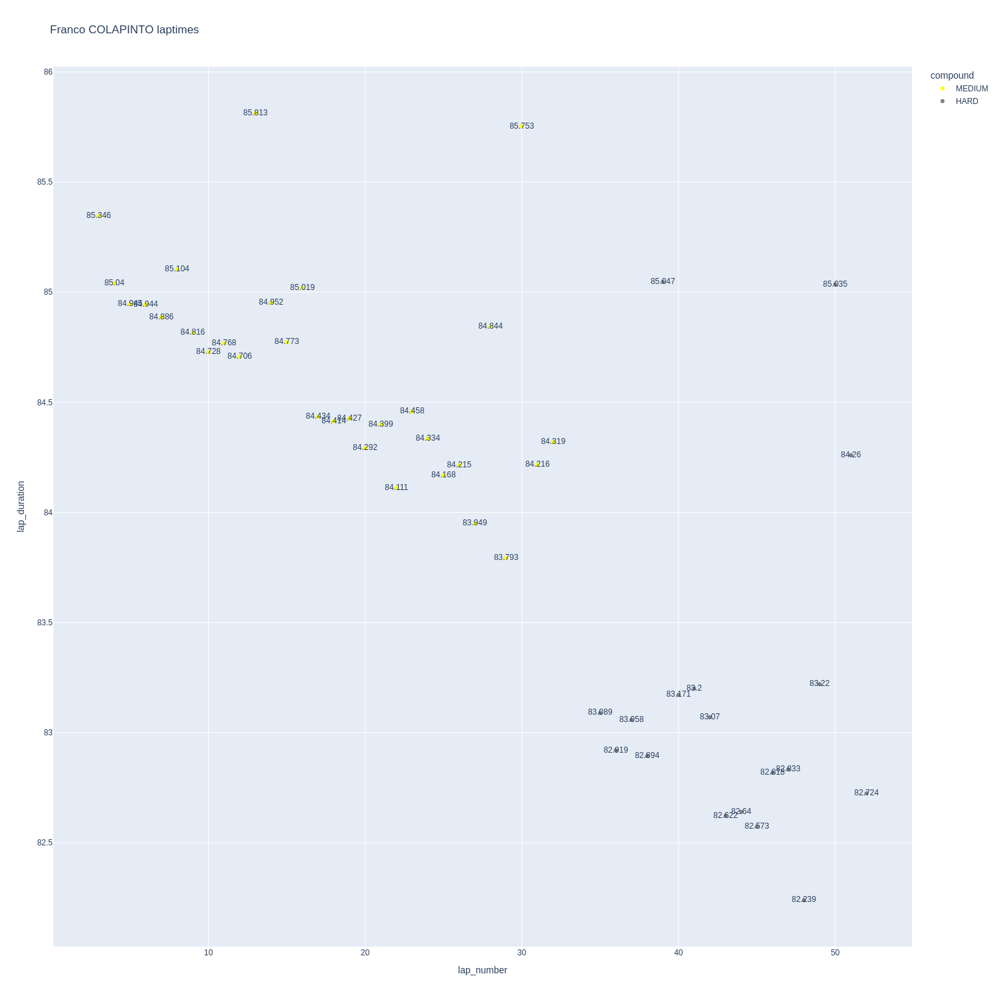

In [77]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

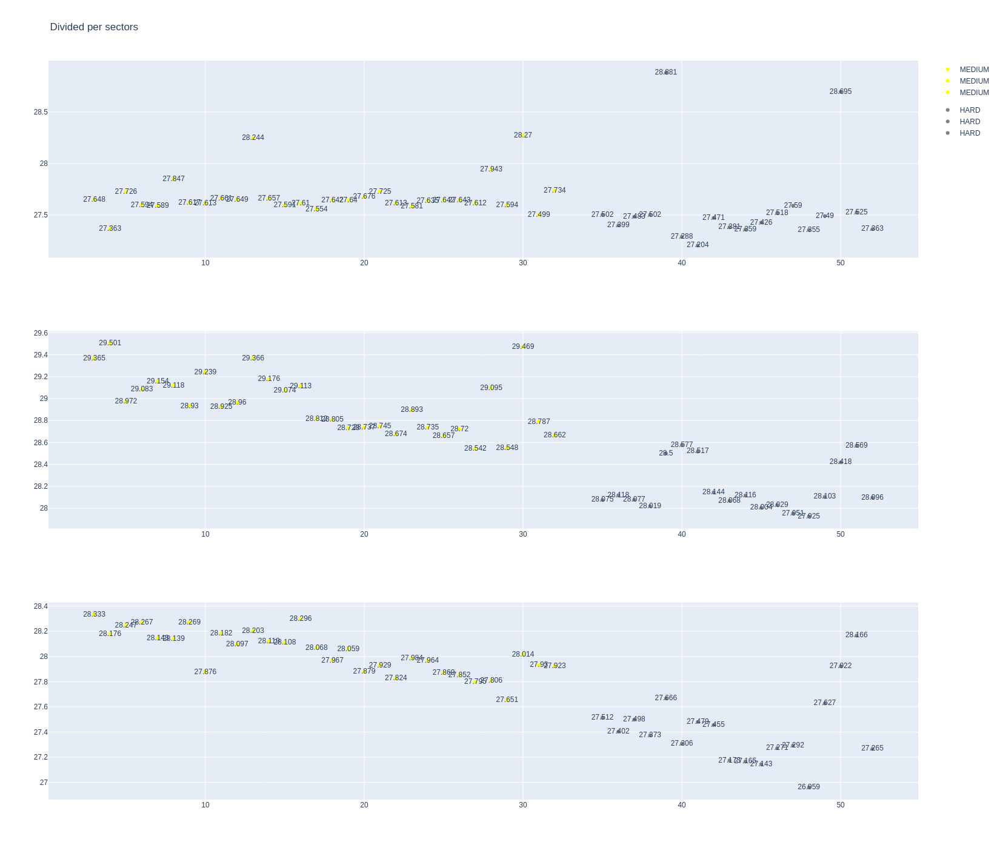

In [78]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [79]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
57,Pierre GASLY,HARD,2025-09-07T13:06:37.443000+00:00,3,27.716,29.646,28.144,85.506
76,Pierre GASLY,HARD,2025-09-07T13:08:03.054000+00:00,4,27.402,29.516,28.402,85.320
95,Pierre GASLY,HARD,2025-09-07T13:09:28.307000+00:00,5,27.542,29.258,29.191,85.991
114,Pierre GASLY,HARD,2025-09-07T13:10:54.273000+00:00,6,27.609,29.118,28.260,84.987
133,Pierre GASLY,HARD,2025-09-07T13:12:19.345000+00:00,7,27.756,28.944,28.072,84.772
152,Pierre GASLY,HARD,2025-09-07T13:13:44.002000+00:00,8,27.673,29.362,28.123,85.158
171,Pierre GASLY,HARD,2025-09-07T13:15:09.257000+00:00,9,27.594,29.195,28.079,84.868
189,Pierre GASLY,HARD,2025-09-07T13:16:34.029000+00:00,10,27.684,28.875,28.001,84.560
207,Pierre GASLY,HARD,2025-09-07T13:17:58.555000+00:00,11,27.653,28.981,28.033,84.667
226,Pierre GASLY,HARD,2025-09-07T13:19:23.265000+00:00,12,27.695,28.997,28.171,84.863


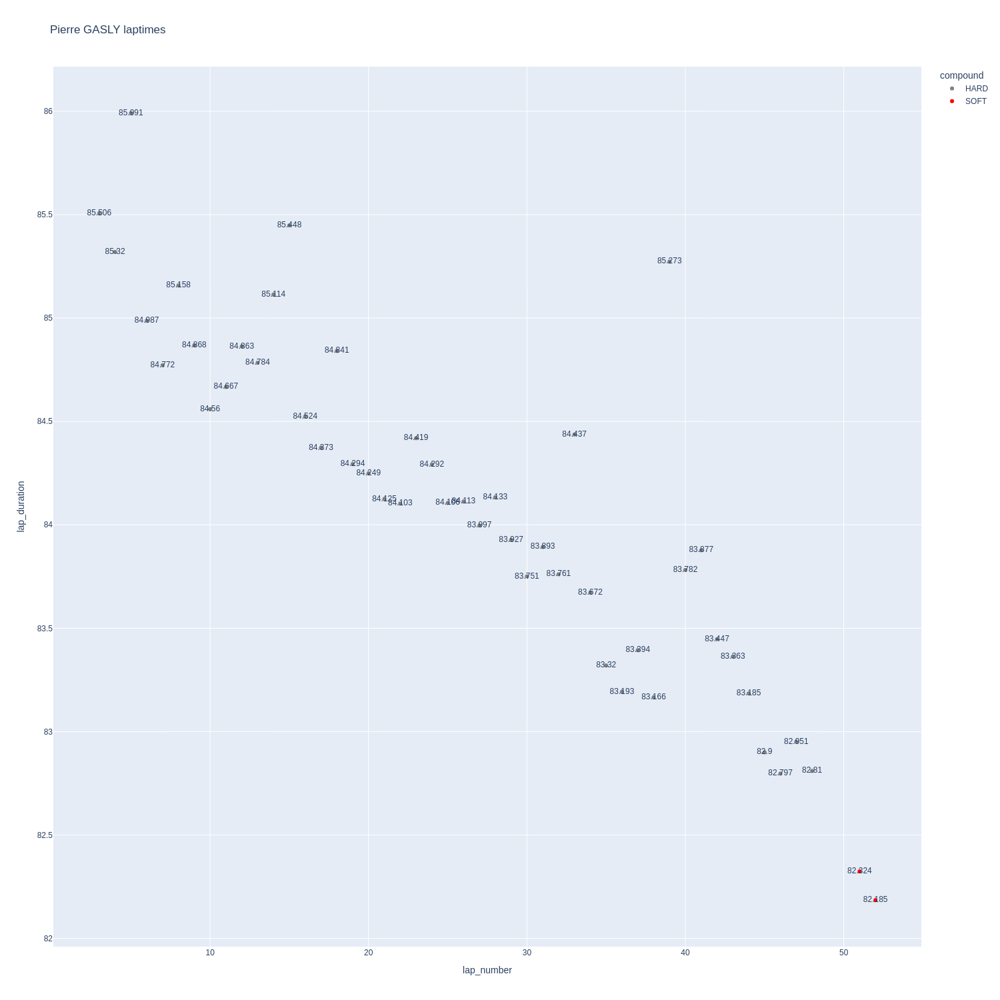

In [80]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

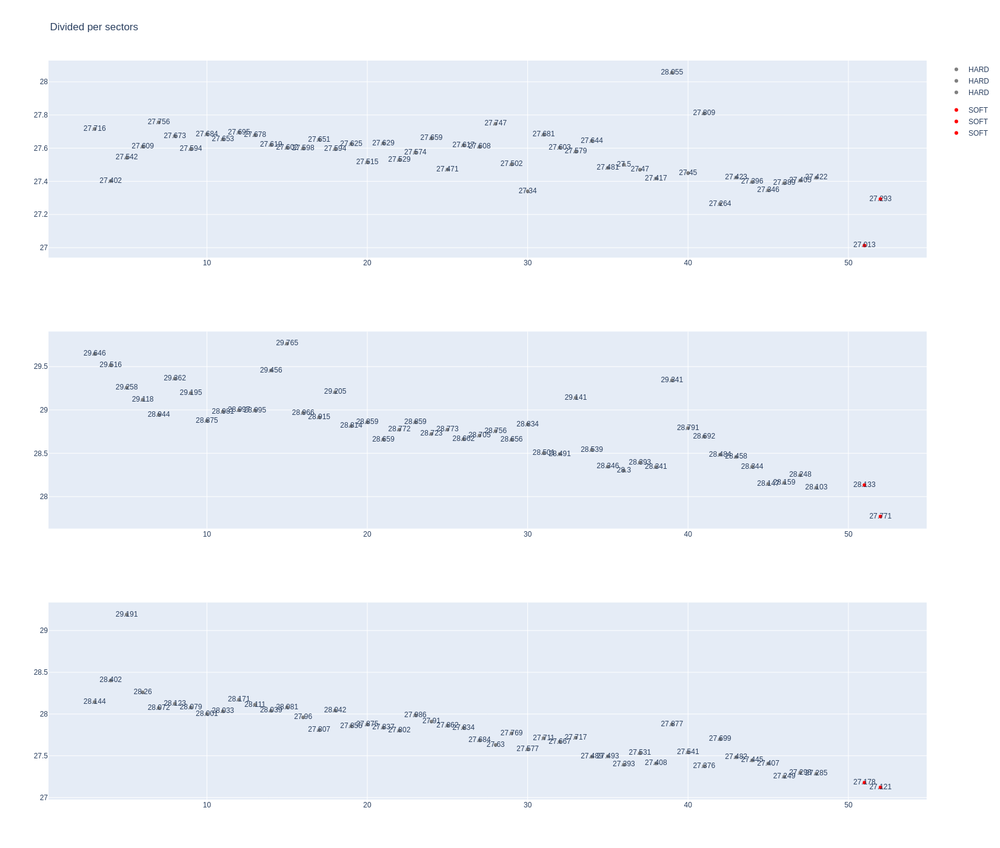

In [81]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [82]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1268,9912,1,55,1,30,MEDIUM,0
15,1268,9912,1,23,1,41,HARD,0
31,1268,9912,2,23,42,53,MEDIUM,0
35,1268,9912,2,55,31,53,HARD,0


In [83]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
32,Alexander ALBON,HARD,2025-09-07T13:05:08.025000+00:00,2,27.809,29.380,28.573,85.762
51,Alexander ALBON,HARD,2025-09-07T13:06:33.881000+00:00,3,27.410,29.424,28.404,85.238
70,Alexander ALBON,HARD,2025-09-07T13:07:59.210000+00:00,4,27.608,29.388,28.431,85.427
89,Alexander ALBON,HARD,2025-09-07T13:09:24.554000+00:00,5,27.170,29.072,28.356,84.598
108,Alexander ALBON,HARD,2025-09-07T13:10:49.105000+00:00,6,27.261,29.151,28.331,84.743
127,Alexander ALBON,HARD,2025-09-07T13:12:13.829000+00:00,7,27.422,29.028,28.286,84.736
146,Alexander ALBON,HARD,2025-09-07T13:13:38.585000+00:00,8,27.502,28.825,28.226,84.553
165,Alexander ALBON,HARD,2025-09-07T13:15:03.109000+00:00,9,27.329,29.057,28.261,84.647
184,Alexander ALBON,HARD,2025-09-07T13:16:27.717000+00:00,10,27.291,28.873,28.289,84.453
202,Alexander ALBON,HARD,2025-09-07T13:17:52.196000+00:00,11,27.301,28.943,28.270,84.514


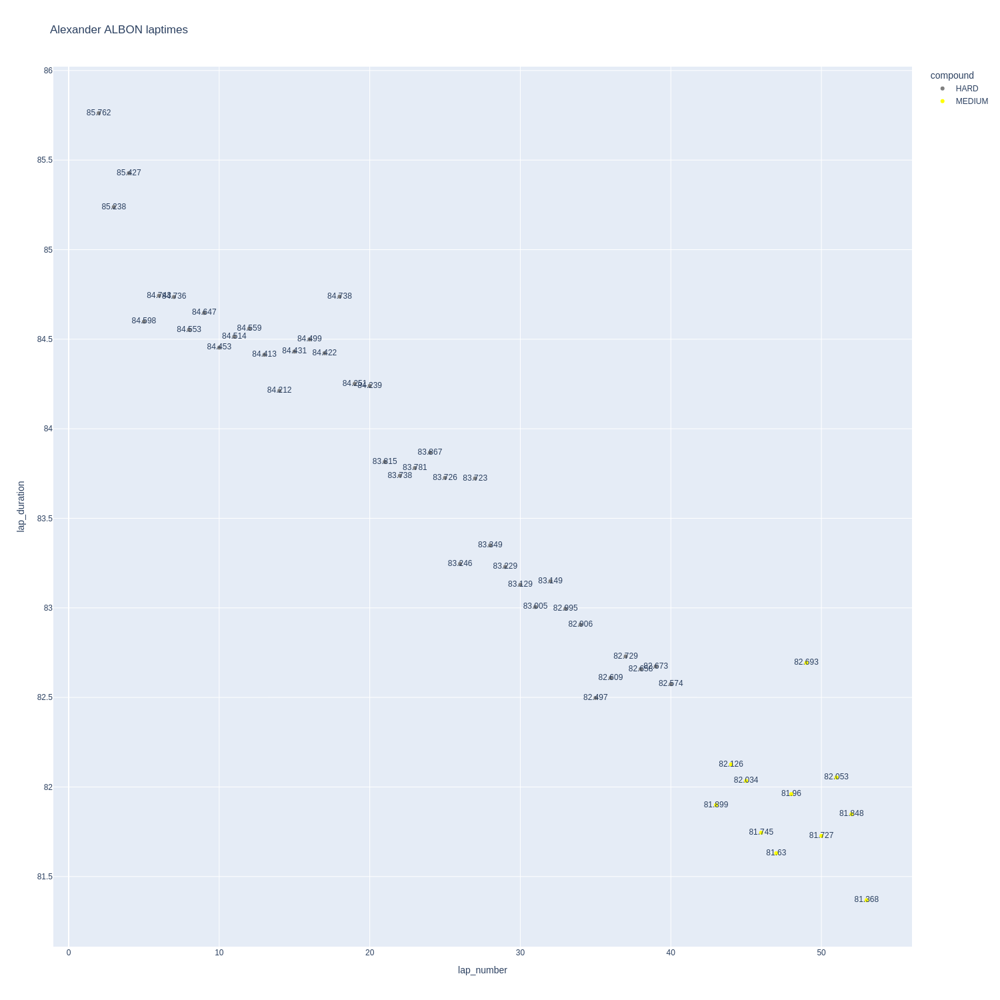

In [84]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

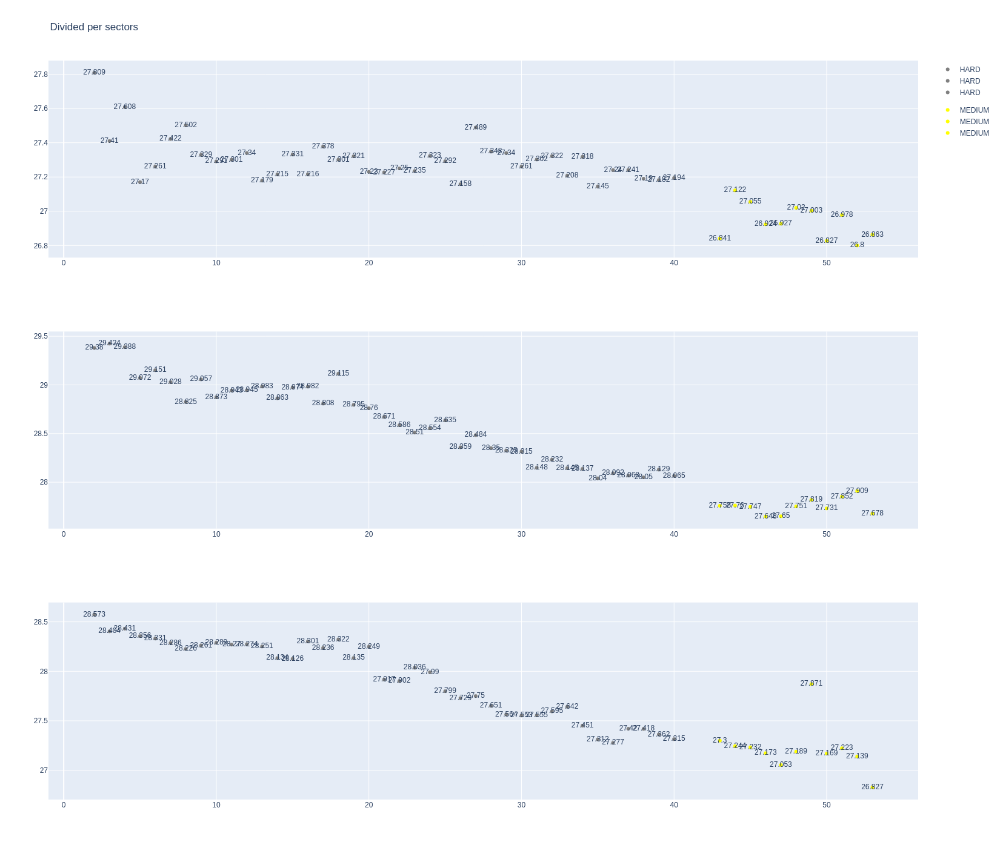

In [85]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [86]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,Carlos SAINZ,MEDIUM,2025-09-07T13:05:07.650000+00:00,2,27.813,29.350,28.465,85.628
50,Carlos SAINZ,MEDIUM,2025-09-07T13:06:33.334000+00:00,3,27.502,29.500,28.412,85.414
69,Carlos SAINZ,MEDIUM,2025-09-07T13:07:58.710000+00:00,4,27.578,29.394,28.232,85.204
88,Carlos SAINZ,MEDIUM,2025-09-07T13:09:23.977000+00:00,5,27.287,29.181,28.259,84.727
107,Carlos SAINZ,MEDIUM,2025-09-07T13:10:48.609000+00:00,6,27.233,29.066,28.405,84.704
126,Carlos SAINZ,MEDIUM,2025-09-07T13:12:13.228000+00:00,7,27.339,29.145,28.192,84.676
145,Carlos SAINZ,MEDIUM,2025-09-07T13:13:38.001000+00:00,8,27.590,28.784,28.330,84.704
164,Carlos SAINZ,MEDIUM,2025-09-07T13:15:02.705000+00:00,9,27.357,28.941,28.091,84.389
183,Carlos SAINZ,MEDIUM,2025-09-07T13:16:27.170000+00:00,10,27.391,28.918,28.174,84.483
201,Carlos SAINZ,MEDIUM,2025-09-07T13:17:51.555000+00:00,11,27.458,29.028,28.106,84.592


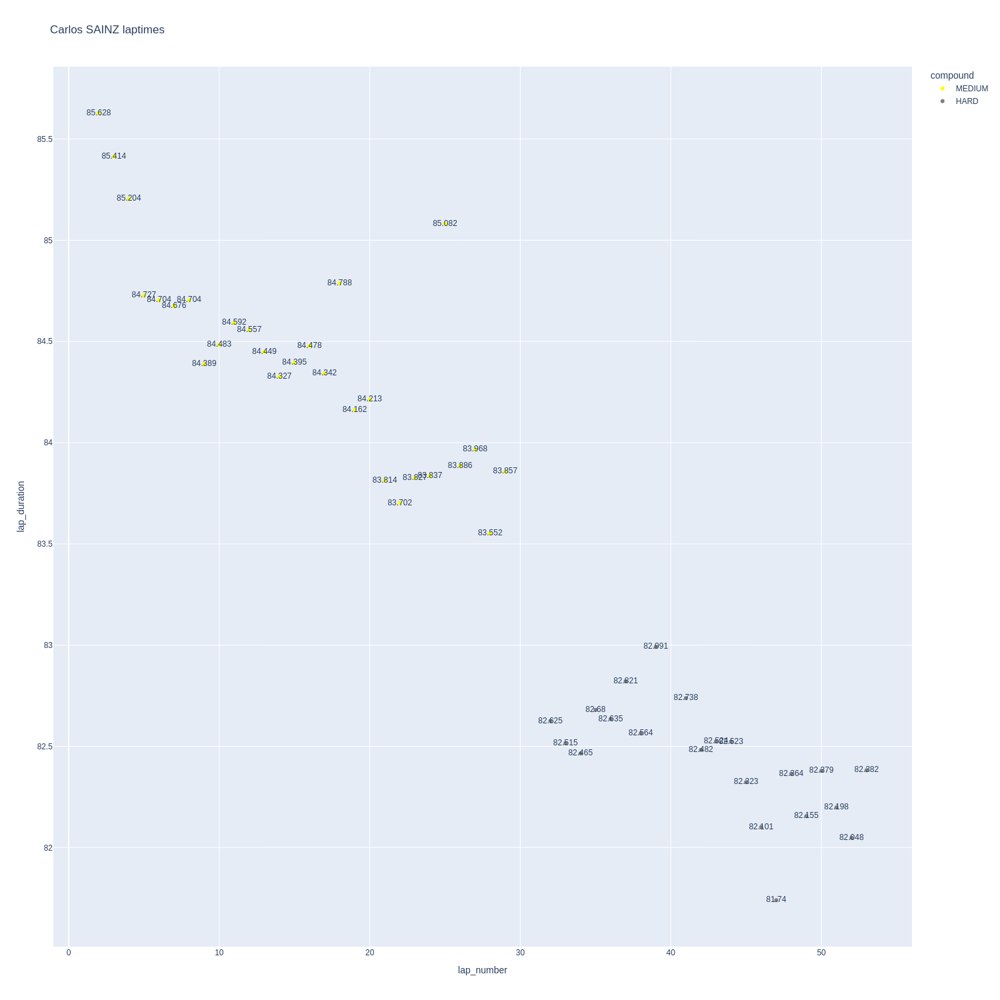

In [87]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

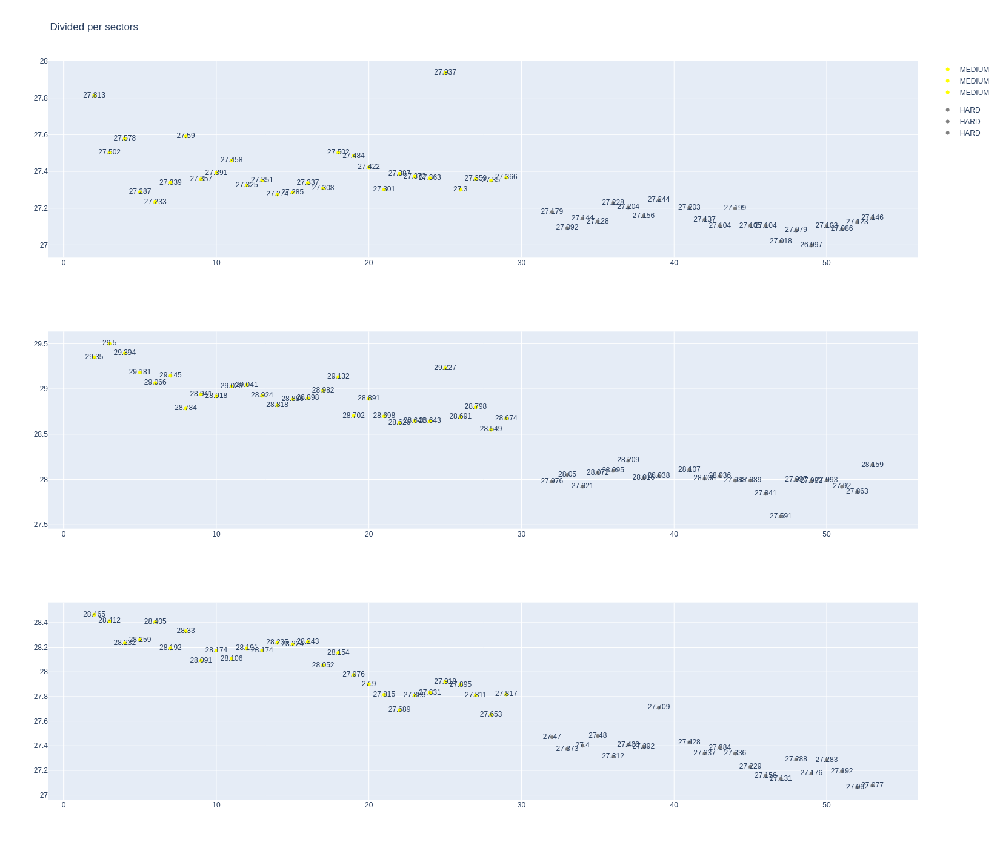

In [88]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [89]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1268,9912,1,27,1,1,MEDIUM,0
4,1268,9912,1,5,1,20,MEDIUM,0
33,1268,9912,2,5,21,53,HARD,0


In [90]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [91]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [92]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [93]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:05:05.231000+00:00,2,27.588,28.937,28.298,84.823
44,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:06:30.115000+00:00,3,27.553,29.583,28.218,85.354
63,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:07:55.569000+00:00,4,27.484,29.009,28.251,84.744
82,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:09:20.281000+00:00,5,27.524,28.790,28.015,84.329
101,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:10:44.571000+00:00,6,27.473,28.841,28.288,84.602
120,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:12:09.273000+00:00,7,27.824,29.009,28.208,85.041
140,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:13:34.192000+00:00,8,27.585,28.901,28.243,84.729
159,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:14:58.912000+00:00,9,27.405,28.944,28.082,84.431
178,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:16:23.342000+00:00,10,27.729,28.736,28.052,84.517
196,Gabriel BORTOLETO,MEDIUM,2025-09-07T13:17:47.915000+00:00,11,27.589,28.775,28.185,84.549


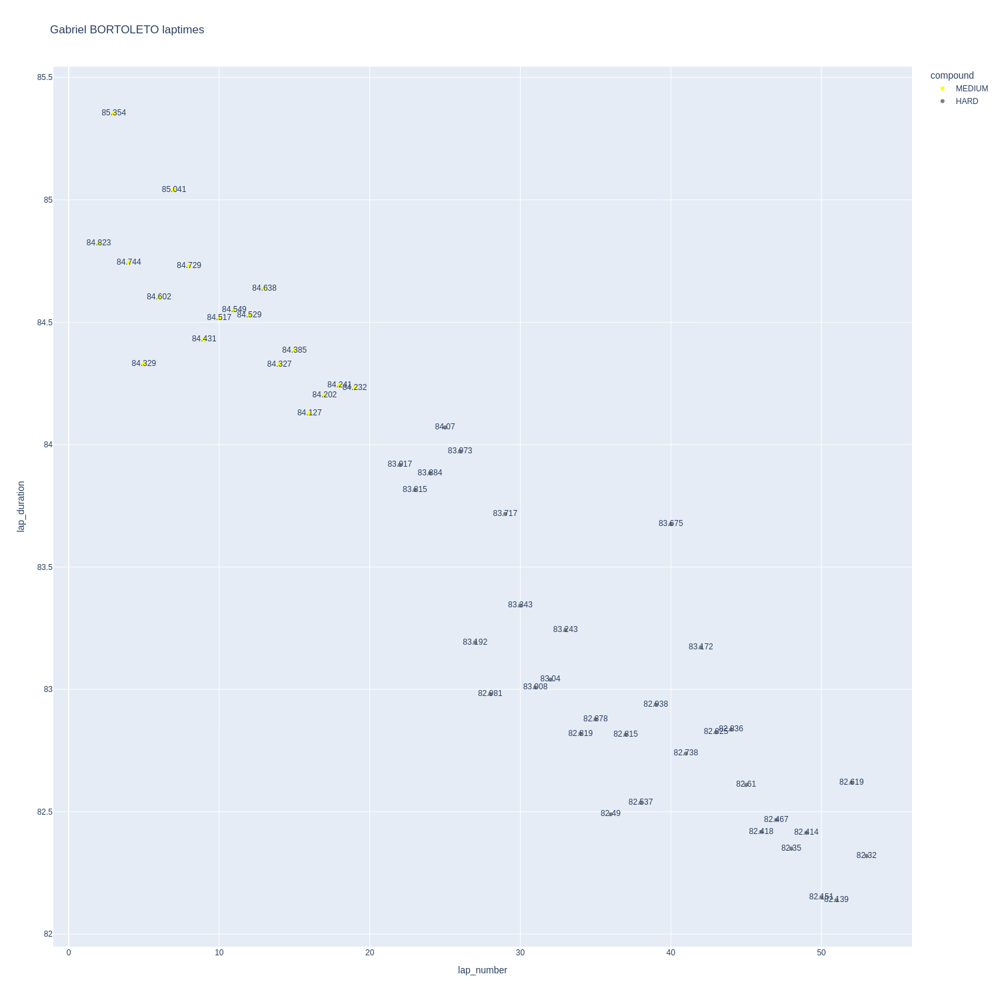

In [94]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

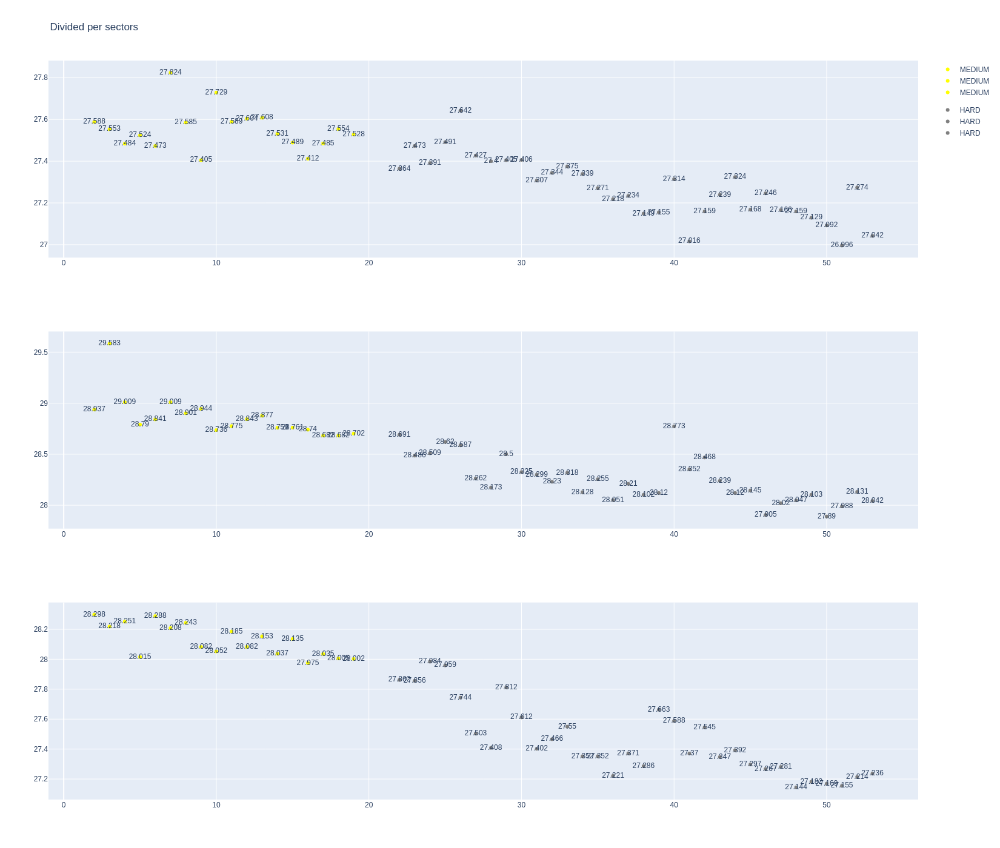

In [95]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [96]:
pit = libraryDataF1.obtain_information('pit',session_key=9912)

In [97]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Ferrari,24.05
Racing Bulls,24.20
Red Bull Racing,24.40
Williams,24.65
Alpine,24.95
Mercedes,24.95
McLaren,25.50
Kick Sauber,26.10
Haas F1 Team,28.00
